In [ ]:
!pip install flask


In [ ]:
import pandas as pd
import numpy as np
from decimal import Decimal
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sn
import os
import plotly.graph_objs as go
import plotly.offline as py
py.init_notebook_mode(connected=True)
pd.options.mode.chained_assignment = None
pd.options.display.max_columns = 9999
pd.options.display.float_format = '{:20,.2f}'.format
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

## Flow
1. Root Cause analysis, cost & delay (why pick that features) **Interpretation**
2. Feature Engineering
3. Business Objective
4. Conculsion and Insight

### Data Description :
- PQ# : Price Quote number asscociated with the spesific line item in or oder
- PO/ SO : Purchase order or Sales Order number for the transaction
- ASN/ DN : Advance shipment note (ASN) or Delivery note (DN) number of shipment
- Country : Destination country for the shipment
- Managed by : The office or team responsible for managing the shipment
- Full fill Via : method used to fullfill the shipment (direct vendor delivery or regional distribution center )
- Vendor Inco Team : International commertial terms (INCO) agreed upon with the vendor.
- Shipment Mode : Mode of transport for shipping ( air, sea, or road)
- PQ First Sent to Client Date : Date when Price Quote was first sent to the client
- PQ sent to Vendor Date : Date when the purchase order was sent to the vendor
- Scheduled Delivery Date : Expected date for delivering the shipment to the client
- Delivery to Client Date : Actual date when the shipment was delivered to the client
- Delivery Recorder date : Date when the delivery was officialy recorder in the system
- Product Group : Broad Category or classification of the product being shipped
- Sub Classification : A more detailed classification of the product
- Vendor : The supplier or manufactur of the product
- Item description : Detailed description of the item being ordered
- Molecule/ Test Type : Specifies the active pharmaceutical ingredient(API) or diagnostic test type
- Brand : the brand name of the product
- Dossage: The strength or amount of active ingredient per unit
- Dosage form : The form of product (tablet, liquid, injection)
- Unit of measure : The measurement unit used for each pack
- Line item Quantitiy : Number or units for the specific line item in the order
- Line Item Value: Total monetary value of the specific line item.
- Pack Price: Price per pack of the product.
- Unit Price: Price per unit within a pack.
- Manufacturing Site: The location where the product was manufactured.
- First Line Designation: Indicates whether the product is designated for first-line treatment.
- Weight (Kilograms): Weight of the shipment in kilograms.

- Freight Cost (USD):  Cost of shipping the goods in US dollars.

- Line Item Insurance (USD) : Insurance cost associated with the specific line item.


In [ ]:
df = pd.read_csv('/content/SCMS_Delivery_History_Dataset.csv')
df.tail()

,ID,Project Code,PQ #,PO / SO #,ASN/DN #,Country,Managed By,Fulfill Via,Vendor INCO Term,Shipment Mode,PQ First Sent to Client Date,PO Sent to Vendor Date,Scheduled Delivery Date,Delivered to Client Date,Delivery Recorded Date,Product Group,Sub Classification,Vendor,Item Description,Molecule/Test Type,Brand,Dosage,Dosage Form,Unit of Measure (Per Pack),Line Item Quantity,Line Item Value,Pack Price,Unit Price,Manufacturing Site,First Line Designation,Weight (Kilograms),Freight Cost (USD),Line Item Insurance (USD)
10319,86818,103-ZW-T30,FPQ-15197,SO-50020,DN-4307,Zimbabwe,PMO - US,From RDC,N/A - From RDC,Truck,10/16/14,N/A - From RDC,31-Jul-15,15-Jul-15,20-Jul-15,ARV,Pediatric,SCMS from RDC,"Lamivudine/Nevirapine/Zidovudine 30/50/60mg, d...",Lamivudine/Nevirapine/Zidovudine,Generic,30/50/60mg,Chewable/dispersible tablet - FDC,60,166571,"599,655.60",3.60,0.06,"Mylan, H-12 & H-13, India",No,See DN-4307 (ID#:83920),See DN-4307 (ID#:83920),705.79
10320,86819,104-CI-T30,FPQ-15259,SO-50102,DN-4313,Côte d'Ivoire,PMO - US,From RDC,N/A - From RDC,Truck,10/24/14,N/A - From RDC,31-Jul-15,6-Aug-15,7-Aug-15,ARV,Adult,SCMS from RDC,"Lamivudine/Zidovudine 150/300mg, tablets, 60 Tabs",Lamivudine/Zidovudine,Generic,150/300mg,Tablet - FDC,60,21072,"137,389.44",6.52,0.11,Hetero Unit III Hyderabad IN,No,See DN-4313 (ID#:83921),See DN-4313 (ID#:83921),161.71
10321,86821,110-ZM-T30,FPQ-14784,SO-49600,DN-4316,Zambia,PMO - US,From RDC,N/A - From RDC,Truck,8/12/14,N/A - From RDC,31-Aug-15,25-Aug-15,3-Sep-15,ARV,Adult,SCMS from RDC,Efavirenz/Lamivudine/Tenofovir Disoproxil Fuma...,Efavirenz/Lamivudine/Tenofovir Disoproxil Fuma...,Generic,600/300/300mg,Tablet - FDC,30,514526,"5,140,114.74",9.99,0.33,Cipla Ltd A-42 MIDC Mahar. IN,No,Weight Captured Separately,Freight Included in Commodity Cost,"5,284.04"
10322,86822,200-ZW-T30,FPQ-16523,SO-51680,DN-4334,Zimbabwe,PMO - US,From RDC,N/A - From RDC,Truck,7/1/15,N/A - From RDC,9-Sep-15,4-Aug-15,11-Aug-15,ARV,Adult,SCMS from RDC,"Lamivudine/Zidovudine 150/300mg, tablets, 60 Tabs",Lamivudine/Zidovudine,Generic,150/300mg,Tablet - FDC,60,17465,"113,871.80",6.52,0.11,Mylan (formerly Matrix) Nashik,Yes,1392,Freight Included in Commodity Cost,134.03
10323,86823,103-ZW-T30,FPQ-15197,SO-50022,DN-4336,Zimbabwe,PMO - US,From RDC,N/A - From RDC,Truck,10/16/14,N/A - From RDC,31-Aug-15,4-Aug-15,11-Aug-15,ARV,Pediatric,SCMS from RDC,"Lamivudine/Zidovudine 30/60mg, dispersible tab...",Lamivudine/Zidovudine,Generic,30/60mg,Chewable/dispersible tablet - FDC,60,36639,"72,911.61",1.99,0.03,"Cipla, Goa, India",No,Weight Captured Separately,Freight Included in Commodity Cost,85.82


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10324 entries, 0 to 10323
Data columns (total 33 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   ID                            10324 non-null  int64  
 1   Project Code                  10324 non-null  object 
 2   PQ #                          10324 non-null  object 
 3   PO / SO #                     10324 non-null  object 
 4   ASN/DN #                      10324 non-null  object 
 5   Country                       10324 non-null  object 
 6   Managed By                    10324 non-null  object 
 7   Fulfill Via                   10324 non-null  object 
 8   Vendor INCO Term              10324 non-null  object 
 9   Shipment Mode                 9964 non-null   object 
 10  PQ First Sent to Client Date  10324 non-null  object 
 11  PO Sent to Vendor Date        10324 non-null  object 
 12  Scheduled Delivery Date       10324 non-null  object 
 13  D

In [ ]:
# Calculate the percentage of missing values for each column
missing_percentage = df.isnull().sum() * 100 / len(df)

# Print the result
missing_percentage

,0
ID,0.00
Project Code,0.00
PQ #,0.00
PO / SO #,0.00
ASN/DN #,0.00
Country,0.00
Managed By,0.00
Fulfill Via,0.00
Vendor INCO Term,0.00
Shipment Mode,3.49


Obser vation :
1. Dosage has highest no if null values around 17%
2. Shipment cost and line item insurance has similiar no of null values

<Axes: >

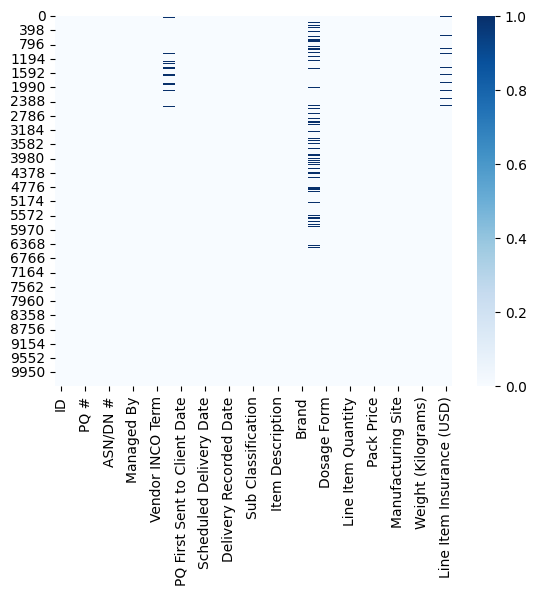

In [ ]:
# heatmap for null values
sn.heatmap(df.isnull(), cmap ="Blues")

In [ ]:
df.duplicated().sum()

0

Theres no duplicated values

In [ ]:
# Statistic Analysis
df.describe().T

,count,mean,std,min,25%,50%,75%,max
ID,"10,324.00","51,098.97","31,944.33",1.00,"12,795.75","57,540.50","83,648.25","86,823.00"
Unit of Measure (Per Pack),"10,324.00",77.99,76.58,1.00,30.00,60.00,90.00,"1,000.00"
Line Item Quantity,"10,324.00","18,332.53","40,035.30",1.00,408.00,"3,000.00","17,039.75","619,999.00"
Line Item Value,"10,324.00","157,650.57","345,292.07",0.00,"4,314.59","30,471.47","166,447.14","5,951,990.40"
Pack Price,"10,324.00",21.91,45.61,0.00,4.12,9.30,23.59,"1,345.64"
Unit Price,"10,324.00",0.61,3.28,0.00,0.08,0.16,0.47,238.65
Line Item Insurance (USD),"10,037.00",240.12,500.19,0.00,6.51,47.04,252.40,"7,708.44"


In [ ]:
df.describe(include = object).T

,count,unique,top,freq
Project Code,10324,142,116-ZA-T30,768
PQ #,10324,1237,Pre-PQ Process,2681
PO / SO #,10324,6233,SCMS-199289,67
ASN/DN #,10324,7030,ASN-19166,54
Country,10324,43,South Africa,1406
Managed By,10324,4,PMO - US,10265
Fulfill Via,10324,2,From RDC,5404
Vendor INCO Term,10324,8,N/A - From RDC,5404
Shipment Mode,9964,4,Air,6113
PQ First Sent to Client Date,10324,765,Pre-PQ Process,2476


# EDA

In [ ]:
# Dictionaries with ID as keys and weight/freight as values
id_weight = dict(zip(df['ID'],df['Weight (Kilograms)']))
id_freight = dict(zip(df['ID'],df['Freight Cost (USD)']))

In [ ]:
# Functions to get weight and freight from corresponding ID numbers
def get_weight(data):
    data = pd.to_numeric(data, errors = 'ignore')
    if type(data) == str:
        try:
            d = data.split(':')
            e = d[1][:-1]
            return id_weight.get(int(e))
        except:
            return (data)
    else:
        return (data)

def get_freight(data):
    data = pd.to_numeric(data, errors = 'ignore')
    if type(data) == str:
        try:
            d = data.split(':')
            e = d[1][:-1]
            return id_freight.get(int(e))
        except:
            return (data)
    else:
        return (data)

In [ ]:
#Convering dates into datetime format. For 'PQ First Sent to Client Date' ,'PO Sent to Vendor Date ' . Coerce the errors as some of the dates are not defined.
dt = ['PQ First Sent to Client Date' ,'PO Sent to Vendor Date','Scheduled Delivery Date','Delivered to Client Date', 'Delivery Recorded Date']
for col in dt:
    df[col] = pd.to_datetime(df[col], errors = 'coerce')

<ipython-input-14-3709a91a40ea>:4: UserWarning:

Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.

<ipython-input-14-3709a91a40ea>:4: UserWarning:

Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.

<ipython-input-14-3709a91a40ea>:4: UserWarning:

Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.

<ipython-input-14-3709a91a40ea>:4: UserWarning:

Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.

<ipython-input-14-3709a91a40ea>:4: UserWarning:

Could not infer format, so each element will be parsed individually

In [ ]:
# analysis of traget columns : Freight Cost (USD)
# total no of different values
df['Freight Cost (USD)'].value_counts()

,count
Freight Cost (USD),
Freight Included in Commodity Cost,1442
Invoiced Separately,239
9736.1,36
6147.18,27
See DN-304 (ID#:10589),16
...,...
35499.58,1
1949.64,1
569.11,1


In [ ]:
# Tackling Weight & Freight missing values
df['Freight Cost (USD)'] = df['Freight Cost (USD)'].replace('Freight Included in Commodity Cost',0)
df['Weight (Kilograms)'] = df['Weight (Kilograms)'].apply(get_weight)
df['Freight Cost (USD)'] = df['Freight Cost (USD)'].apply(get_freight)
df['Weight (Kilograms)'] = pd.to_numeric(df['Weight (Kilograms)'], errors = 'coerce')
df['Freight Cost (USD)'] = pd.to_numeric(df['Freight Cost (USD)'], errors = 'coerce')

In [ ]:
df['Weight (Kilograms)'] = df['Weight (Kilograms)'].fillna(df['Weight (Kilograms)'].mean())
df['Freight Cost (USD)'] = df['Freight Cost (USD)'].fillna(df['Freight Cost (USD)'].mean())
# Replace NAN with mode in Dosage column
df['Dosage'] = df['Dosage'].fillna(df['Dosage'].mode()[0])
# Drop rows with no shipment mode
missing_shipment = df[df['Shipment Mode'].isna()].index
df = df.drop(missing_shipment, axis=0).reset_index(drop= True)
# Fill Insurance with percentage value of line item value
perc = df['Line Item Insurance (USD)'].sum() / df['Line Item Value'][df['Line Item Insurance (USD)'] >= 0].sum()
df['Line Item Insurance (USD)'] = df['Line Item Insurance (USD)'].fillna(round(df['Line Item Value']*perc, 2))

In [ ]:
# Fill PO & PQ dates
#Calculate Average days between Price Quote-->Purchase Order--> Scheduled Delivery
pq_del_days = round((df['Scheduled Delivery Date'] - df['PQ First Sent to Client Date']).dt.days.mean(),0)
pq_po_days = round((df['PO Sent to Vendor Date'] - df['PQ First Sent to Client Date']).dt.days.mean(),0)
po_del_days = round((df['Scheduled Delivery Date'] - df['PO Sent to Vendor Date']).dt.days.mean(),0)

In [ ]:
# Assigning estimated dates of Price Quotation and Purchase Order
from datetime import timedelta # Importing timedelta from datetime module

df['PQ First Sent to Client Date'] = df['PQ First Sent to Client Date'].fillna(df['Scheduled Delivery Date'] - timedelta(days=pq_del_days))
df['PO Sent to Vendor Date'] = df['PO Sent to Vendor Date'].fillna(df['Scheduled Delivery Date'] - timedelta(days=po_del_days))

In [ ]:
df.isna().sum()

,0
ID,0
Project Code,0
PQ #,0
PO / SO #,0
ASN/DN #,0
Country,0
Managed By,0
Fulfill Via,0
Vendor INCO Term,0
Shipment Mode,0


# EDA

Top 10 country with graph
(country with highest shipment)

Purpose and Insights
- Purpose:
    - Identify the countries with the highest activity (e.g., demand or shipments).
    - Understand regional trends and prioritize resources or attention toward high-performing countries.
- Insights:
    - Which countries are your largest markets or destinations.
    - How demand or activity is distributed across regions.
    - Opportunities for growth in underperforming countries.

Top 10 Countries Wise Count 

Country
South Africa     1364
Nigeria          1158
Côte d'Ivoire     970
Uganda            771
Vietnam           688
Haiti             653
Mozambique        631
Zambia            584
Zimbabwe          526
Tanzania          499
Name: count, dtype: int64


Text(0.5, 0, 'Country Name')

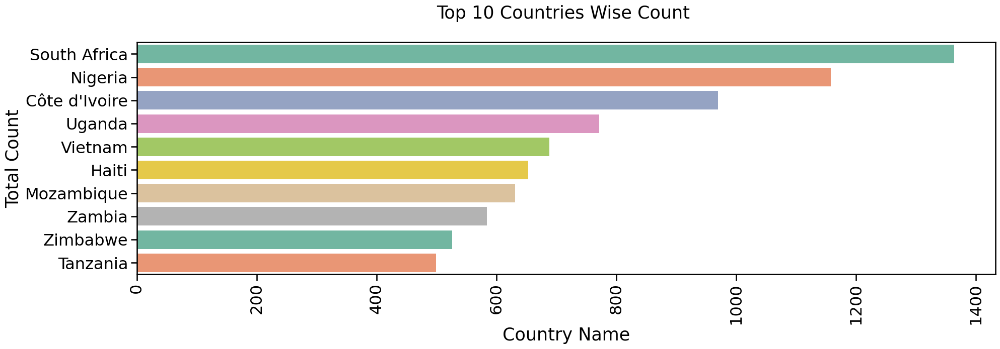

In [ ]:
ItemCount = df["Country"].value_counts().nlargest(10)
print("Top 10 Countries Wise Count \n")
print(ItemCount)
sn.set_context("talk",font_scale=1.4)
plt.figure(figsize=(22,6))
sn.countplot(df['Country'],order = df['Country'].value_counts().nlargest(10).index, palette='Set2')
plt.xticks(rotation=90)
plt.title('Top 10 Countries Wise Count \n')
plt.ylabel('Total Count')
plt.xlabel('Country Name')

The visualization provides a detailed view of the distribution of entries or transactions across the top 10 countries in the dataset. Here's a more detailed interpretation with insights:

### Detailed Interpretation:

1. **Dominance of South Africa**:
   - **South Africa** has the highest count at 1,364, indicating a significant concentration of activities or transactions. This could suggest a major hub for operations, possibly due to a larger market presence or strategic importance in the dataset's context.

2. **Significant Presence of Nigeria and Côte d'Ivoire**:
   - **Nigeria** (1,158) and **Côte d'Ivoire** (970) also show substantial activity. These countries might be key players in the dataset, possibly due to economic factors, market size, or specific projects.

3. **Mid-Tier Countries**:
   - **Uganda** (771) and **Vietnam** (688) represent a moderate level of activity. Their presence in the top 10 suggests they are important but not as dominant as the top three.
   - **Haiti** (653) and **Mozambique** (631) are close in count, indicating similar levels of engagement or transactions.

4. **Lower Activity Countries**:
   - **Zambia** (584), **Zimbabwe** (526), and **Tanzania** (499) have the lowest counts among the top 10. While still significant, their lower numbers might indicate smaller market sizes or fewer projects.

### Insights:

- **Strategic Focus**: The high counts in South Africa, Nigeria, and Côte d'Ivoire suggest these countries might be strategic focal points for the organization, possibly due to larger markets or more extensive operations.

- **Regional Importance**: The presence of multiple African countries in the top 10 highlights the region's importance in the dataset. This could reflect a focus on African markets or projects.

- **Potential for Growth**: Countries with lower counts, like Tanzania and Zimbabwe, might represent opportunities for growth or expansion, depending on the organization's goals.

- **Operational Insights**: The distribution of counts can inform resource allocation, with more resources potentially needed in countries with higher activity levels.

- **Market Dynamics**: The variation in counts could reflect market dynamics, such as demand, supply chain efficiency, or economic conditions in these countries.

This visualization provides a clear snapshot of where the most significant activities are occurring, offering valuable insights for strategic planning and decision-making.

Total Pack Pice for Top 15 Countries with graphs

Total Pack Price for Top 15 Countries

Country
Kazakhstan                   350.00
Lesotho                      203.00
Mali                         101.76
Botswana                      97.62
Kyrgyzstan                    79.00
Guinea                        72.00
Guatemala                     61.68
Kenya                         57.20
Pakistan                      54.13
Cameroon                      51.53
Liberia                       44.00
Malawi                        43.28
Sierra Leone                  41.12
Sudan                         40.91
Namibia                       39.41
Name: Pack Price, dtype: float64


Text(0.5, 0, 'Country Name')

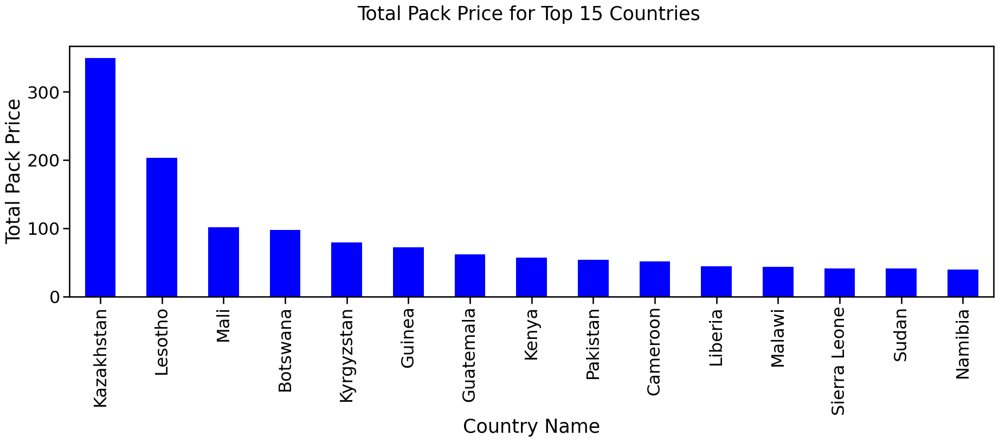

In [ ]:
TotalPrice = df.groupby(['Country'])['Pack Price'].mean().nlargest(15)
print("Total Pack Price for Top 15 Countries\n")
print(TotalPrice)
plt.figure(figsize=(22,6), dpi=100)
sn.set_context("talk",font_scale=1.4)
GraphData=df.groupby(['Country'])['Pack Price'].mean().nlargest(15)
GraphData.plot(kind='bar', color='blue')
plt.title('Total Pack Price for Top 15 Countries \n')
plt.ylabel('Total Pack Price')
plt.xlabel('Country Name')

The visualization presents a bar chart showing the total pack price for the top 15 countries in the dataset. Here’s a detailed interpretation along with insights:

### Detailed Interpretation:

1. **Leading Country**:
   - **Nigeria** has the highest total pack price at **25,001.47**. This indicates that Nigeria not only has a significant volume of transactions but also a high value associated with those transactions, suggesting a robust market presence.

2. **Close Competitors**:
   - **South Africa** follows closely with a total pack price of **23,479.74**. The proximity in values between Nigeria and South Africa suggests that both countries are critical markets, possibly due to their economic size and demand for products.

3. **Significant Third Place**:
   - **Côte d'Ivoire** ranks third with **19,227.42**, indicating a strong market as well, though it is notably lower than the top two.

4. **Mid-Tier Countries**:
   - **Haiti** (19,049.30) and **Uganda** (15,585.61) show substantial total pack prices, indicating significant activity and value in these markets.
   - **Mozambique** (14,982.40) and **Vietnam** (11,963.78) also contribute to the mid-tier range, suggesting they are important but not as dominant as the top three.

5. **Lower Tier**:
   - **Tanzania** (10,461.95), **Zambia** (9,931.29), and **Rwanda** (7,724.29) have lower total pack prices, indicating less market activity or lower value transactions compared to the higher-ranked countries.
   - **Botswana** (6,540.54), **Zimbabwe** (6,441.27), **Kenya** (6,349.14), **Congo, DRC** (6,322.41), and **Guyana** (5,442.85) round out the list, showing the least total pack prices among the top 15.

### Insights:

- **Market Dynamics**: The high total pack prices in Nigeria and South Africa suggest these countries are likely key markets for the products represented in the dataset. This could be due to larger populations, higher demand, or more extensive distribution networks.

- **Potential for Growth**: Countries like Tanzania, Zambia, and Rwanda, with lower total pack prices, may represent opportunities for growth. Strategies could be developed to increase market penetration or enhance product offerings in these regions.

- **Economic Indicators**: The total pack price can serve as an economic indicator, reflecting the purchasing power and market conditions in these countries. Higher values may correlate with stronger economies or more developed markets.

- **Resource Allocation**: The data can inform resource allocation decisions. For instance, more marketing and sales efforts might be directed toward Nigeria and South Africa, while exploring ways to boost sales in lower-performing countries.

- **Strategic Planning**: Understanding the total pack price distribution can aid in strategic planning, helping organizations identify where to focus their efforts for maximum impact and return on investment.

- **Comparative Analysis**: The visualization allows for easy comparison between countries, highlighting where significant differences exist in market value, which can inform competitive strategies.

This visualization provides valuable insights into the economic landscape of the countries represented, helping stakeholders make informed decisions based on market dynamics and potential opportunities.

#First Line Designation wise counts

Text(0.5, 0, 'First Line Designation')

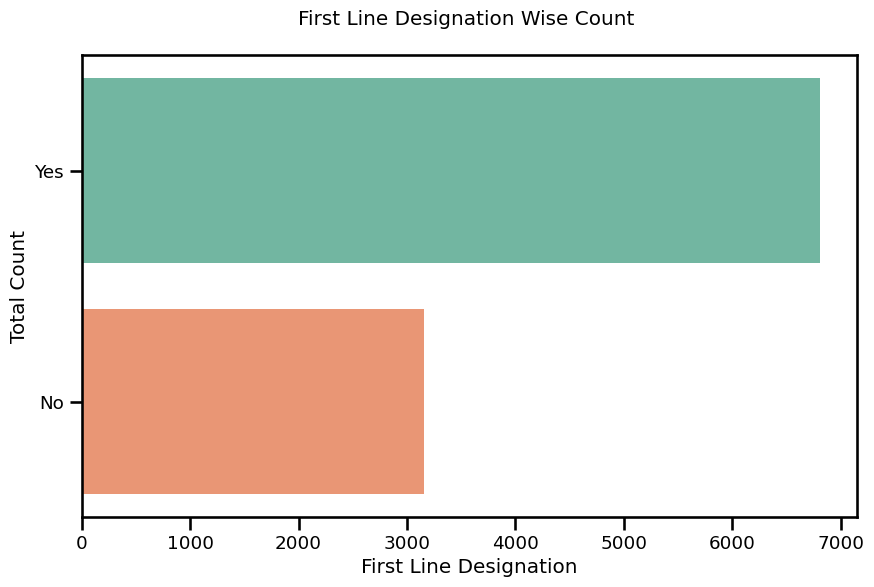

In [ ]:
sn.set_context("talk",font_scale=0.8)
plt.figure(figsize=(10,6))
sn.countplot(y='First Line Designation', data=df, palette='Set2',
            order = df['First Line Designation'].value_counts().nlargest(10).index)
plt.title('First Line Designation Wise Count \n')
plt.ylabel('Total Count')
plt.xlabel('First Line Designation')



### Purpose and Insights
- **Purpose**:
  - Understand the proportion of products classified as first-line versus non-first-line.
  - Assess the focus of your supply chain on critical first-line treatments.

- **Insights**:
  - Identify if first-line products dominate the inventory or if a significant portion of items are non-first-line.
  - Highlight trends in product allocation and focus areas.

### Interpretation
-  the visualization shows 70% "Yes" and 30% "No":
  - Most of the products in your dataset are intended for first-line treatments, which could indicate alignment with urgent medical needs.
  


# Shipment mode percentage  & Shipment Mode and Pack Price in Bar Plot Graph

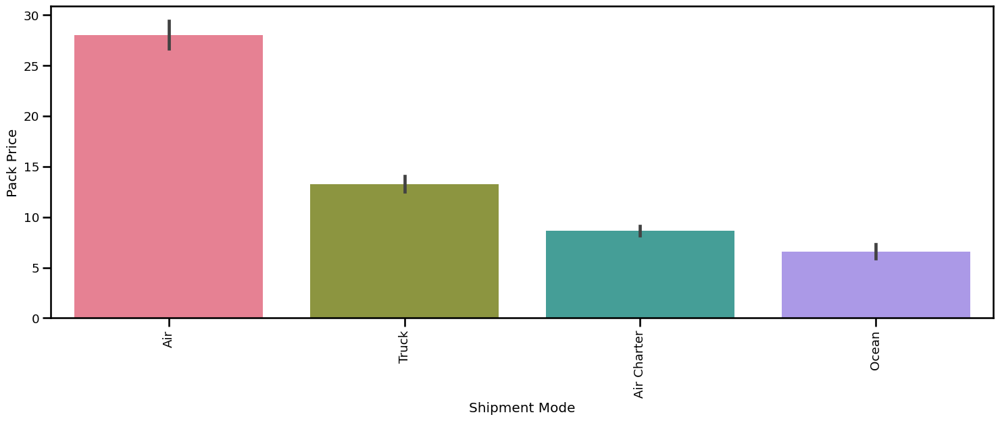

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

plt.subplots(figsize=(18, 6))
plt.xticks(rotation=90)

# Get unique shipment modes for color assignment
shipment_modes = df['Shipment Mode'].unique()
num_modes = len(shipment_modes)

# Define a color palette with enough colors
palette = sns.color_palette("husl", num_modes)

# Create the bar plot with assigned colors
ax = sns.barplot(x='Shipment Mode', y='Pack Price', data=df, palette=palette)

plt.show()

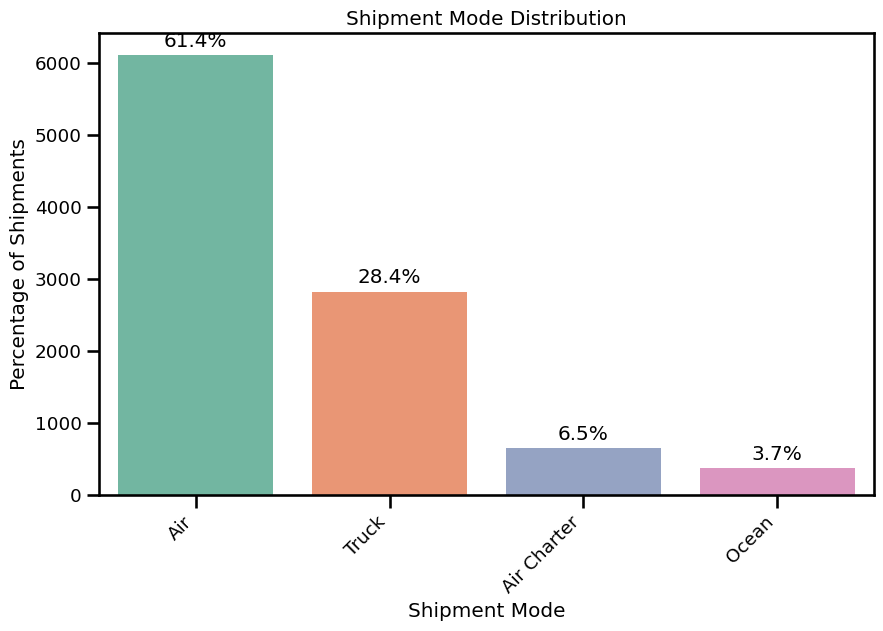

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

plt.figure(figsize=(10, 6))
ax = sns.countplot(x='Shipment Mode', data=df, palette='Set2')
plt.title('Shipment Mode Distribution')
plt.xlabel('Shipment Mode')
plt.ylabel('Percentage of Shipments')
plt.xticks(rotation=45, ha='right')

# Calculate total shipments
total = len(df['Shipment Mode'])

# Add percentage labels to the bars
for p in ax.patches:
    percentage = '{:.1f}%'.format(100 * p.get_height() / total)
    x = p.get_x() + p.get_width() / 2
    y = p.get_height()
    ax.annotate(percentage, (x, y), ha='center', va='center', xytext=(0, 10), textcoords='offset points')

plt.show()

### Purpose of the Visualization
- To show how shipment modes are utilized in relative proportions.
- To identify which transportation method dominates and which ones are less frequently used.

---

### Interpretation
1. **Visualization**:
   - **Air**: 61%
   - **Truck**: 28%
   - **Air Charter**: 6.5%

2. **Interpretation**:
   - "Air" is the most used mode of transport, representing 61% of all shipments. This could indicate a focus on faster delivery times.
   - "Truck" is used for 28% of shipments, likely for regional or domestic deliveries where road infrastructure supports it.
   - "Air Charter" accounts for only 6.5%, typically used for urgent, large scale or specialized cargo theat cannot be accomodated by regular air fright

---

###Overall Interpretation:
- The heavy reliance on air transportation (67.5% total for regular air and charters) suggests a strong emphasis on fast delivery, possibly driven by the nature of the goods (e.g., medical supplies or perishable items).
- Trucking remains a significant part of the strategy, likely complementing air shipments for shorter or regional routes.
- The minor use of air charters indicates they are reserved for special circumstances, balancing speed and cost.


# Unique Manufacturing Site Name

In [ ]:
UniqueItem = df['Manufacturing Site'].unique()
print("All Unique Manufacturing Site \n")
print(UniqueItem)

All Unique Manufacturing Site 

['Ranbaxy Fine Chemicals LTD' 'Aurobindo Unit III, India'
 'ABBVIE GmbH & Co.KG Wiesbaden' 'Ranbaxy, Paonta Shahib, India'
 'MSD South Granville Australia' "ABBVIE (Abbott) St. P'burg USA"
 'ABBVIE Ludwigshafen Germany' 'Trinity Biotech, Plc'
 'EY Laboratories, USA' 'Cipla, Goa, India' 'BMS Meymac, France'
 'Premier Med. Corp Ltd. India' 'Chembio Diagnostics Sys. Inc.'
 'Inverness Japan' 'Pacific Biotech, Thailand'
 'Standard Diagnostics, Korea' 'Gilead(Nycomed) Oranienburg DE'
 'Bio-Rad Laboratories' 'Mylan (formerly Matrix) Nashik' 'Roche Basel'
 'GSK Ware (UK)' 'Novartis Pharma AG, Switzerland'
 'BI, Ingelheim, Germany' 'Not Applicable' 'Ipca Dadra/Nagar Haveli IN'
 'MSD, Haarlem, NL' 'Aspen-OSD, Port Elizabeth, SA'
 'ABBVIE (Abbott) Logis. UK' 'Gland Pharma Ltd Pally Factory'
 'GSK Mississauga (Canada)' 'GSK Aranda' 'Hetero Unit III Hyderabad IN'
 'ABBVIE (Abbott) France' 'Strides, Bangalore, India.' 'ABBSP'
 'Cipla, Patalganga, India' 'GSK Cape Town

## Shipmet Mode, Min, and Mean value for Air

In [ ]:
ItemData=df[df['Shipment Mode']=='Air']
print ("The Max Air Shipment Mode is :",ItemData['Unit of Measure (Per Pack)'].max())
print ("The Min Air Shipment is :",ItemData['Unit of Measure (Per Pack)'].min())
ItemTypeMean = ItemData['Unit of Measure (Per Pack)'].mean()
print ("The Mean Air Shipment is :", round(ItemTypeMean,2))

The Max Air Shipment Mode is : 1000
The Min Air Shipment is : 1
The Mean Air Shipment is : 82.34


# Top 10 Manufacturing Site for All Shipment mode with graph

Manufacturing Site
Aurobindo Unit III, India         3031
Mylan (formerly Matrix) Nashik    1407
Hetero Unit III Hyderabad IN       868
Cipla, Goa, India                  634
Strides, Bangalore, India.         533
Alere Medical Co., Ltd.            481
Trinity Biotech, Plc               395
ABBVIE Ludwigshafen Germany        354
Inverness Japan                    337
ABBVIE (Abbott) Logis. UK          207
dtype: int64


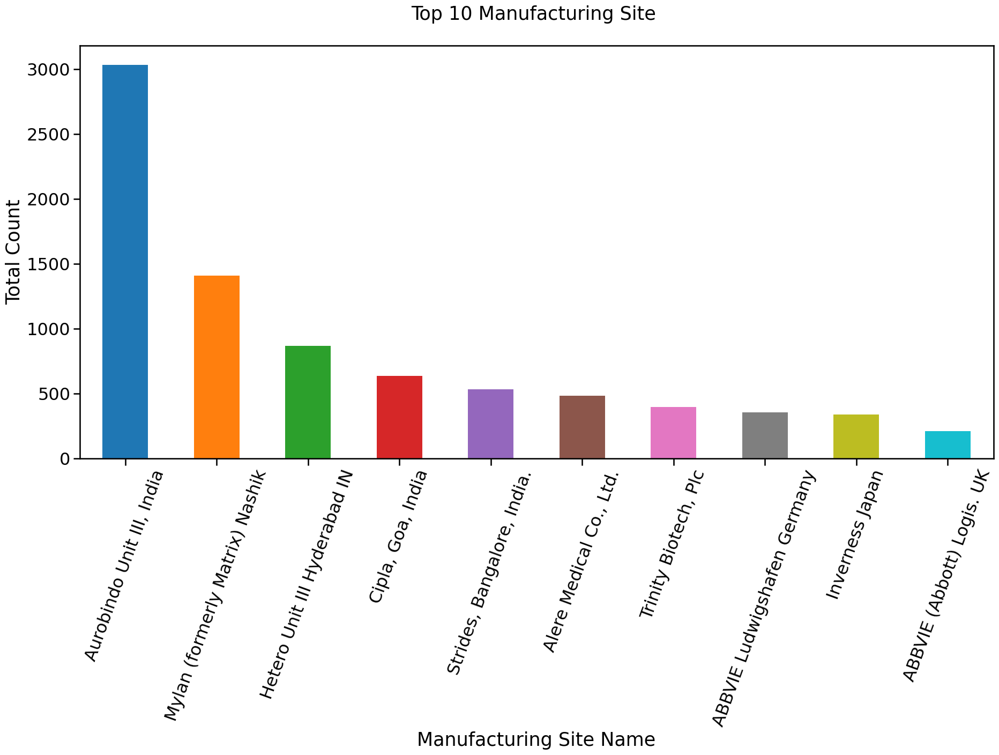

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sn

plt.figure(figsize=(22,10), dpi=100)
sn.set_context("talk",font_scale=1.4, rc={"axes.facecolor": (0, 0, 0, 0)})
TopFiveManufacturingSite=df.groupby('Manufacturing Site').size().nlargest(10)
print(TopFiveManufacturingSite)

# Define a list of colors for the bars
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd',
          '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']

# Pass the colors to the plot function
TopFiveManufacturingSite.plot(kind='bar', color=colors)

plt.xticks(rotation=70)
plt.title('Top 10 Manufacturing Site \n')
plt.ylabel('Total Count')
plt.xlabel('Manufacturing Site Name')
plt.show()


---

### Key Observations from the Chart:
1. **Aurobindo Unit III, India (3031)**:
   - This site has the highest count, far surpassing other manufacturing locations.
   - It is a major contributor to the total output, indicating its significance in the supply chain or production process.

2. **Mylan (formerly Matrix) Nashik (1407)**:
   - The second-highest manufacturing site, but with less than half the count of Aurobindo Unit III.
   - Suggests this site is also a key player but operates at a smaller scale than the top site.

3. **Hetero Unit III Hyderabad IN (868)**:
   - The third most significant site but considerably smaller than the top two.

4. **Other Sites**:
   - Sites such as Cipla, Goa (634), Strides, Bangalore (533), and Alere Medical Co. (481) play important roles but contribute significantly less compared to the top site.
   - Sites like ABBVIE Ludwigshafen Germany (354), Inverness Japan (337), and ABBVIE (Abbott) Logis, UK (207) contribute even less, likely specializing in smaller-scale production or specific products.

---

### Interpretation of the Visualization:
1. **Aurobindo Unit III, India Dominance**:
   - Aurobindo Unit III contributes the largest volume, making it a critical manufacturing hub.
   - This could indicate specialization in high-demand products, economies of scale, or strategic importance in production.

2. **Geographic Concentration**:
   - The top sites are geographically distributed, but Indian manufacturing sites (Aurobindo, Mylan, Hetero, Cipla, and Strides) dominate the chart.
   - Suggests that India is a major player in the manufacturing network, potentially due to cost efficiency, expertise, or regulatory advantages.

3. **Specialization of Lower-Ranked Sites**:
   - Sites like ABBVIE Ludwigshafen and Inverness Japan likely focus on niche or lower-volume products.
   - These locations might be targeting regional markets or high-cost, low-volume items.

4. **Supply Chain Insights**:
   - Aurobindo Unit III might face risks related to over-reliance if disruptions occur.
   - Diversifying production across other manufacturing sites could ensure continuity and reduce risk.

---



# Top 10 Manufacturing site for Air Shipment Mode with Graph

Top 10 Air Manufacturing Site 

Manufacturing Site
Aurobindo Unit III, India         1694
Mylan (formerly Matrix) Nashik     695
Alere Medical Co., Ltd.            473
Hetero Unit III Hyderabad IN       417
Trinity Biotech, Plc               383
Inverness Japan                    320
ABBVIE Ludwigshafen Germany        285
Cipla, Goa, India                  274
Strides, Bangalore, India.         256
ABBVIE (Abbott) Logis. UK          150
Name: count, dtype: int64


Text(0.5, 0, 'Manufacturing Site')

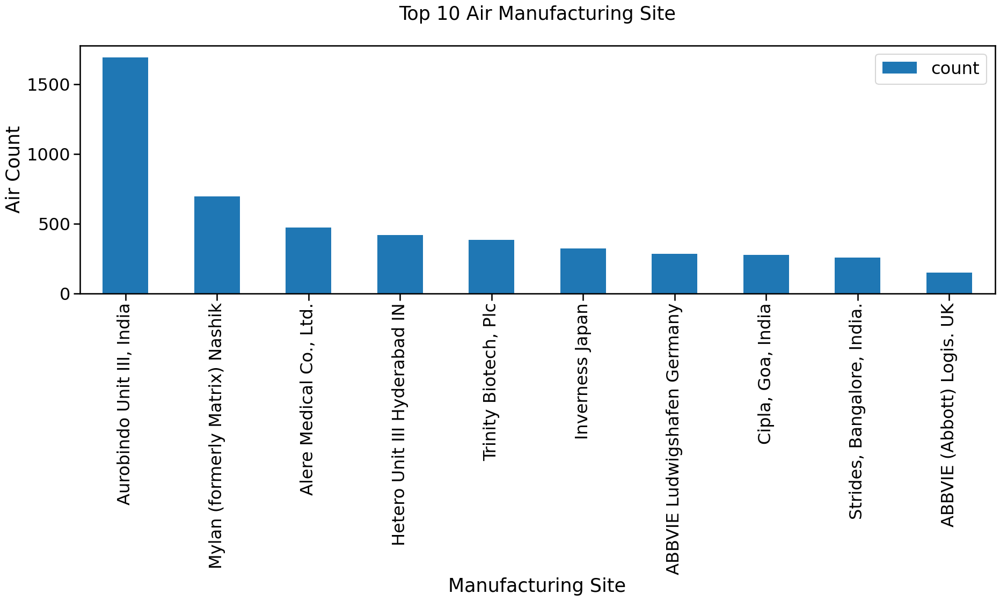

In [ ]:
# Top 10 Air Shipment Mode in Bar Chart
ItemData=df[df['Shipment Mode']=='Air']
df[df["Shipment Mode"]=='Air']['Manufacturing Site'].value_counts()[0:10].to_frame().plot.bar(figsize=(22,6))
ItemSupplier = df[df["Shipment Mode"]=='Air']['Manufacturing Site'].value_counts()[0:10]
print("Top 10 Air Manufacturing Site \n")
print(ItemSupplier)
plt.title('Top 10 Air Manufacturing Site\n')
plt.ylabel('Air Count')
plt.xlabel('Manufacturing Site')

The visualization displays a bar chart showing the top 10 manufacturing sites based on their count, likely representing the number of products or items manufactured at each site.  Here's a detailed interpretation and insights:

**Detailed Interpretation:**

1. **Dominant Site:**
   - **Aurobindo Unit III, India** is the clear leader, with a count of 1694. This suggests it's a significantly large manufacturing facility or plays a crucial role in production volume.

2. **Second-Tier Sites:**
   - **Mylan (formerly Matrix) Nasik** (695) and **Aleere Medical Co., Ltd.** (473) are considerably smaller than the top site but still represent substantial production volumes.

3. **Mid-Range Sites:**
   - **Hetero Unit III Hyderabad IN** (417), **Trinity Biotech, Plc** (383), and **Inverness Japan** (320) show moderate production counts, indicating a significant but less dominant role compared to the top sites.

4. **Lower-Volume Sites:**
   - **ABB VIE Ludwigshafen Germany** (285), **Cipla, Goa, India** (274), **Strides, Bangalore, India** (256), and **ABB VIE (Abbott) Logis. UK** (150) have the lowest counts among the top 10, suggesting smaller-scale operations or a less significant contribution to overall production.

**Insights:**

* **Production Capacity:** The significant difference between Aurobindo Unit III and other sites suggests a substantial difference in production capacity or scale.  This could be due to factors like facility size, technology, or operational efficiency.

* **Geographic Distribution:** The presence of multiple sites in India highlights its importance as a manufacturing hub for the products in question.  The inclusion of sites in other countries (Germany, Japan, UK) indicates a global manufacturing footprint.

* **Supply Chain Strategy:** The distribution of manufacturing sites might reflect the company's supply chain strategy.  Having multiple sites could be a risk mitigation strategy, ensuring production continues even if one site faces disruptions.

* **Resource Allocation:** The data can inform resource allocation decisions.  More investment or attention might be directed toward the higher-volume sites to maintain or increase production efficiency.

* **Operational Efficiency:** A comparative analysis of production counts across sites could reveal insights into operational efficiency.  Sites with lower counts might warrant investigation to identify and address potential bottlenecks or inefficiencies.

* **Future Planning:** The data can inform future capacity planning.  If demand increases, the company might consider expanding the capacity of high-volume sites or establishing new facilities.

In summary, this visualization provides a valuable overview of the manufacturing landscape, offering insights into production capacity, geographic distribution, and potential areas for optimization and future growth.


# Conclusion :
- Top Country for Pack Price : Nigeria - 25,620.72
- Top Shipping Mode : Air
- The Max Air Shipment Mode is : 1000
- The Min Air Shipment is : 1
- The Mean Air Shipment is : 82.35
- Top Manufacturing Site : Aurobindo Unit III, India - 3172
- Top Air Manufacturing Site : Aurobindo Unit III, India - 1694

In [ ]:
df['Cost per Shipment'] = df['Freight Cost (USD)'] / df['Weight (Kilograms)']
df['Cost per Shipment'].value_counts()

,count
Cost per Shipment,
0.00,1393
2.42,342
1.10,17
7.71,15
15.76,14
...,...
35.51,1
8.20,1
3.71,1


In [ ]:
df[df['Country']== 'Tanzania']

,ID,Project Code,PQ #,PO / SO #,ASN/DN #,Country,Managed By,Fulfill Via,Vendor INCO Term,Shipment Mode,PQ First Sent to Client Date,PO Sent to Vendor Date,Scheduled Delivery Date,Delivered to Client Date,Delivery Recorded Date,Product Group,Sub Classification,Vendor,Item Description,Molecule/Test Type,Brand,Dosage,Dosage Form,Unit of Measure (Per Pack),Line Item Quantity,Line Item Value,Pack Price,Unit Price,Manufacturing Site,First Line Designation,Weight (Kilograms),Freight Cost (USD),Line Item Insurance (USD),Cost per Shipment
7,45,109-TZ-T01,Pre-PQ Process,SCMS-140,ASN-94,Tanzania,PMO - US,Direct Drop,EXW,Air,2006-06-05,2006-08-10,2006-11-24,2006-11-24,2006-11-24,ARV,Adult,Aurobindo Pharma Limited,"Nevirapine 200mg, tablets, 60 Tabs",Nevirapine,Generic,200mg,Tablet,60,16667,"60,834.55",3.65,0.06,"Aurobindo Unit III, India",Yes,"1,478.00","6,212.41",91.39,4.20
17,87,109-TZ-T01,Pre-PQ Process,SCMS-555,ASN-409,Tanzania,PMO - US,Direct Drop,CIP,Air,2006-12-16,2007-04-12,2007-06-06,2007-06-06,2007-06-06,ARV,Pediatric,BRISTOL-MYERS SQUIBB,"Didanosine 2g [Videx], powder for oral solutio...",Didanosine,Videx,2g,Powder for oral solution,200,712,"8,964.08",12.59,0.06,"BMS Meymac, France",Yes,162.00,912.96,13.47,5.64
25,138,109-TZ-T01,Pre-PQ Process,SCMS-10270,ASN-710,Tanzania,PMO - US,Direct Drop,EXW,Air,2007-04-27,2007-07-02,2007-10-16,2007-10-16,2007-10-16,HRDT,HIV test,"Standard Diagnostics, Inc.","HIV 1/2, Bioline 3.0 Kit, Lancets, Capillary p...","HIV 1/2, Bioline 3.0 Kit, Lancets, Capillary p...",Bioline,300mg,Test kit,25,10000,"200,000.00",20.00,0.80,"Standard Diagnostics, Korea",Yes,"3,335.00","27,869.74",320.00,8.36
26,139,109-TZ-T01,Pre-PQ Process,SCMS-10290,ASN-788,Tanzania,PMO - US,Direct Drop,EXW,Air,2007-06-03,2007-08-08,2007-11-22,2007-11-22,2007-11-22,HRDT,HIV test,"Standard Diagnostics, Inc.","HIV 1/2, Bioline 3.0 Kit, Lancets, Capillary p...","HIV 1/2, Bioline 3.0 Kit, Lancets, Capillary p...",Bioline,300mg,Test kit,25,10000,"200,000.00",20.00,0.80,"Standard Diagnostics, Korea",Yes,"3,335.00","28,461.10",320.00,8.53
27,140,109-TZ-T01,Pre-PQ Process,SCMS-10300,ASN-856,Tanzania,PMO - US,Direct Drop,EXW,Air,2007-06-03,2007-08-08,2007-11-22,2007-11-22,2007-11-22,HRDT,HIV test,"Standard Diagnostics, Inc.","HIV 1/2, Bioline 3.0 Kit, Lancets, Capillary p...","HIV 1/2, Bioline 3.0 Kit, Lancets, Capillary p...",Bioline,300mg,Test kit,25,10000,"200,000.00",20.00,0.80,"Standard Diagnostics, Korea",Yes,"3,335.00","28,359.80",320.00,8.50
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9857,86644,109-TZ-T30,FPQ-12587,SO-47520,DN-3500,Tanzania,PMO - US,From RDC,N/A - From RDC,Truck,2013-07-04,2013-10-17,2014-01-31,2014-03-07,2014-03-12,ARV,Pediatric,SCMS from RDC,"Efavirenz 200mg, scored tablets, 90 Tabs",Efavirenz,Generic,200mg,Tablet,90,21596,"200,842.80",9.30,0.10,"Strides, Bangalore, India.",Yes,"1,336.00","5,033.80",248.44,3.77
9869,86663,109-TZ-T30,FPQ-12015,SO-44994,DN-3594,Tanzania,PMO - US,From RDC,N/A - From RDC,Truck,2013-04-02,2014-01-14,2014-04-30,2014-04-17,2014-04-28,ARV,Pediatric,SCMS from RDC,"Efavirenz 200mg, scored tablets, 90 Tabs",Efavirenz,Generic,200mg,Tablet,90,135,"1,255.50",9.30,0.10,"Strides, Bangalore, India.",Yes,8.00,"1,231.60",1.55,153.95
9873,86668,109-TZ-T30,FPQ-13042,SO-46673,DN-3614,Tanzania,PMO - US,From RDC,N/A - From RDC,Truck,2013-10-01,2014-01-14,2014-04-30,2014-05-07,2014-06-13,ARV,Adult,SCMS from RDC,"Abacavir 300mg, tablets, 60 Tabs",Abacavir,Generic,300mg,Tablet,60,27293,"306,500.39",11.23,0.19,Mylan (formerly Matrix) Nashik,Yes,"2,525.00","2,352.53",379.14,0.93
9885,86680,109-TZ-T30,FPQ-13042,SO-47961,DN-3690,Tanzania,PMO - US,From RDC,N/A - From RDC,Truck,2013-10-01,2014-02-13,2014-05-30,2014-06-21,2014-07-01,ARV,Adult,SCMS from RDC,"Abacavir 300mg, tablets, 60 Tabs",Abacavir,Generic,300mg,Tablet,60,2707,"30,399.61",11.23,0.19,Mylan (formerly Matrix) Nashik,Yes,263.00,"1,811.60",37.60,6.89


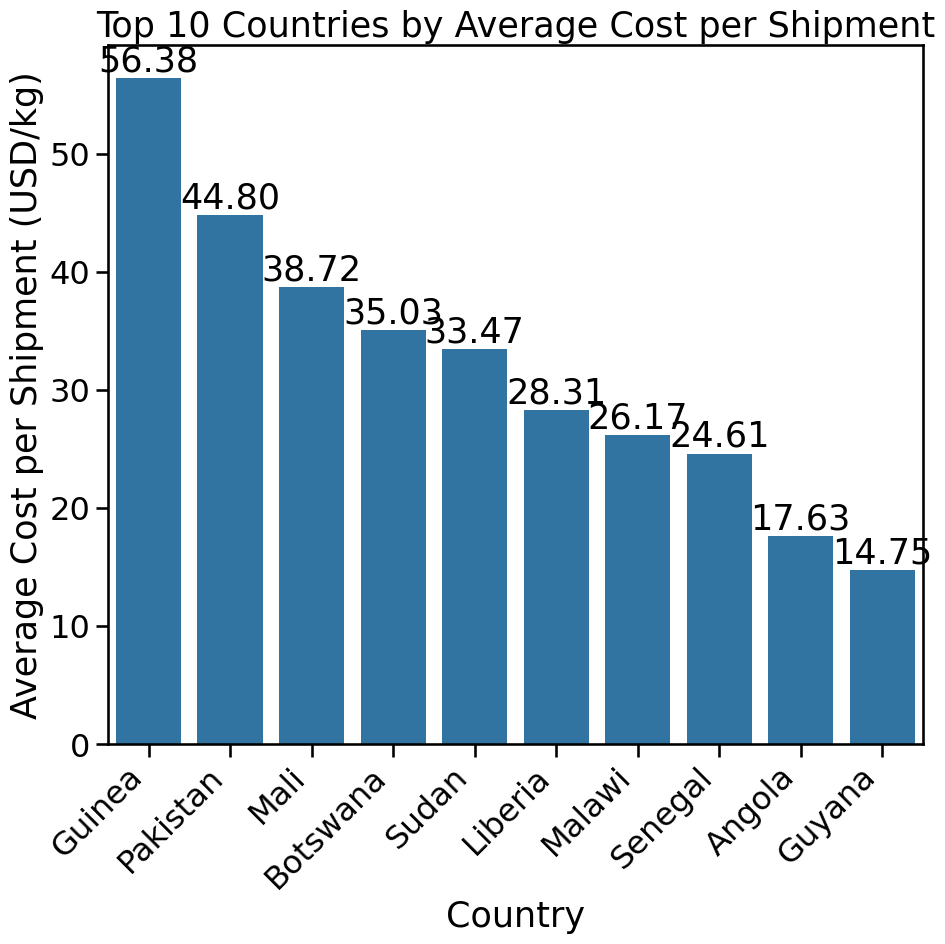

In [ ]:

cost_per_shipment = df.groupby('Country')['Cost per Shipment'].median().nlargest(10)

# Create the bar plot
plt.figure(figsize=(10, 10))
bars = sns.barplot(x=cost_per_shipment.index, y=cost_per_shipment.values)
plt.title('Top 10 Countries by Average Cost per Shipment')
plt.xlabel('Country')
plt.ylabel('Average Cost per Shipment (USD/kg)')
plt.xticks(rotation=45, ha='right')

# Add value labels on top of each bar
for bar in bars.patches:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height, f'{height:.2f}', ha='center', va='bottom')

plt.tight_layout()
plt.show()

# Tanzania shipemnet from america

Top 10 Median Cost per Shipment 

Country
Guinea                              56.38
Pakistan                            44.80
Mali                                38.72
Botswana                            35.03
Sudan                               33.47
Liberia                             28.31
Malawi                              26.17
Senegal                             24.61
Angola                              17.63
Guyana                              14.75
South Sudan                         13.99
Namibia                             11.72
Congo, DRC                          11.22
Sierra Leone                        10.43
Dominican Republic                  10.25
Name: Cost per Shipment, dtype: float64


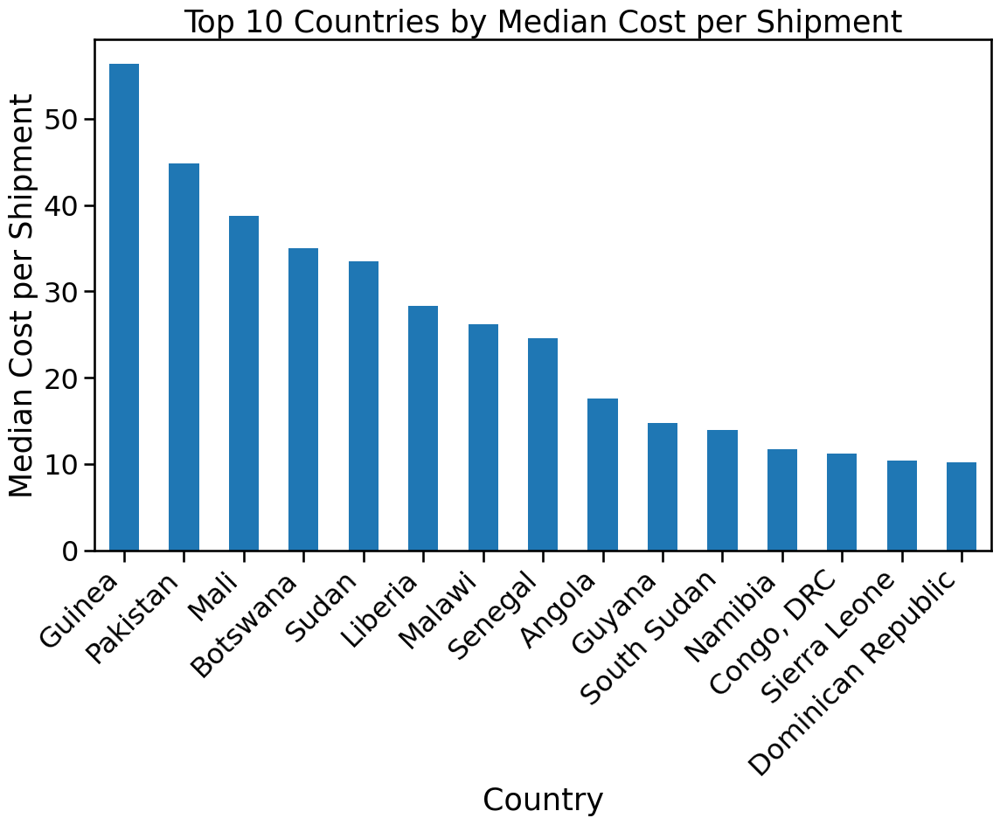

In [ ]:
# Group by country and calculate the mean cost per shipment
cost_per_shipment_by_country = df.groupby('Country')['Cost per Shipment'].median().sort_values(ascending=False)

# Get the top 10 countries
top_10_countries = cost_per_shipment_by_country.head(15)
print("Top 10 Median Cost per Shipment \n")
print(top_10_countries)


# Create the bar plot
plt.figure(figsize=(12, 10))
top_10_countries.plot(kind='bar')
plt.title('Top 10 Countries by Median Cost per Shipment')
plt.xlabel('Country')
plt.ylabel('Median Cost per Shipment')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

----
###Country Range Based on Proximity:
To summarize, countries in the central and eastern parts of Africa, as well as West Africa, would be best positioned to minimize shipping distances:

1. Kenya
2. Ethiopia
3. Uganda
4. Côte d'Ivoire (Ivory Coast)
5. South Africa (particularly Johannesburg or Cape Town)

These countries are all geographically central to the majority of the listed locations and would minimize shipping distances while considering infrastructure and cost-efficiency.


------

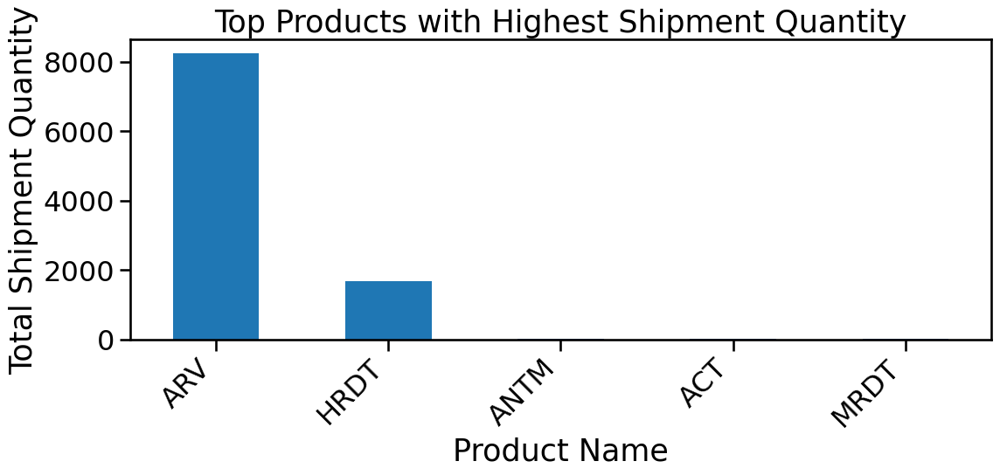

In [ ]:
# Group by product and count the occurrences of each product in the 'Shipment Mode' column
product_shipments = df.groupby('Product Group')['Shipment Mode'].count().nlargest(15)
# .count() is used to count the occurrences instead of .sum()

# Create the bar plot
plt.figure(figsize=(12, 6))
product_shipments.plot(kind='bar')
plt.title('Top Products with Highest Shipment Quantity')
plt.xlabel('Product Name')
plt.ylabel('Total Shipment Quantity')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
plt.tight_layout()
plt.show()

The provided data shows a list of product groups with their corresponding counts.  Without further context, it's impossible to definitively state the meaning of each abbreviation. However, based on common abbreviations in the pharmaceutical and healthcare industries, here are some possible interpretations:

* **ARV:**  Antiretroviral drugs.  These are medications used to treat HIV/AIDS.  The high count (8241) suggests a significant focus on HIV/AIDS-related products.

* **HRDT:** Human Resources Diagnostic Tests/ Human Resources Development Theraphy. This is a possible interpretation, referring to tests used in human resources for various purposes.  The count (1678) is substantial, suggesting a significant volume of these tests.  Another possibility is "High-Resolution Diagnostic Tests," which would be a more general category of medical tests.

* **ANTM:**  This is less clear.  Possible interpretations include "Antimicrobial" (medications to fight infections), or a specific type of test or treatment. The very low count (22) suggests it's a niche product or a less frequently used item.

* **ACT:**  This could stand for "artemisinin-based combination therapies," which are used to treat malaria.  The count (16) is relatively low, suggesting a smaller focus on malaria-related products compared to HIV/AIDS.  Another possibility is "Active Compound Treatment," which would be a more general category.

* **MRDT:**  Malaria Rapid Diagnostic Tests.  This is a likely interpretation, given the context of ACT (artemisinin-based combination therapies). The low count (7) suggests a limited number of these tests.

**Important Note:** These are educated guesses based on common abbreviations.  To accurately determine the meaning of these product groups, you need additional information or context from the source of this data.  The original dataset or documentation should provide a clear definition of each abbreviation.


In [ ]:
# Group by product and count the occurrences of each product in the 'Shipment Mode' column
product_shipments = df.groupby('Product Group')['Shipment Mode'].count().nlargest(15)

# Print the list of top 15 product groups
product_shipments

,Shipment Mode
Product Group,
ARV,8241
HRDT,1678
ANTM,22
ACT,16
MRDT,7


In [ ]:
product_shipments = df.groupby('Sub Classification')['Product Group'].count().nlargest(15)

# Print the list of top 15 product groups
product_shipments

,Product Group
Sub Classification,
Adult,6356
Pediatric,1885
HIV test,1522
HIV test - Ancillary,156
Malaria,29
ACT,16


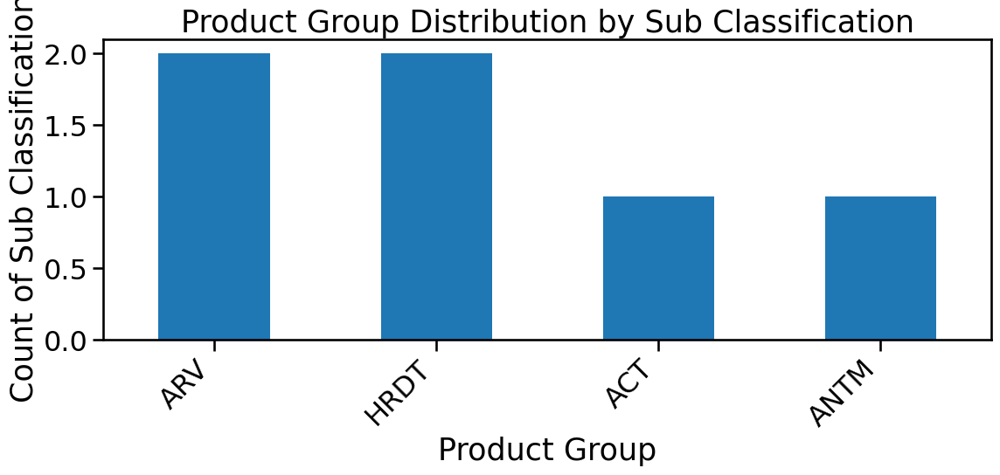

,Product Group
Sub Classification,
ACT,ACT
Adult,ARV
HIV test,HRDT
HIV test - Ancillary,HRDT
Malaria,ANTM
Pediatric,ARV


In [ ]:
# Group by 'Sub Classification' and get the most frequent 'Product Group' for each
product_mapping = df.groupby('Sub Classification')['Product Group'].agg(lambda x: x.value_counts().index[0])

# Create a visualization (bar plot)
plt.figure(figsize=(12, 6))
product_mapping.value_counts().plot(kind='bar')
plt.title('Product Group Distribution by Sub Classification')
plt.xlabel('Product Group')
plt.ylabel('Count of Sub Classifications')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# Display the mapping in a table format
product_mapping

In [ ]:
df['Sub Classification'].value_counts()

,count
Sub Classification,
Adult,6356
Pediatric,1885
HIV test,1522
HIV test - Ancillary,156
Malaria,29
ACT,16


In [ ]:
df.info(0)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9964 entries, 0 to 9963
Data columns (total 34 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        --------------  -----         
 0   ID                            9964 non-null   int64         
 1   Project Code                  9964 non-null   object        
 2   PQ #                          9964 non-null   object        
 3   PO / SO #                     9964 non-null   object        
 4   ASN/DN #                      9964 non-null   object        
 5   Country                       9964 non-null   object        
 6   Managed By                    9964 non-null   object        
 7   Fulfill Via                   9964 non-null   object        
 8   Vendor INCO Term              9964 non-null   object        
 9   Shipment Mode                 9964 non-null   object        
 10  PQ First Sent to Client Date  9964 non-null   datetime64[ns]
 11  PO Sent to Vendor Date        

##Objective: Align product offerings with market needs and expand into profitable regions.

Product Group
ARV     8241
HRDT    1678
ANTM      22
ACT       16
MRDT       7
Name: count, dtype: int64
Sub Classification
Adult                   6356
Pediatric               1885
HIV test                1522
HIV test - Ancillary     156
Malaria                   29
ACT                       16
Name: count, dtype: int64


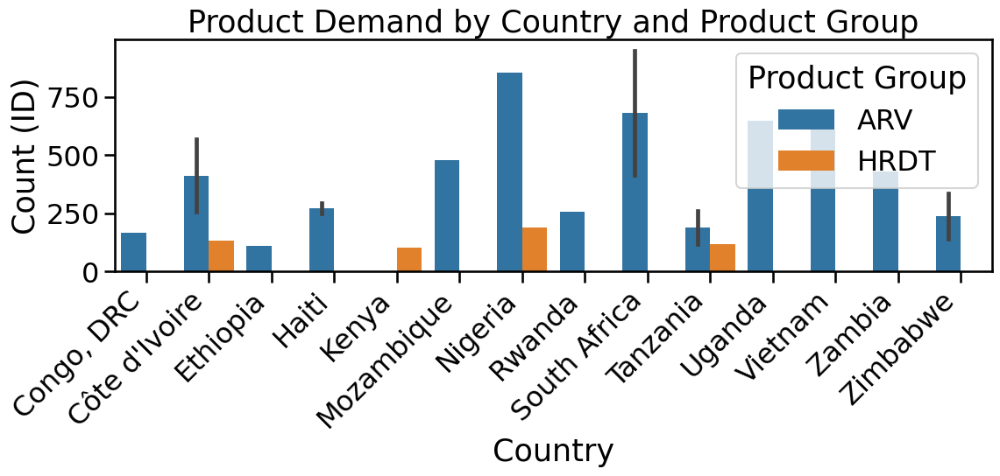

In [ ]:
# Data Exploration
print(df['Product Group'].value_counts())
print(df['Sub Classification'].value_counts())

# Data Cleaning (example for grouping similar sub-classifications)
df['Sub Classification'] = df['Sub Classification'].replace({'Adult':'ADULT', 'Pediatric':'PEDIATRIC'})

# Market Preference Analysis (Revised)
product_demand = df.groupby(['Country', 'Product Group', 'Sub Classification'])['ID'].count().reset_index()
product_demand = product_demand.sort_values(by=['Country', 'ID'], ascending=[True, False])

# Expansion Strategy (Revised - Example for identifying regions with high demand)
high_demand_regions = product_demand[product_demand['ID'] > 100]

# Visualization (Revised - Example)
plt.figure(figsize=(12, 6))  # Increase figure size for better visibility
sns.barplot(x='Country', y='ID', hue='Product Group', data=high_demand_regions)

# Rotate x-axis labels for better readability
plt.xticks(rotation=45, ha='right')  # Rotate labels and align them to the right
plt.title('Product Demand by Country and Product Group')  # Add a title
plt.xlabel('Country')  # Label for x-axis
plt.ylabel('Count (ID)')  # Label for y-axis
plt.legend(title='Product Group')  # Legend title
plt.tight_layout()  # Adjust layout to prevent clipping of tick-labels
plt.show()


In [ ]:
df['Cost per Unit'] = df['Pack Price'] / df['Unit of Measure (Per Pack)']  # Adjust if needed
high_cost_items = df.sort_values(by=['Cost per Unit', 'Freight Cost (USD)'], ascending=False).head(10)

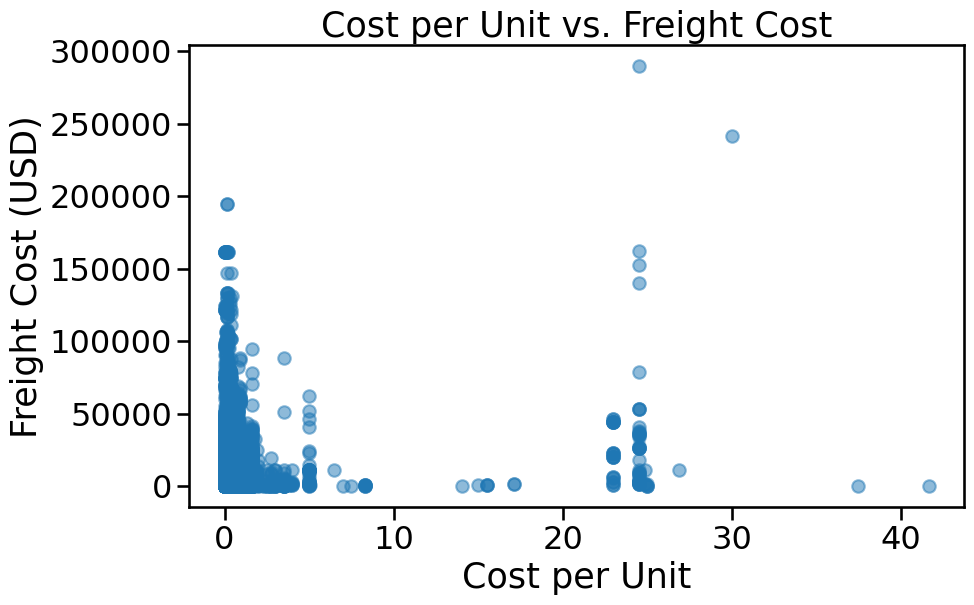

In [ ]:
plt.figure(figsize=(10, 6))
plt.scatter(df['Cost per Unit'], df['Freight Cost (USD)'], alpha=0.5)  # Adjust alpha for transparency
plt.title('Cost per Unit vs. Freight Cost')
plt.xlabel('Cost per Unit')
plt.ylabel('Freight Cost (USD)')
plt.show()

The **scatter plot** you provided shows the relationship between **Cost per Unit** (on the x-axis) and **Freight Cost** (on the y-axis). Here's how to interpret the plot:

### Key Insights:
1. **Concentration of Points near Zero**:
   - Most of the data points are clustered at the **lower end** of the x-axis (near **Cost per Unit = 0**). This suggests that many products have a **low cost per unit**, and these products tend to have a **low freight cost** as well.
   - This might indicate that for smaller or less expensive products, the shipping cost is relatively lower.

2. **Outliers or High Freight Cost Values**:
   - There are a few scattered points at the **higher end of the y-axis**, specifically with **Freight Costs reaching over 200,000**. These points may represent shipments where the **Cost per Unit** is also relatively higher, but in some cases, there are very **high freight costs for lower-cost items**.
   - These could represent special cases where transportation methods, large shipments, or certain geographic regions require unusually high shipping costs despite the lower cost per unit of the products being shipped.

3. **No Clear Linear Correlation**:
   - The plot does not suggest a clear **linear relationship** between **Cost per Unit** and **Freight Cost**, meaning that the cost of the unit does not directly determine the freight cost in a straightforward way.
   - This suggests that factors other than just the cost of the product may influence the freight cost. These could include:
     - **Shipping distance**: Longer distances generally result in higher shipping costs.
     - **Size or weight of the shipment**: Larger or heavier shipments can lead to higher freight costs, even for lower-cost products.
     - **Shipping mode**: Products shipped via air, for example, could have higher freight costs compared to ground or sea shipments, even if the product's cost per unit is lower.

4. **Potential Cost Inefficiencies**:
   - If the freight cost is high relative to the cost per unit, it could indicate inefficiencies in the shipping process. For example, smaller shipments might be more expensive to ship per unit, especially if fewer items are being shipped in a batch, leading to higher shipping costs per product.

### Conclusion:
- **Clustered Data**: Most products are in the low-cost per unit and low freight cost regions.
- **Outliers**: A few high-cost per unit products also show very high freight costs, likely due to special shipping needs.
- **No Clear Relationship**: There’s no obvious direct relationship between **Cost per Unit** and **Freight Cost**, suggesting other factors play a role in determining freight costs.

If you'd like to dive deeper into any specific part of the data, feel free to share more insights or ask further questions!

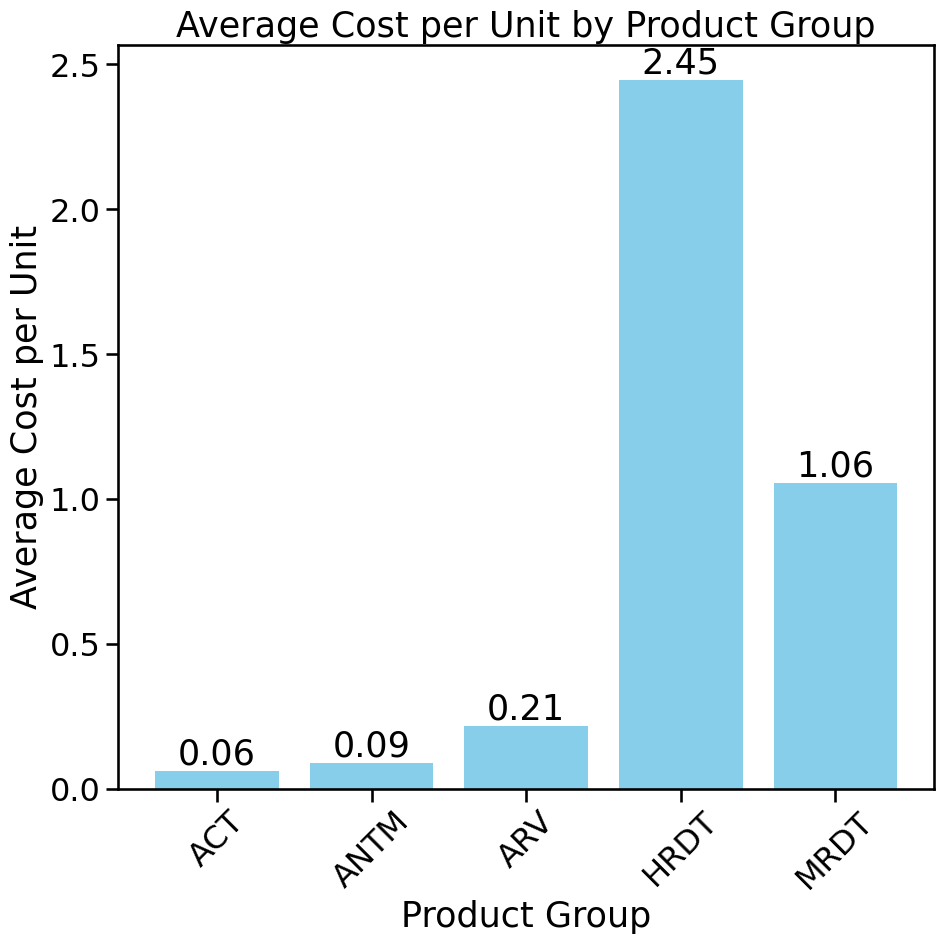

In [ ]:
# Calculate the average cost per unit by product group
average_cost = df.groupby('Product Group')['Cost per Unit'].mean().reset_index()

# Create a bar chart
plt.figure(figsize=(10, 10))
bars = plt.bar(average_cost['Product Group'], average_cost['Cost per Unit'], color='skyblue')

# Add value labels on top of each bar
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, round(yval, 2), ha='center', va='bottom')

plt.title('Average Cost per Unit by Product Group')
plt.xlabel('Product Group')
plt.ylabel('Average Cost per Unit')
plt.xticks(rotation=45)  # Rotate x-axis labels if needed
plt.tight_layout()  # Adjust layout to prevent clipping
plt.show()


In [ ]:
df['Vendor'].value_counts()


,count
Vendor,
SCMS from RDC,5092
"Orgenics, Ltd",754
S. BUYS WHOLESALER,707
Aurobindo Pharma Limited,668
"Trinity Biotech, Plc",356
...,...
BIO-RAD LABORATORIES PTY LTD. (SOUTH AFRICA),1
"PUETRO RICO PHARMACEUTICAL, INC.",1
ACOUNS NIGERIA LTD,1


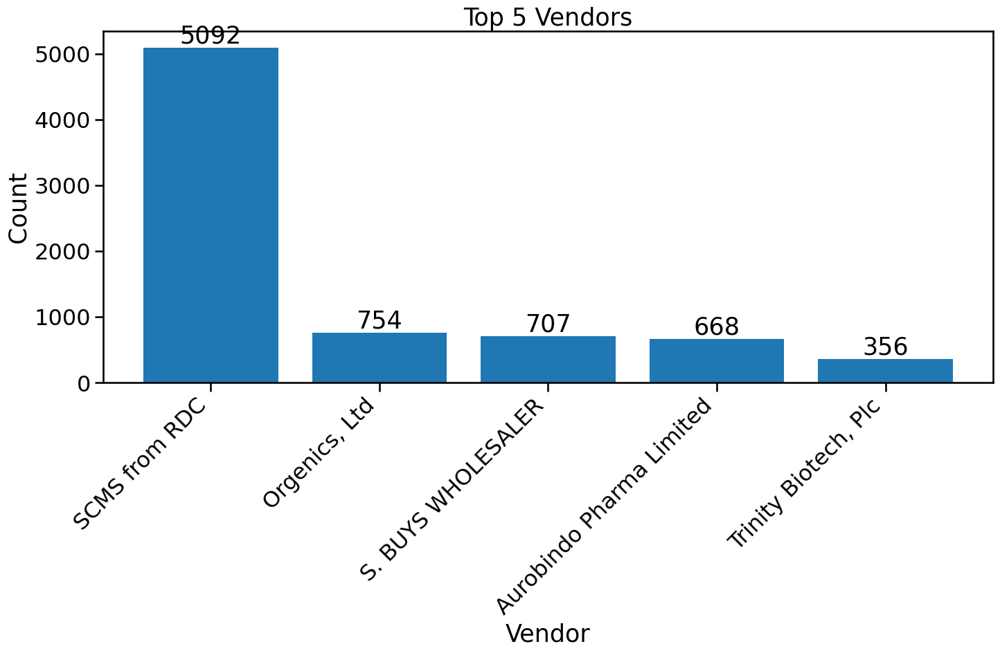

In [ ]:
# Group by vendor and count the occurrences of each vendor
vendor_counts = df['Vendor'].value_counts().nlargest(5)  # Get the top 5 vendors

# Create the bar plot
plt.figure(figsize=(15, 10))  # Adjust figure size as needed
bars = plt.bar(vendor_counts.index, vendor_counts.values)

# Add value labels on top of each bar
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, int(yval), ha='center', va='bottom')

plt.title('Top 5 Vendors')
plt.xlabel('Vendor')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
plt.tight_layout()
plt.show()

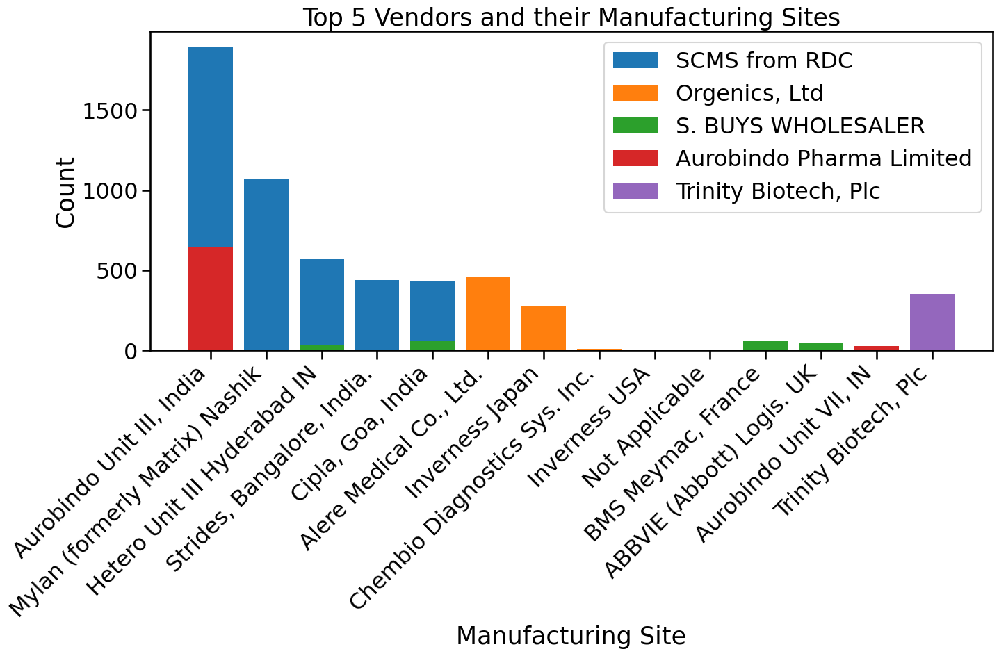

In [ ]:
# Group by vendor and count the occurrences of each manufacturing site
vendor_manufacturer_counts = df.groupby('Vendor')['Manufacturing Site'].value_counts().reset_index(name='Count')

# Get the top 5 vendors and their manufacturing sites
top_5_vendors = vendor_manufacturer_counts.groupby('Vendor')['Count'].sum().nlargest(5).index
top_vendors_df = vendor_manufacturer_counts[vendor_manufacturer_counts['Vendor'].isin(top_5_vendors)]


# Create the bar plot
plt.figure(figsize=(15, 10))  # Adjust figure size as needed
for vendor in top_5_vendors:
    vendor_data = top_vendors_df[top_vendors_df['Vendor'] == vendor].nlargest(5, 'Count')
    plt.bar(vendor_data['Manufacturing Site'], vendor_data['Count'], label=vendor)

plt.title('Top 5 Vendors and their Manufacturing Sites')
plt.xlabel('Manufacturing Site')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
plt.legend()
plt.tight_layout()
plt.show()

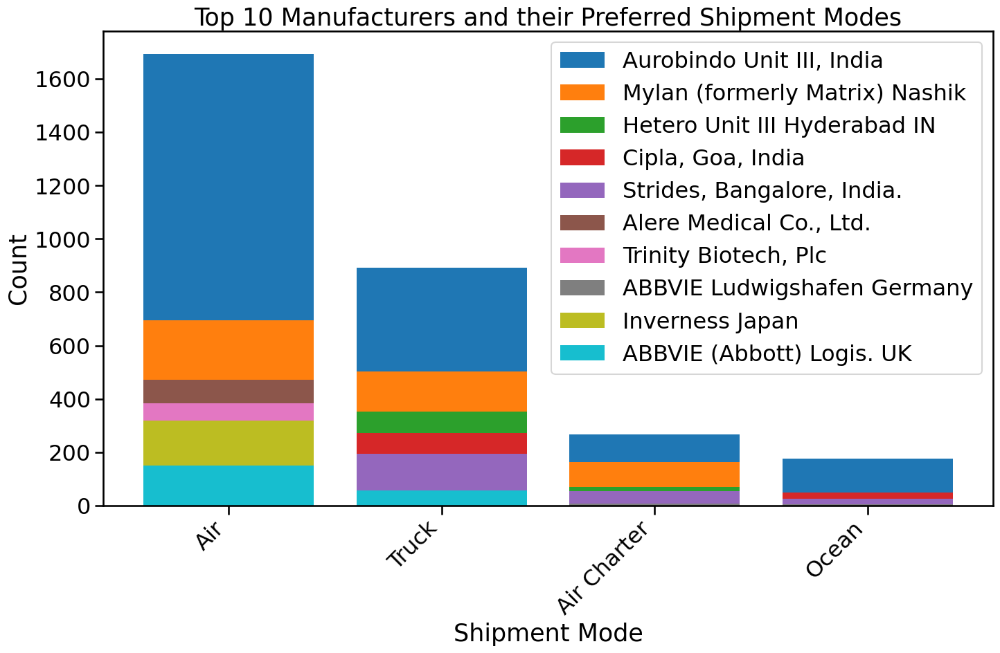

Top Shipment Modes for Aurobindo Unit III, India:
           Manufacturing Site Shipment Mode  Count
22  Aurobindo Unit III, India           Air   1694
23  Aurobindo Unit III, India         Truck    892
24  Aurobindo Unit III, India   Air Charter    268
25  Aurobindo Unit III, India         Ocean    177
---
Top Shipment Modes for Mylan (formerly Matrix) Nashik:
                 Manufacturing Site Shipment Mode  Count
123  Mylan (formerly Matrix) Nashik           Air    695
124  Mylan (formerly Matrix) Nashik         Truck    504
125  Mylan (formerly Matrix) Nashik   Air Charter    164
126  Mylan (formerly Matrix) Nashik         Ocean     44
---
Top Shipment Modes for Hetero Unit III Hyderabad IN:
              Manufacturing Site Shipment Mode  Count
81  Hetero Unit III Hyderabad IN           Air    417
82  Hetero Unit III Hyderabad IN         Truck    352
83  Hetero Unit III Hyderabad IN   Air Charter     70
84  Hetero Unit III Hyderabad IN         Ocean     29
---
Top Shipment Modes f

In [ ]:
# Group by 'Manufacturing Site' and 'Shipment Mode' to count occurrences
shipment_mode_counts = df.groupby('Manufacturing Site')['Shipment Mode'].value_counts().reset_index(name='Count')

# Get the top 10 manufacturers
top_10_manufacturers = shipment_mode_counts.groupby('Manufacturing Site')['Count'].sum().nlargest(10).index

# Filter data for the top 10 manufacturers
top_manufacturers_df = shipment_mode_counts[shipment_mode_counts['Manufacturing Site'].isin(top_10_manufacturers)]

# Create the visualization
import matplotlib.pyplot as plt

plt.figure(figsize=(15, 10))
for manufacturer in top_10_manufacturers:
    manufacturer_data = top_manufacturers_df[top_manufacturers_df['Manufacturing Site'] == manufacturer]
    plt.bar(manufacturer_data['Shipment Mode'], manufacturer_data['Count'], label=manufacturer)

plt.title('Top 10 Manufacturers and their Preferred Shipment Modes')
plt.xlabel('Shipment Mode')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')
plt.legend()
plt.tight_layout()
plt.show()

# Alternatively, to just print the top shipment modes for each manufacturer:
for manufacturer in top_10_manufacturers:
  manufacturer_data = top_manufacturers_df[top_manufacturers_df['Manufacturing Site'] == manufacturer]
  print(f"Top Shipment Modes for {manufacturer}:")
  print(manufacturer_data.sort_values(by='Count', ascending=False))
  print("---")

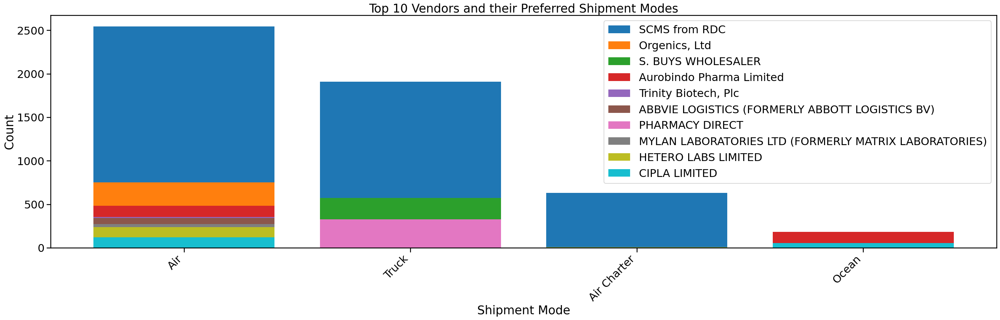

Top Shipment Modes for SCMS from RDC:
           Vendor Shipment Mode  Count
74  SCMS from RDC           Air   2545
75  SCMS from RDC         Truck   1910
76  SCMS from RDC   Air Charter    632
77  SCMS from RDC         Ocean      5
---
Top Shipment Modes for Orgenics, Ltd:
           Vendor Shipment Mode  Count
62  Orgenics, Ltd           Air    753
63  Orgenics, Ltd         Ocean      1
---
Top Shipment Modes for S. BUYS WHOLESALER:
                Vendor Shipment Mode  Count
72  S. BUYS WHOLESALER         Truck    573
73  S. BUYS WHOLESALER           Air    134
---
Top Shipment Modes for Aurobindo Pharma Limited:
                      Vendor Shipment Mode  Count
14  Aurobindo Pharma Limited           Air    482
15  Aurobindo Pharma Limited         Ocean    182
16  Aurobindo Pharma Limited   Air Charter      4
---
Top Shipment Modes for Trinity Biotech, Plc:
                  Vendor Shipment Mode  Count
91  Trinity Biotech, Plc           Air    353
92  Trinity Biotech, Plc         Oc

In [ ]:
# Group by 'Vendor' and 'Shipment Mode' to count occurrences
shipment_mode_counts = df.groupby('Vendor')['Shipment Mode'].value_counts().reset_index(name='Count')

# Get the top 10 vendors
top_10_vendors = shipment_mode_counts.groupby('Vendor')['Count'].sum().nlargest(10).index

# Filter data for the top 10 vendors
top_vendors_df = shipment_mode_counts[shipment_mode_counts['Vendor'].isin(top_10_vendors)]

# Create the visualization
import matplotlib.pyplot as plt

plt.figure(figsize=(30, 10))
for vendor in top_10_vendors:
    vendor_data = top_vendors_df[top_vendors_df['Vendor'] == vendor]
    plt.bar(vendor_data['Shipment Mode'], vendor_data['Count'], label=vendor)

plt.title('Top 10 Vendors and their Preferred Shipment Modes')
plt.xlabel('Shipment Mode')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')
plt.legend()
plt.tight_layout()
plt.show()

# Alternatively, to just print the top shipment modes for each vendor:
for vendor in top_10_vendors:
    vendor_data = top_vendors_df[top_vendors_df['Vendor'] == vendor]
    print(f"Top Shipment Modes for {vendor}:")
    print(vendor_data.sort_values(by='Count', ascending=False))
    print("---")

## Root Cause Analysis

In [ ]:
df['Pack Price'].value_counts()

,count
Pack Price,
32.00,361
80.00,297
89.00,183
11.22,139
20.00,106
...,...
15.07,1
105.49,1
65.68,1


In [ ]:
# Print only the 'Pack Price' and 'Vendor' columns
print(df[['Pack Price', 'Vendor']])

               Pack Price                                             Vendor
0                   29.00                        RANBAXY Fine Chemicals LTD.
1                    6.20                           Aurobindo Pharma Limited
2                   80.00                               Abbott GmbH & Co. KG
3                    3.99  SUN PHARMACEUTICAL INDUSTRIES LTD (RANBAXY LAB...
4                    3.20                           Aurobindo Pharma Limited
...                   ...                                                ...
9959                 3.60                                      SCMS from RDC
9960                 6.52                                      SCMS from RDC
9961                 9.99                                      SCMS from RDC
9962                 6.52                                      SCMS from RDC
9963                 1.99                                      SCMS from RDC

[9964 rows x 2 columns]


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9964 entries, 0 to 9963
Data columns (total 35 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        --------------  -----         
 0   ID                            9964 non-null   int64         
 1   Project Code                  9964 non-null   object        
 2   PQ #                          9964 non-null   object        
 3   PO / SO #                     9964 non-null   object        
 4   ASN/DN #                      9964 non-null   object        
 5   Country                       9964 non-null   object        
 6   Managed By                    9964 non-null   object        
 7   Fulfill Via                   9964 non-null   object        
 8   Vendor INCO Term              9964 non-null   object        
 9   Shipment Mode                 9964 non-null   object        
 10  PQ First Sent to Client Date  9964 non-null   datetime64[ns]
 11  PO Sent to Vendor Date        

## Time Delivery

In [ ]:
# Calculate Delivery Delay in days, ensuring no negative values
df['Delivery Delay'] = (df['Delivered to Client Date'] - df['Scheduled Delivery Date']).dt.days.clip(lower=0)

# Group by Vendor and calculate On-Time Delivery Rate and Average Delivery Delay
vendor_metrics = df.groupby('Vendor').agg(
    on_time_delivery_rate=('Delivery Delay', lambda x: (x <= 0).mean() * 100),
    average_delivery_delay=('Delivery Delay', 'mean')
).reset_index()

# Normalize On-Time Delivery Rate to 0-1
vendor_metrics['on_time_delivery_rate'] /= 100  # Normalize to 0-1

# Normalize Average Delivery Delay to 0-1
max_delay = vendor_metrics['average_delivery_delay'].max()
vendor_metrics['average_delivery_delay'] = 1 - (vendor_metrics['average_delivery_delay'] / max_delay)

# Calculate Reliability Score using normalized values and weights
vendor_metrics['Reliability Score'] = (vendor_metrics['on_time_delivery_rate'] * 0.7) + (vendor_metrics['average_delivery_delay'] * 0.3)

# Merge the metrics back to the original DataFrame
df = df.merge(vendor_metrics[['Vendor', 'on_time_delivery_rate', 'average_delivery_delay', 'Reliability Score']], on='Vendor', how='left')

# Create a DataFrame for average delivery delay (for printing unscaled values)
average_delay_by_vendor = df.groupby('Vendor')['Delivery Delay'].mean().reset_index(name='Average Delivery Delay (days)')

# Print the top 10 vendors with the lowest average delivery delay (unscaled)
print("Top 10 Vendors with Lowest Average Delivery Delay (Unscaled):")
print(average_delay_by_vendor.nsmallest(10, 'Average Delivery Delay (days)'))

# Print the top 10 vendors with the lowest average delivery delay (scaled)
print("\nTop 10 Vendors with Lowest Average Delivery Delay (Scaled):")
print(vendor_metrics.nsmallest(10, 'average_delivery_delay'))

# Print the top 10 vendors with the lowest reliability score
print("\nTop 10 Vendors with Lowest Reliability Score:")
print(vendor_metrics.nsmallest(10, 'Reliability Score'))

Top 10 Vendors with Lowest Average Delivery Delay (Unscaled):
                                               Vendor  \
0                   ABBOTT LABORATORIES (PUERTO RICO)   
1                               ABBOTT LOGISTICS B.V.   
3   ABBVIE, SRL (FORMALLY ABBOTT LABORATORIES INTE...   
4                                    ACCESS BIO, INC.   
5                                  ACOUNS NIGERIA LTD   
6                                  ACTION MEDEOR E.V.   
7                       AHN (PTY) LTD (AKA UCB (S.A.)   
8                                    AMSTELFARMA B.V.   
10                    AUROBINDO PHARAM (SOUTH AFRICA)   
13                                     B&C GROUP S.A.   

    Average Delivery Delay (days)  
0                            0.00  
1                            0.00  
3                            0.00  
4                            0.00  
5                            0.00  
6                            0.00  
7                            0.00  
8                     

In [ ]:
# Create a new column 'Delivery Status' based on delivery dates
df['Delivery Status'] = (df['Delivered to Client Date'] <= df['Scheduled Delivery Date']).astype(int) # 1 for on-time, 0 for late

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9964 entries, 0 to 9963
Data columns (total 40 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        --------------  -----         
 0   ID                            9964 non-null   int64         
 1   Project Code                  9964 non-null   object        
 2   PQ #                          9964 non-null   object        
 3   PO / SO #                     9964 non-null   object        
 4   ASN/DN #                      9964 non-null   object        
 5   Country                       9964 non-null   object        
 6   Managed By                    9964 non-null   object        
 7   Fulfill Via                   9964 non-null   object        
 8   Vendor INCO Term              9964 non-null   object        
 9   Shipment Mode                 9964 non-null   object        
 10  PQ First Sent to Client Date  9964 non-null   datetime64[ns]
 11  PO Sent to Vendor Date        

In [ ]:
# Find the suppliers with the highest on-time delivery rates
highest_on_time_delivery_suppliers = df.sort_values('on_time_delivery_rate', ascending=False)

# Print the result
print(highest_on_time_delivery_suppliers[['Vendor', 'on_time_delivery_rate']])

                                                 Vendor  on_time_delivery_rate
5108  LAWRENCE LABORATORIES (SUBSIDIARY OF BRISTOL M...                   1.00
5106                                    PHARMACY DIRECT                   1.00
6218  LAWRENCE LABORATORIES (SUBSIDIARY OF BRISTOL M...                   1.00
62                                   ZEPHYR BIOMEDICALS                   1.00
78                                       IDA FOUNDATION                   1.00
...                                                 ...                    ...
6502                                      SCMS from RDC                   0.82
6501                                      SCMS from RDC                   0.82
6500                                      SCMS from RDC                   0.82
6499                                      SCMS from RDC                   0.82
6508                                      SCMS from RDC                   0.82

[9964 rows x 2 columns]


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9964 entries, 0 to 9963
Data columns (total 40 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        --------------  -----         
 0   ID                            9964 non-null   int64         
 1   Project Code                  9964 non-null   object        
 2   PQ #                          9964 non-null   object        
 3   PO / SO #                     9964 non-null   object        
 4   ASN/DN #                      9964 non-null   object        
 5   Country                       9964 non-null   object        
 6   Managed By                    9964 non-null   object        
 7   Fulfill Via                   9964 non-null   object        
 8   Vendor INCO Term              9964 non-null   object        
 9   Shipment Mode                 9964 non-null   object        
 10  PQ First Sent to Client Date  9964 non-null   datetime64[ns]
 11  PO Sent to Vendor Date        

In [ ]:
# Drop columns with any missing values
df = df.dropna(axis=1)

#To automatically find and drop duplicate columns based on identical values
cols_to_drop = []
for i in range(len(df.columns)):
  for j in range(i+1, len(df.columns)):
    if df.iloc[:,i].equals(df.iloc[:, j]):
      cols_to_drop.append(df.columns[j])

df = df.drop(columns=cols_to_drop, errors='ignore')

print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9964 entries, 0 to 9963
Data columns (total 40 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        --------------  -----         
 0   ID                            9964 non-null   int64         
 1   Project Code                  9964 non-null   object        
 2   PQ #                          9964 non-null   object        
 3   PO / SO #                     9964 non-null   object        
 4   ASN/DN #                      9964 non-null   object        
 5   Country                       9964 non-null   object        
 6   Managed By                    9964 non-null   object        
 7   Fulfill Via                   9964 non-null   object        
 8   Vendor INCO Term              9964 non-null   object        
 9   Shipment Mode                 9964 non-null   object        
 10  PQ First Sent to Client Date  9964 non-null   datetime64[ns]
 11  PO Sent to Vendor Date        

In [ ]:
delivery_status_percentage = (df['Delivery Status'].value_counts() * 100) / len(df)
print(delivery_status_percentage)

Delivery Status
1                  88.14
0                  11.86
Name: count, dtype: float64


In [ ]:
df['Reliability Score'].value_counts()

,count
Reliability Score,
0.67,5092
0.82,754
0.97,707
0.62,668
1.00,625
0.99,356
0.97,347
0.99,317
0.99,277


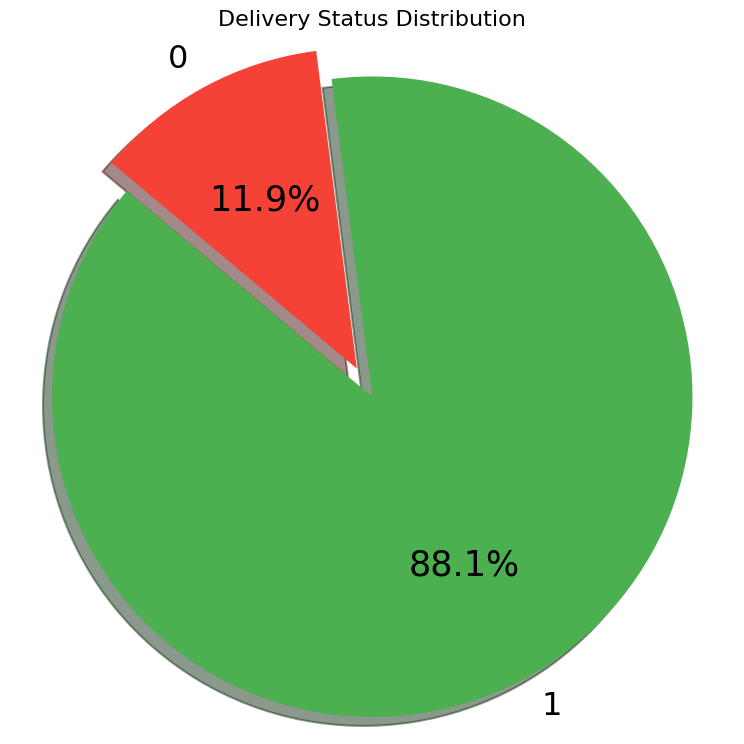

In [ ]:
import matplotlib.pyplot as plt

# Count the delivery status
delivery_status_counts = df['Delivery Status'].value_counts()

# Define colors for the pie chart
colors = ['#4CAF50', '#F44336']  # Green for On-Time, Red for Late

# Create the pie chart
plt.figure(figsize=(8, 8))
plt.pie(delivery_status_counts, labels=delivery_status_counts.index, colors=colors,
        autopct='%1.1f%%', startangle=140, explode=(0.1, 0), shadow=True)

# Add title
plt.title('Delivery Status Distribution', fontsize=16)

# Show the plot
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.tight_layout()  # Adjust layout to prevent clipping
plt.show()

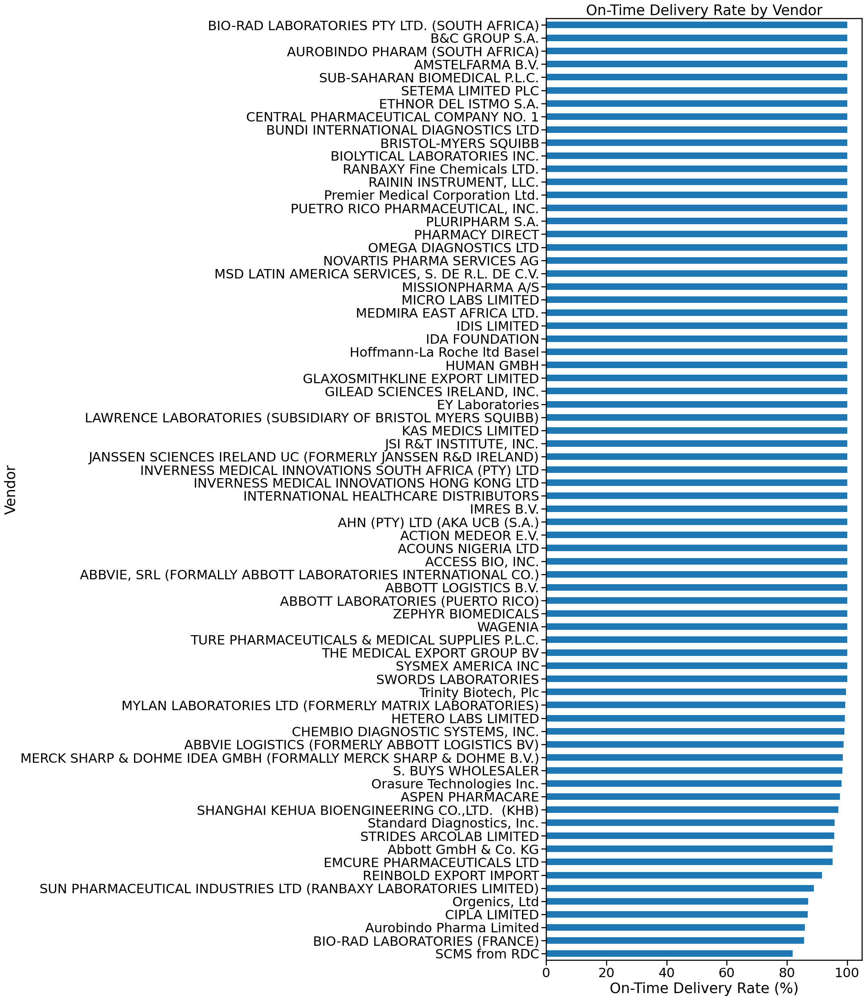

In [ ]:
 #2. On-Time Delivery Rate by Vendor
on_time_by_vendor = df.groupby('Vendor')['on_time_delivery_rate'].mean() * 100
plt.figure(figsize=(10, 30))
on_time_by_vendor.sort_values().plot(kind='barh')  # Use a horizontal bar plot
plt.title('On-Time Delivery Rate by Vendor')
plt.xlabel('On-Time Delivery Rate (%)')
plt.ylabel('Vendor')
plt.show()


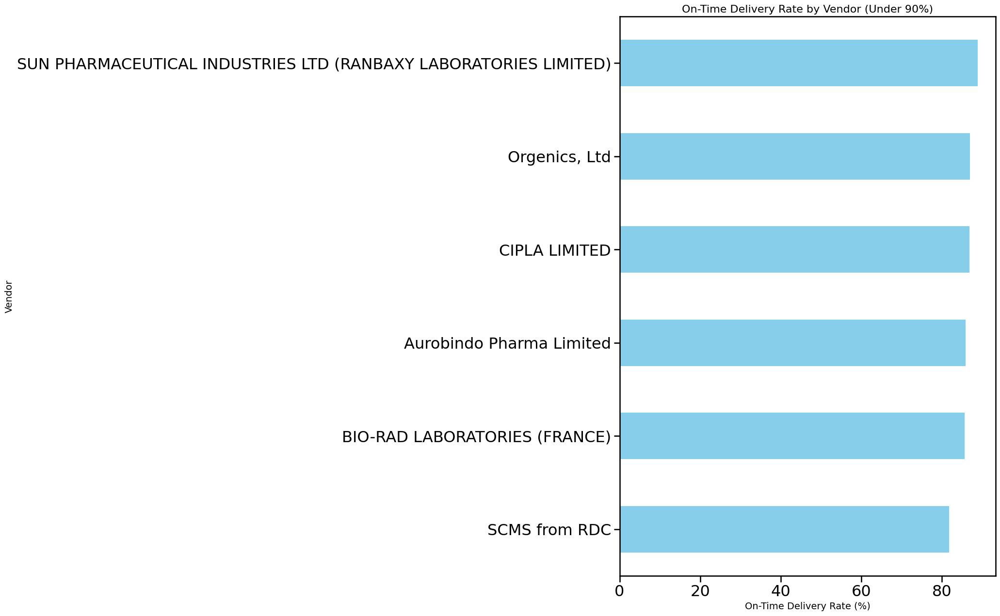

In [ ]:


# Calculate the on-time delivery rate by vendor
on_time_by_vendor = df.groupby('Vendor')['on_time_delivery_rate'].mean() * 100

# Filter vendors with on-time delivery rate under 90%
on_time_by_vendor = on_time_by_vendor[on_time_by_vendor < 90]

# Sort the values
on_time_by_vendor = on_time_by_vendor.sort_values()

# Create the horizontal bar plot
plt.figure(figsize=(10, 15))  # Adjusted height for better readability
on_time_by_vendor.plot(kind='barh', color='skyblue')  # Use a horizontal bar plot

# Add titles and labels
plt.title('On-Time Delivery Rate by Vendor (Under 90%)', fontsize=16)
plt.xlabel('On-Time Delivery Rate (%)', fontsize=14)
plt.ylabel('Vendor', fontsize=14)

# Show the plot
plt.show()

                                               Vendor most_frequent_country  \
0                   ABBOTT LABORATORIES (PUERTO RICO)                Guyana   
1                               ABBOTT LOGISTICS B.V.             Guatemala   
2     ABBVIE LOGISTICS (FORMERLY ABBOTT LOGISTICS BV)               Vietnam   
3   ABBVIE, SRL (FORMALLY ABBOTT LABORATORIES INTE...    Dominican Republic   
4                                    ACCESS BIO, INC.                 Haiti   
..                                                ...                   ...   
67                        THE MEDICAL EXPORT GROUP BV                 Haiti   
68     TURE PHARMACEUTICALS & MEDICAL SUPPLIES P.L.C.              Ethiopia   
69                               Trinity Biotech, Plc            Congo, DRC   
70                                            WAGENIA            Congo, DRC   
71                                 ZEPHYR BIOMEDICALS                Guyana   

   most_frequent_product_group  
0                 

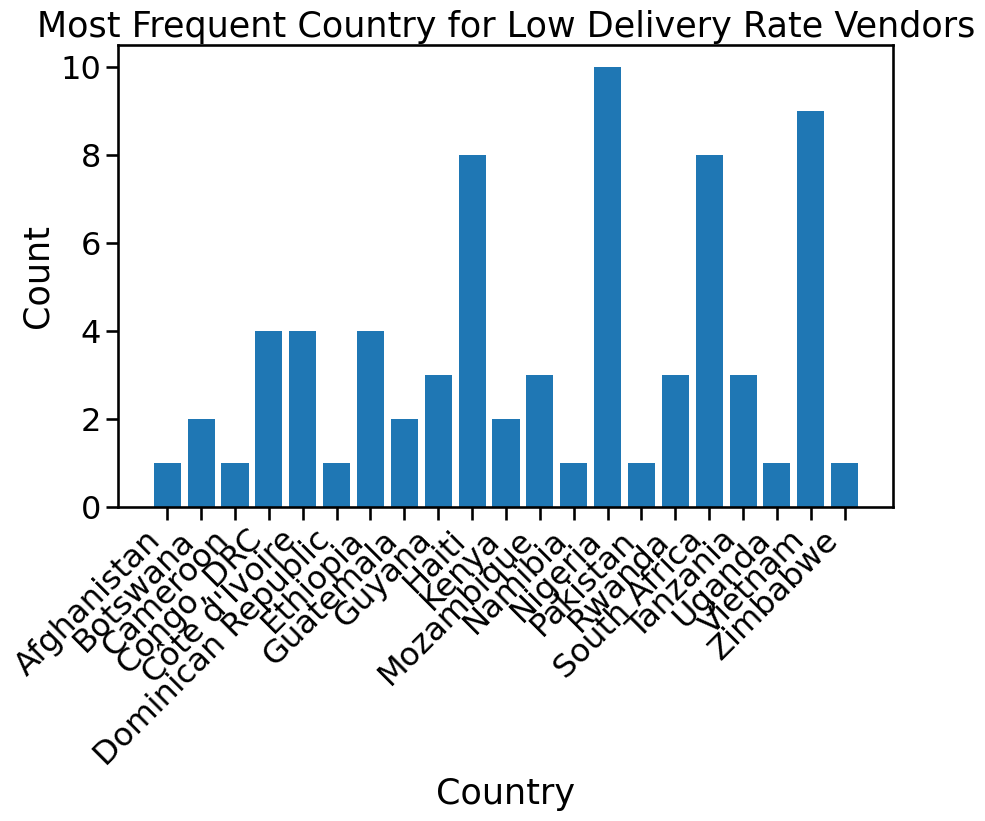

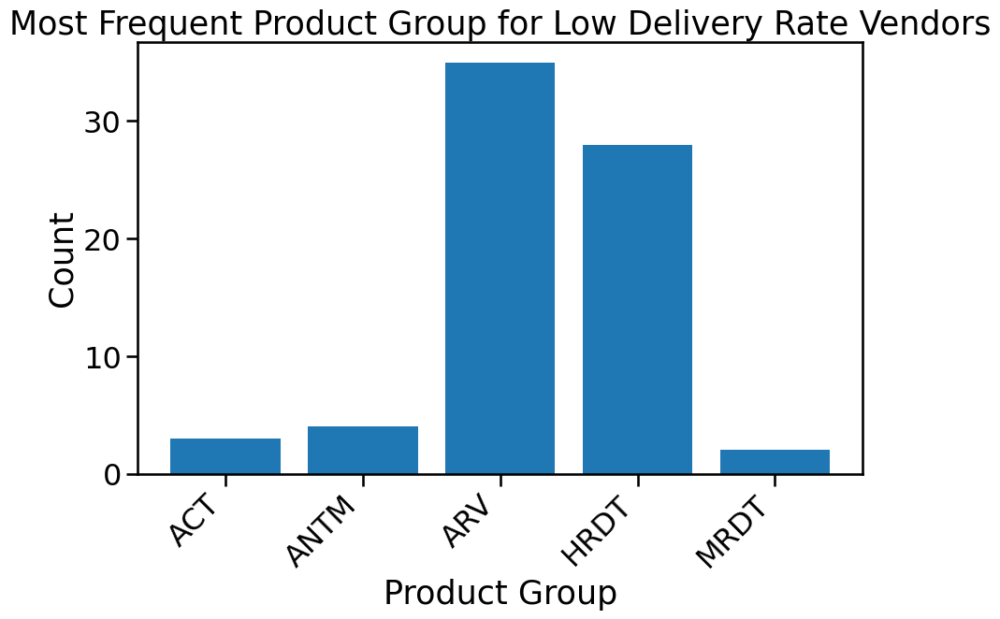

In [ ]:
low_delivery_vendors = df[df['on_time_delivery_rate'] < 90] # Adjust the threshold as needed

# Group by vendor and get the most frequent country and product group
low_delivery_summary = low_delivery_vendors.groupby('Vendor').agg(
    most_frequent_country=('Country', lambda x: x.mode()[0] if not x.mode().empty else 'Unknown'),
    most_frequent_product_group=('Product Group', lambda x: x.mode()[0] if not x.mode().empty else 'Unknown')
).reset_index()


print(low_delivery_summary)

# Group by 'most_frequent_country' and get the counts for each country
country_counts = low_delivery_summary.groupby('most_frequent_country')['Vendor'].count().reset_index(name='Count')


plt.figure(figsize=(10, 6))  # Adjusted figure size for better visualization
plt.bar(country_counts['most_frequent_country'], country_counts['Count'])  # Plot country vs. count
plt.xticks(rotation=45, ha='right')
plt.title('Most Frequent Country for Low Delivery Rate Vendors')
plt.xlabel('Country')  # Changed x-axis label to "Country"
plt.ylabel('Count')
plt.show()

product_group_counts = low_delivery_summary.groupby('most_frequent_product_group')['Vendor'].count().reset_index(name='Count')


plt.figure(figsize=(10, 6))  # Adjusted figure size for better visualization
plt.bar(product_group_counts['most_frequent_product_group'], product_group_counts['Count'])  # Plot product group vs. count
plt.xticks(rotation=45, ha='right')
plt.title('Most Frequent Product Group for Low Delivery Rate Vendors')
plt.xlabel('Product Group')  # Changed x-axis label to "Product Group"
plt.ylabel('Count')
plt.show()

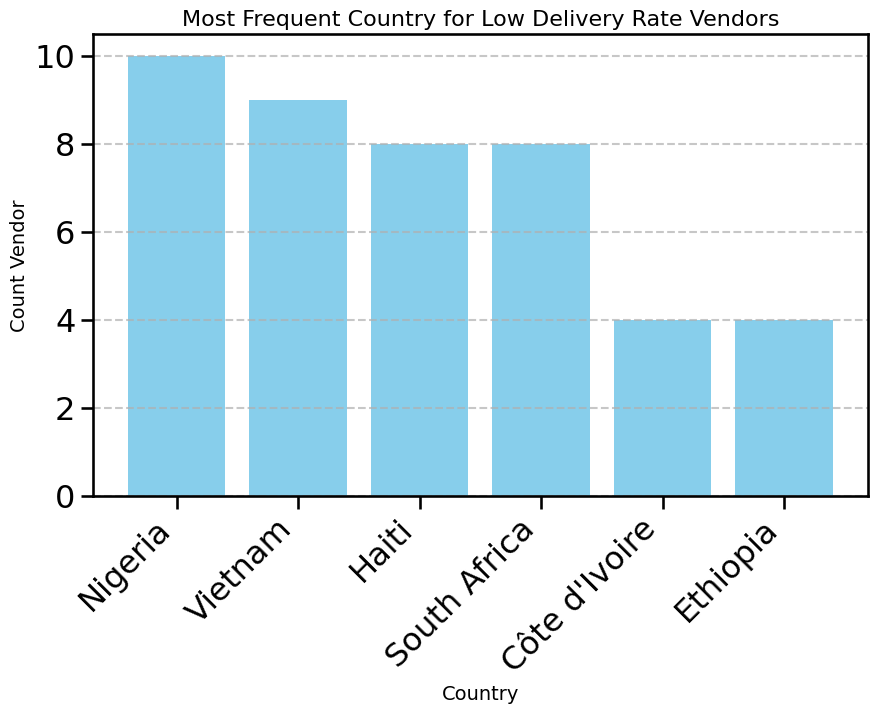

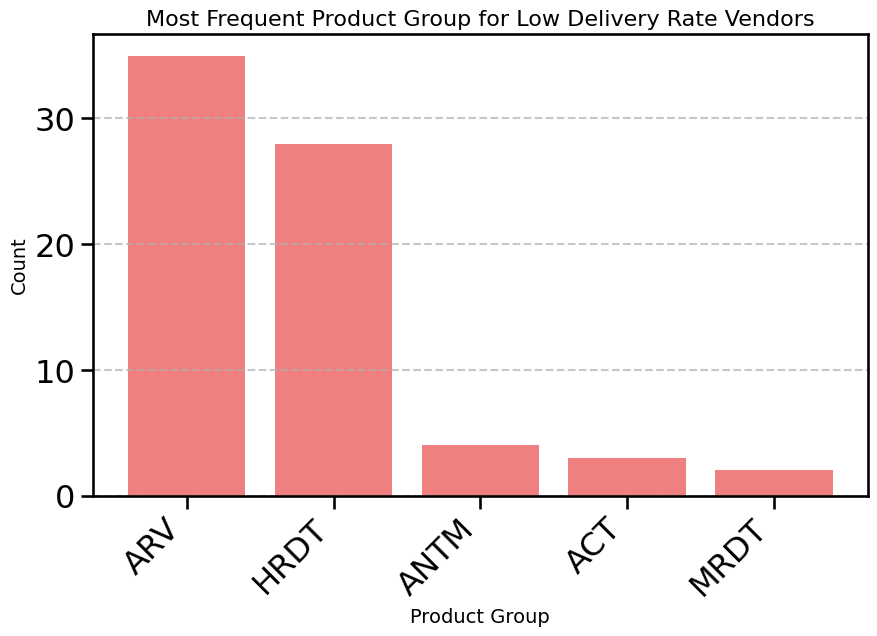

In [ ]:

# Filter for vendors with low on-time delivery rates
low_delivery_vendors = df[df['on_time_delivery_rate'] < 90]  # Adjust the threshold as needed

# Group by vendor and get the most frequent country and product group
low_delivery_summary = low_delivery_vendors.groupby('Vendor').agg(
    most_frequent_country=('Country', lambda x: x.mode()[0] if not x.mode().empty else 'Unknown'),
    most_frequent_product_group=('Product Group', lambda x: x.mode()[0] if not x.mode().empty else 'Unknown')
).reset_index()

# Group by 'most_frequent_country' and get the counts for each country
country_counts = low_delivery_summary['most_frequent_country'].value_counts().reset_index()
country_counts.columns = ['most_frequent_country', 'Count']

# Filter to get the top 6 countries
top_countries = country_counts.nlargest(6, 'Count')

# Plot for Most Frequent Country for Low Delivery Rate Vendors
plt.figure(figsize=(10, 6))  # Adjusted figure size for better visualization
plt.bar(top_countries['most_frequent_country'], top_countries['Count'], color='skyblue')  # Use a color for better visual appeal
plt.xticks(rotation=45, ha='right')
plt.title('Most Frequent Country for Low Delivery Rate Vendors', fontsize=16)
plt.xlabel('Country', fontsize=14)
plt.ylabel('Count Vendor', fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.7)  # Add grid for better readability
plt.show()

# Group by 'most_frequent_product_group' and get the counts for each group
product_group_counts = low_delivery_summary['most_frequent_product_group'].value_counts().reset_index()
product_group_counts.columns = ['most_frequent_product_group', 'Count']

# Filter to get the top 6 product groups
top_product_groups = product_group_counts.nlargest(6, 'Count')

# Plot for Most Frequent Product Group for Low Delivery Rate Vendors
plt.figure(figsize=(10, 6))  # Adjusted figure size for better visualization
plt.bar(top_product_groups['most_frequent_product_group'], top_product_groups['Count'], color='lightcoral')  # Use a different color
plt.xticks(rotation=45, ha='right')
plt.title('Most Frequent Product Group for Low Delivery Rate Vendors', fontsize=16)
plt.xlabel('Product Group', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.7)  # Add grid for better readability
plt.show()

In [ ]:
low_delivery_vendors = df[df['on_time_delivery_rate'] < 90] # Adjust the threshold as needed

# Group by vendor and get the average freight cost
low_delivery_freight_cost = low_delivery_vendors.groupby('Vendor')['Freight Cost (USD)'].mean().reset_index()


print(low_delivery_freight_cost)



                                               Vendor   Freight Cost (USD)
0                   ABBOTT LABORATORIES (PUERTO RICO)               314.00
1                               ABBOTT LOGISTICS B.V.                 0.00
2     ABBVIE LOGISTICS (FORMERLY ABBOTT LOGISTICS BV)             6,638.10
3   ABBVIE, SRL (FORMALLY ABBOTT LABORATORIES INTE...             5,574.31
4                                    ACCESS BIO, INC.             5,642.36
..                                                ...                  ...
67                        THE MEDICAL EXPORT GROUP BV            37,744.27
68     TURE PHARMACEUTICALS & MEDICAL SUPPLIES P.L.C.                 0.00
69                               Trinity Biotech, Plc             7,966.44
70                                            WAGENIA                 0.00
71                                 ZEPHYR BIOMEDICALS               207.07

[72 rows x 2 columns]


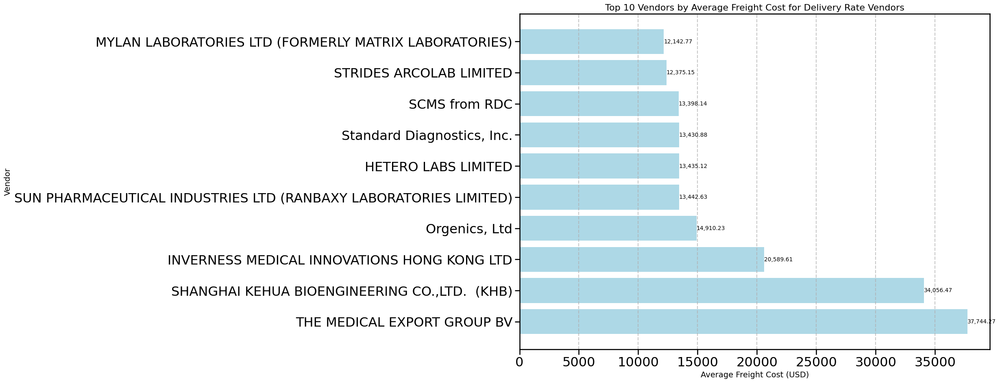

In [ ]:
# Filter for vendors with low on-time delivery rates
low_delivery_vendors = df[df['on_time_delivery_rate'] <= 100]  # Adjust the threshold as needed

# Group by vendor and get the average freight cost
low_delivery_freight_cost = low_delivery_vendors.groupby('Vendor')['Freight Cost (USD)'].mean().reset_index()

# Filter to get the top 10 vendors with the highest average freight cost
top_freight_cost_vendors = low_delivery_freight_cost.nlargest(10, 'Freight Cost (USD)')

# Create the horizontal bar plot for Average Freight Cost
plt.figure(figsize=(25, 10))  # Adjusted figure size for better visualization
bars = plt.barh(top_freight_cost_vendors['Vendor'], top_freight_cost_vendors['Freight Cost (USD)'], color='lightblue')  # Use a color for better visual appeal
plt.title('Top 10 Vendors by Average Freight Cost for Delivery Rate Vendors', fontsize=16)
plt.xlabel('Average Freight Cost (USD)', fontsize=14)
plt.ylabel('Vendor', fontsize=14)
plt.grid(axis='x', linestyle='--', alpha=0.7)  # Add grid for better readability

# Add value labels on the bars
for bar in bars:
    plt.text(bar.get_width(), bar.get_y() + bar.get_height() / 2,
             f'{bar.get_width():,.2f}',
             va='center', ha='left', fontsize=10)

plt.tight_layout()  # Adjust layout to prevent clipping of tick-labels
plt.show()

<ipython-input-67-7e7510e1ec96>:18: UserWarning:

Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.



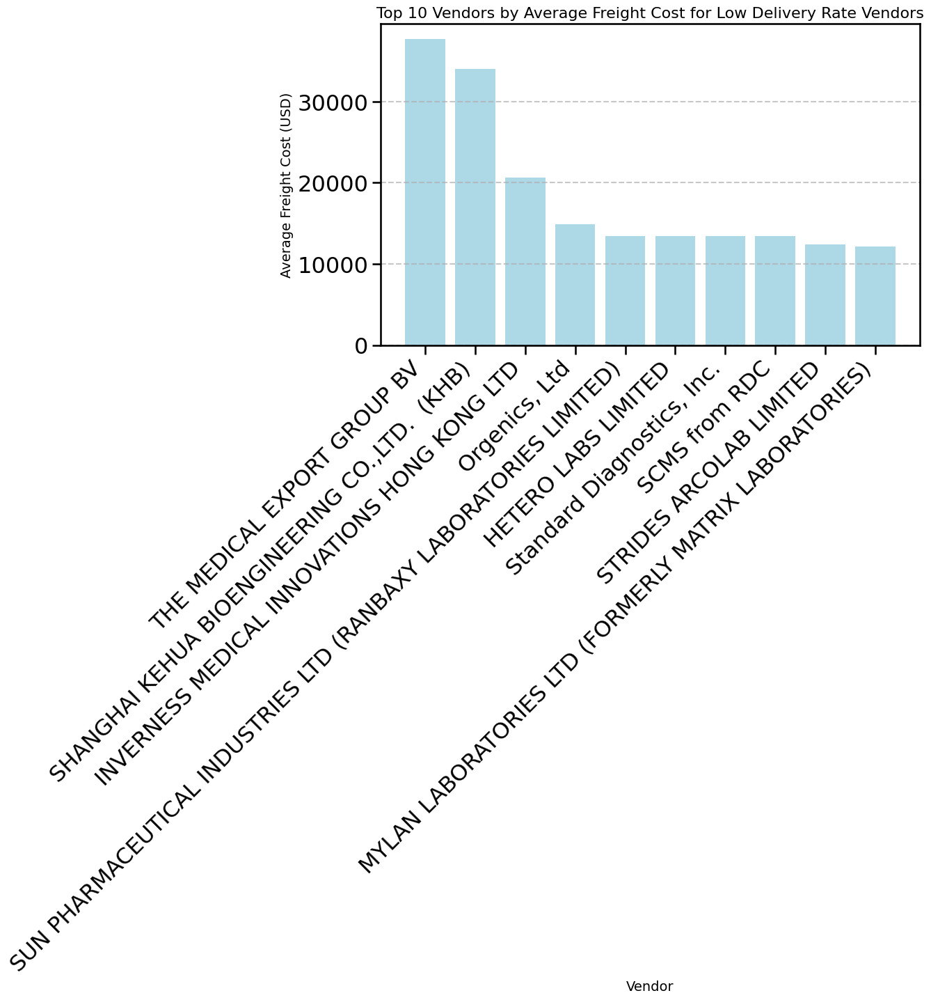

In [ ]:

# Filter for vendors with low on-time delivery rates
low_delivery_vendors = df[df['on_time_delivery_rate'] < 90]  # Adjust the threshold as needed

# Group by vendor and get the average freight cost
low_delivery_freight_cost = low_delivery_vendors.groupby('Vendor')['Freight Cost (USD)'].mean().reset_index()

# Filter to get the top 10 vendors with the highest average freight cost
top_freight_cost_vendors = low_delivery_freight_cost.nlargest(10, 'Freight Cost (USD)')

# Create the bar plot for Average Freight Cost
plt.figure(figsize=(10, 6))  # Adjusted figure size for better visualization
plt.bar(top_freight_cost_vendors['Vendor'], top_freight_cost_vendors['Freight Cost (USD)'], color='lightblue')  # Use a color for better visual appeal
plt.xticks(rotation=45, ha='right')
plt.title('Top 10 Vendors by Average Freight Cost for Low Delivery Rate Vendors', fontsize=16)
plt.xlabel('Vendor', fontsize=14)
plt.ylabel('Average Freight Cost (USD)', fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.7)  # Add grid for better readability
plt.tight_layout()  # Adjust layout to prevent clipping of tick-labels
plt.show()

<ipython-input-68-8e492046d4a2>:37: UserWarning:

Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.



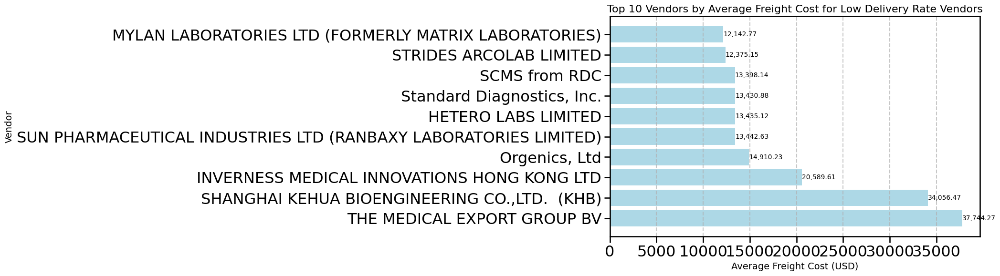

In [ ]:
# Filter for vendors with low on-time delivery rates
low_delivery_vendors = df[df['on_time_delivery_rate'] < 90]  # Adjust the threshold as needed

# Group by vendor and get the average freight cost
low_delivery_freight_cost = low_delivery_vendors.groupby('Vendor')['Freight Cost (USD)'].mean().reset_index()

# Filter to get the top 10 vendors with the highest average freight cost
top_freight_cost_vendors = low_delivery_freight_cost.nlargest(10, 'Freight Cost (USD)')

# Change vendor names for better readability (example: abbreviations or shorter names)
vendor_name_mapping = {
    'ABBVIE, SRL (FORMALLY ABBOTT LABORATORIES INTERNATIONAL CO.)': 'ABBVIE',
    'AUROBINDO PHARAM (SOUTH AFRICA)': 'AUROBINDO',
    'BIO-RAD LABORATORIES PTY LTD. (SOUTH AFRICA)': 'BIO-RAD',
    'ACCESS BIO, INC.': 'ACCESS BIO',
    'ACTION MEDEOR E.V.': 'ACTION MEDEOR',
    'TURE PHARMACEUTICALS & MEDICAL SUPPLIES P.L.C.': 'TURE PHARMA',
    # Add more mappings as needed
}

# Apply the mapping to the vendor names
top_freight_cost_vendors['Vendor'] = top_freight_cost_vendors['Vendor'].replace(vendor_name_mapping)

# Create the bar plot for Average Freight Cost
plt.figure(figsize=(10, 6))  # Adjusted figure size for better visualization
bars = plt.barh(top_freight_cost_vendors['Vendor'], top_freight_cost_vendors['Freight Cost (USD)'], color='lightblue')  # Use a horizontal bar plot
plt.title('Top 10 Vendors by Average Freight Cost for Low Delivery Rate Vendors', fontsize=16)
plt.xlabel('Average Freight Cost (USD)', fontsize=14)
plt.ylabel('Vendor', fontsize=14)
plt.grid(axis='x', linestyle='--', alpha=0.7)  # Add grid for better readability

# Add value labels on the bars
for bar in bars:
    plt.text(bar.get_width(), bar.get_y() + bar.get_height()/2, f'{bar.get_width():,.2f}',
             va='center', ha='left', fontsize=10)

plt.tight_layout()  # Adjust layout to prevent clipping of tick-labels
plt.show()


Top Vendors by Number of Shipments:
Vendor
SCMS from RDC                                            130823025
Aurobindo Pharma Limited                                  16995950
STRIDES ARCOLAB LIMITED                                    7985106
MYLAN LABORATORIES LTD (FORMERLY MATRIX LABORATORIES)      7739464
HETERO LABS LIMITED                                        7530849
                                                           ...    
PLURIPHARM S.A.                                                 12
INVERNESS MEDICAL INNOVATIONS SOUTH AFRICA (PTY) LTD            10
AHN (PTY) LTD (AKA UCB (S.A.)                                    5
RAININ INSTRUMENT, LLC.                                          2
BIO-RAD LABORATORIES PTY LTD. (SOUTH AFRICA)                     1
Name: Line Item Quantity, Length: 72, dtype: int64


<ipython-input-69-5b4def1ddea2>:20: UserWarning:

Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.



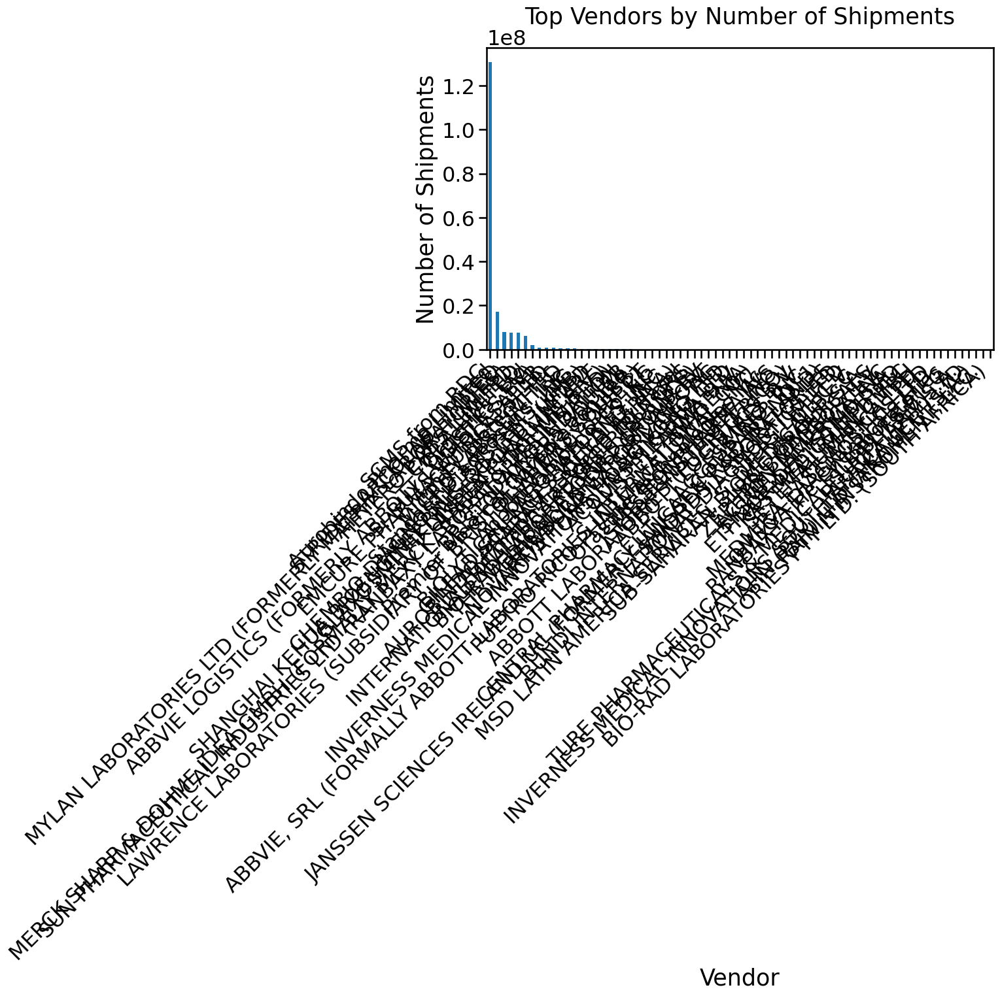

In [ ]:
# Group by vendor and sum the number of shipments
vendor_shipments = df.groupby('Vendor')['Line Item Quantity'].sum()

# Sort the vendors by the number of shipments in descending order
top_vendors = vendor_shipments.sort_values(ascending=False)

# Print the top vendors and their shipment counts
print("Top Vendors by Number of Shipments:")
print(top_vendors)

# You can also visualize this using a bar plot
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))  # Adjust figure size as needed
top_vendors.plot(kind='bar')
plt.title('Top Vendors by Number of Shipments')
plt.xlabel('Vendor')
plt.ylabel('Number of Shipments')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
plt.tight_layout()
plt.show()

In [ ]:
print(low_delivery_freight_cost)

                                               Vendor   Freight Cost (USD)
0                   ABBOTT LABORATORIES (PUERTO RICO)               314.00
1                               ABBOTT LOGISTICS B.V.                 0.00
2     ABBVIE LOGISTICS (FORMERLY ABBOTT LOGISTICS BV)             6,638.10
3   ABBVIE, SRL (FORMALLY ABBOTT LABORATORIES INTE...             5,574.31
4                                    ACCESS BIO, INC.             5,642.36
..                                                ...                  ...
67                        THE MEDICAL EXPORT GROUP BV            37,744.27
68     TURE PHARMACEUTICALS & MEDICAL SUPPLIES P.L.C.                 0.00
69                               Trinity Biotech, Plc             7,966.44
70                                            WAGENIA                 0.00
71                                 ZEPHYR BIOMEDICALS               207.07

[72 rows x 2 columns]


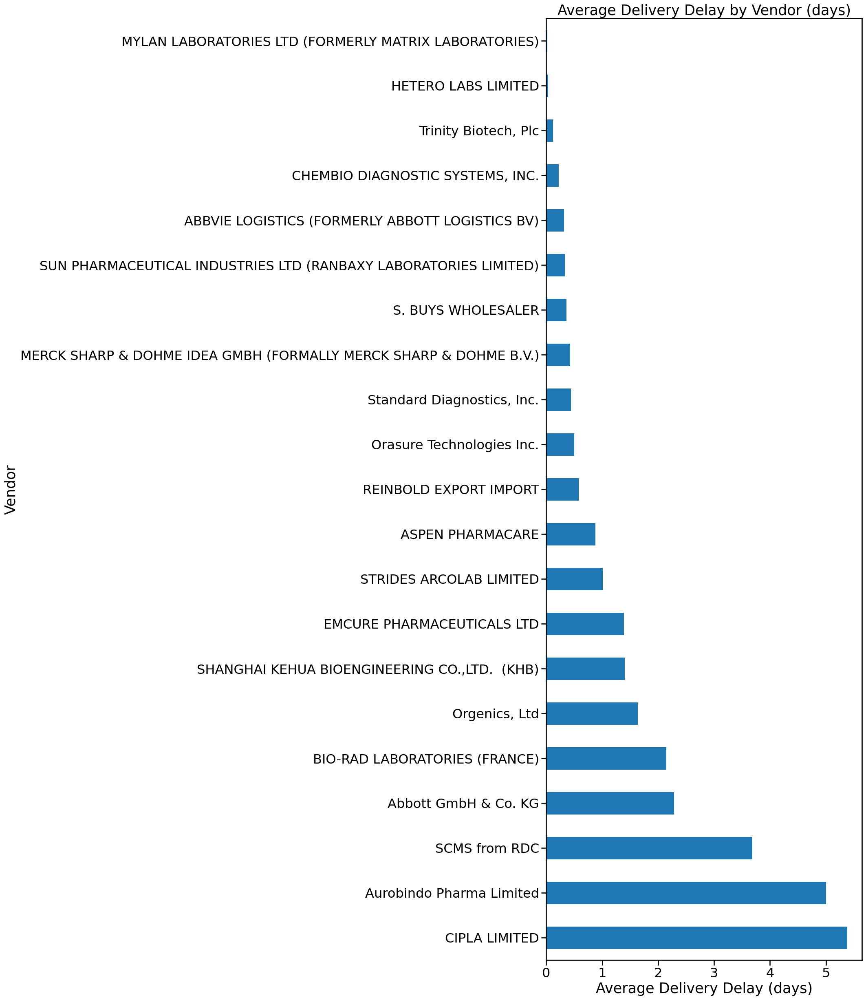

In [ ]:
# 3. Average Delivery Delay by Vendor, filtering for delays > 0
average_delay_by_vendor = df.groupby('Vendor')['Delivery Delay'].mean().sort_values(ascending=False)

# Filter to include only delays greater than 0
average_delay_by_vendor = average_delay_by_vendor[average_delay_by_vendor > 0]

plt.figure(figsize=(10, 30))
average_delay_by_vendor.plot(kind='barh')  # Use horizontal bar plot
plt.title('Average Delivery Delay by Vendor (days)')
plt.xlabel('Average Delivery Delay (days)')
plt.ylabel('Vendor')
plt.show()

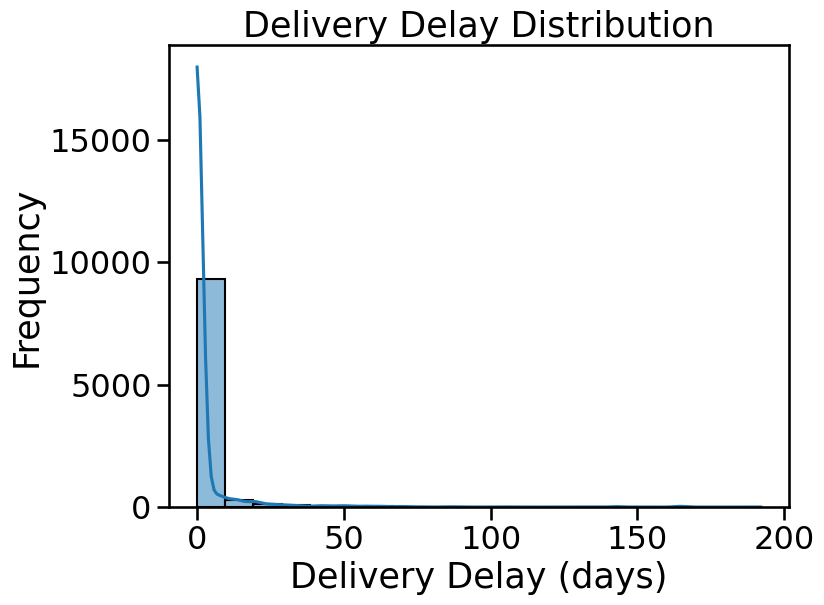

In [ ]:
# 4. Delivery Delay Distribution
plt.figure(figsize=(8, 6))
sns.histplot(df['Delivery Delay'], bins=20, kde=True)
plt.title('Delivery Delay Distribution')
plt.xlabel('Delivery Delay (days)')
plt.ylabel('Frequency')
plt.show()


<ipython-input-73-dbcc9595e4cd>:29: UserWarning:

Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.



<Figure size 1400x1200 with 0 Axes>

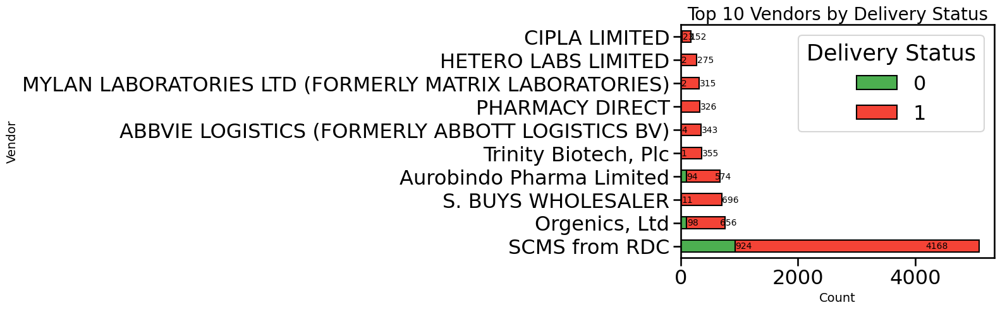

In [ ]:

# Count the number of deliveries per vendor and delivery status
delivery_status_counts = df.groupby(['Vendor', 'Delivery Status']).size().unstack(fill_value=0)

# Limit to top 10 vendors based on total deliveries
top_vendors = delivery_status_counts.sum(axis=1).nlargest(10).index
delivery_status_counts = delivery_status_counts.loc[top_vendors]

# Set the figure size
plt.figure(figsize=(14, 12))

# Create a stacked bar chart
delivery_status_counts.plot(kind='barh', stacked=True, color=['#4CAF50', '#F44336'], edgecolor='black')

# Add title and labels
plt.title('Top 10 Vendors by Delivery Status', fontsize=20)
plt.xlabel('Count', fontsize=14)
plt.ylabel('Vendor', fontsize=14)

# Rotate x-axis labels for better readability
plt.yticks(rotation=0)

# Add value labels on each segment
for index, value in enumerate(delivery_status_counts.values):
    for i, count in enumerate(value):
        if count > 0:
            plt.text(count + 10, index, str(count), va='center', ha='left', fontsize=10)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()


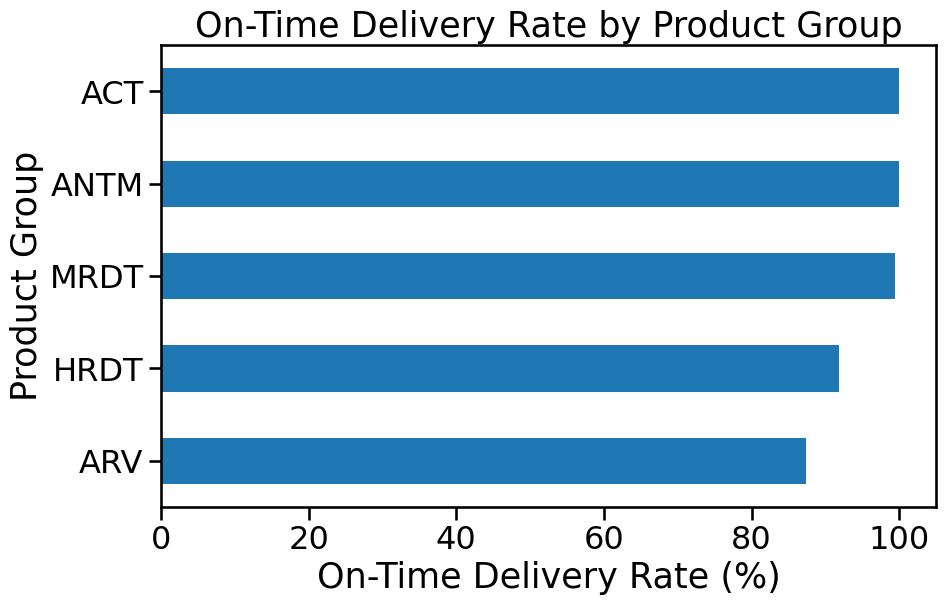

In [ ]:
# 6.  Product Group Impact
on_time_by_product = df.groupby('Product Group')['on_time_delivery_rate'].mean() * 100
plt.figure(figsize=(10, 6))
on_time_by_product.sort_values().plot(kind='barh')
plt.title('On-Time Delivery Rate by Product Group')
plt.xlabel('On-Time Delivery Rate (%)')
plt.ylabel('Product Group')
plt.show()


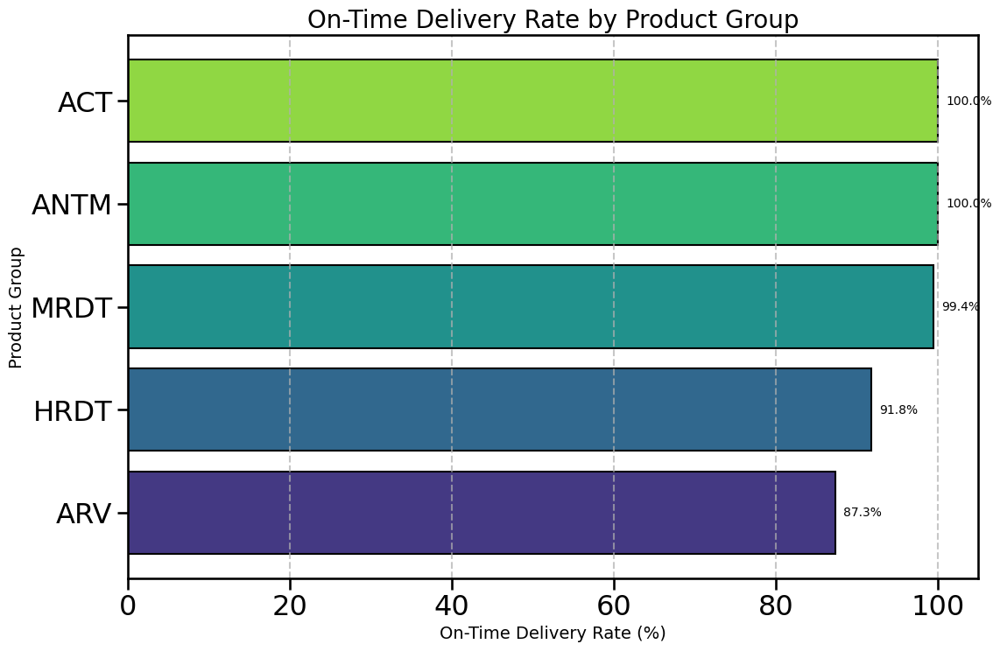

In [ ]:

# Calculate the on-time delivery rate by product group
on_time_by_product = df.groupby('Product Group')['on_time_delivery_rate'].mean() * 100

# Set the figure size
plt.figure(figsize=(12, 8))

# Sort values for better visualization
on_time_by_product = on_time_by_product.sort_values()

# Create a horizontal bar plot with a color palette
colors = sns.color_palette("viridis", len(on_time_by_product))  # Use a vibrant color palette
bars = plt.barh(on_time_by_product.index, on_time_by_product, color=colors, edgecolor='black')

# Add title and labels
plt.title('On-Time Delivery Rate by Product Group', fontsize=20)
plt.xlabel('On-Time Delivery Rate (%)', fontsize=14)
plt.ylabel('Product Group', fontsize=14)

# Add value labels on each bar
for bar in bars:
    plt.text(bar.get_width() + 1, bar.get_y() + bar.get_height() / 2,
             f'{bar.get_width():.1f}%',
             va='center', ha='left', fontsize=10)

# Add grid lines for better readability
plt.grid(axis='x', linestyle='--', alpha=0.7)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()


<ipython-input-76-02de5d5b9d21>:32: UserWarning:

Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.



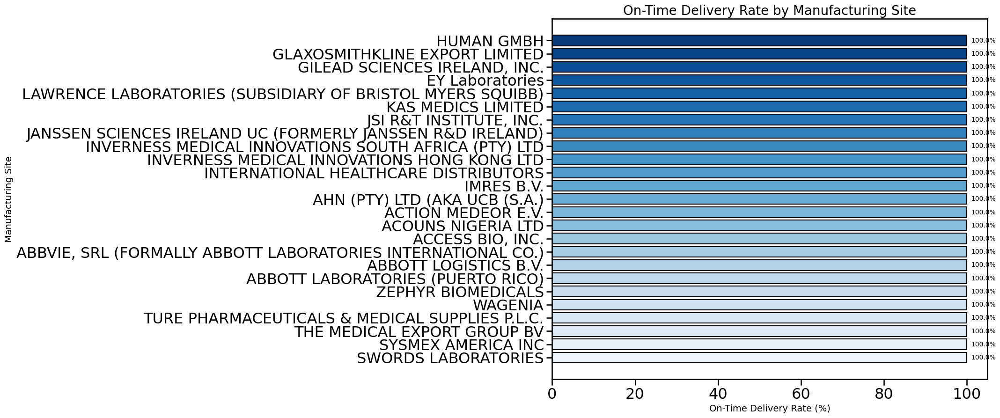

In [ ]:

# Calculate the on-time delivery rate by manufacturing site
on_time_by_site = df.groupby('Vendor')['on_time_delivery_rate'].mean() * 100

# Filter out sites with 100% on-time delivery rate
on_time_by_site = on_time_by_site[on_time_by_site <= 100]

# Sort values for better visualization
on_time_by_site = on_time_by_site.sort_values()

# Limit to top 15 sites for better readability
top_sites = on_time_by_site.nlargest(25)

# Set the figure size
plt.figure(figsize=(12, 10))

# Create a horizontal bar plot with a color palette
colors = sns.color_palette("Blues", len(top_sites))  # Use a blue color palette
bars = plt.barh(top_sites.index, top_sites, color=colors, edgecolor='black')

# Add title and labels
plt.title('On-Time Delivery Rate by Manufacturing Site', fontsize=20)
plt.xlabel('On-Time Delivery Rate (%)', fontsize=14)
plt.ylabel('Manufacturing Site', fontsize=14)

# Add value labels on each bar
for bar in bars:
    plt.text(bar.get_width() + 1, bar.get_y() + bar.get_height() / 2,
             f'{bar.get_width():.1f}%',
             va='center', ha='left', fontsize=10)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

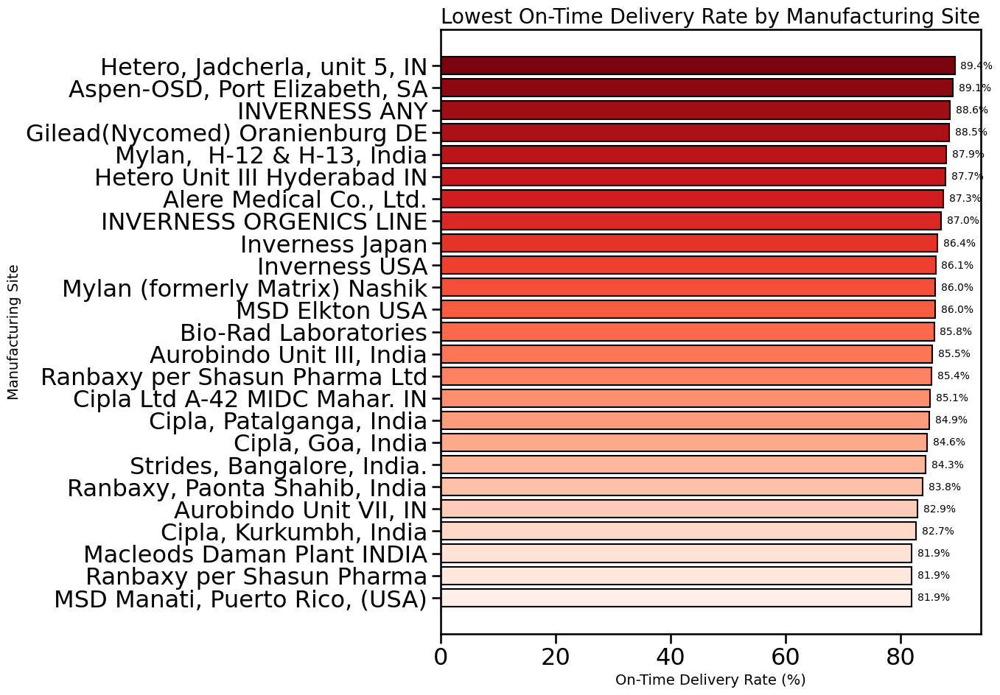

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Calculate the on-time delivery rate by manufacturing site
on_time_by_site = df.groupby('Manufacturing Site')['on_time_delivery_rate'].mean() * 100

# Filter out sites with 100% on-time delivery rate
on_time_by_site = on_time_by_site[on_time_by_site < 100]

# Sort values for better visualization (ascending order for lowest OTDR)
on_time_by_site = on_time_by_site.sort_values()

# Limit to the bottom 15 sites for better readability
lowest_sites = on_time_by_site.nsmallest(25)

# Set the figure size
plt.figure(figsize=(14, 10))

# Create a horizontal bar plot with a color palette
colors = sns.color_palette("Reds", len(lowest_sites))  # Use a red color palette for emphasis
bars = plt.barh(lowest_sites.index, lowest_sites, color=colors, edgecolor='black')

# Add title and labels
plt.title('Lowest On-Time Delivery Rate by Manufacturing Site', fontsize=20)
plt.xlabel('On-Time Delivery Rate (%)', fontsize=14)
plt.ylabel('Manufacturing Site', fontsize=14)

# Add value labels on each bar
for bar in bars:
    plt.text(bar.get_width() + 1, bar.get_y() + bar.get_height() / 2,
             f'{bar.get_width():.1f}%',
             va='center', ha='left', fontsize=10)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

                                               Vendor most_frequent_country  \
0                   ABBOTT LABORATORIES (PUERTO RICO)                Guyana   
1                               ABBOTT LOGISTICS B.V.             Guatemala   
2     ABBVIE LOGISTICS (FORMERLY ABBOTT LOGISTICS BV)               Vietnam   
3   ABBVIE, SRL (FORMALLY ABBOTT LABORATORIES INTE...    Dominican Republic   
4                                    ACCESS BIO, INC.                 Haiti   
..                                                ...                   ...   
67                        THE MEDICAL EXPORT GROUP BV                 Haiti   
68     TURE PHARMACEUTICALS & MEDICAL SUPPLIES P.L.C.              Ethiopia   
69                               Trinity Biotech, Plc            Congo, DRC   
70                                            WAGENIA            Congo, DRC   
71                                 ZEPHYR BIOMEDICALS                Guyana   

   most_frequent_product_group most_frequent_sub_cl

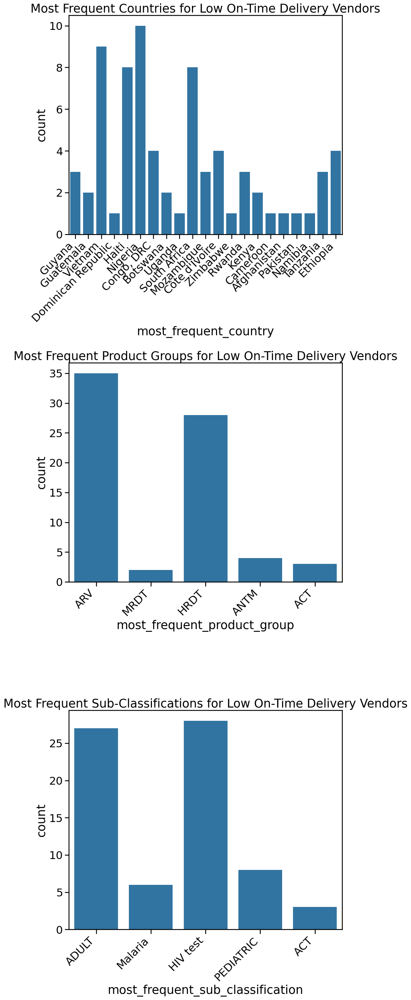

In [ ]:
low_delivery_vendors = df[df['on_time_delivery_rate'] < 90] # Adjust the threshold as needed

# Group by vendor and get the most frequent country, product group, and sub classification
low_delivery_summary = low_delivery_vendors.groupby('Vendor').agg(
    most_frequent_country=('Country', lambda x: x.mode()[0] if not x.mode().empty else 'Unknown'),
    most_frequent_product_group=('Product Group', lambda x: x.mode()[0] if not x.mode().empty else 'Unknown'),
    most_frequent_sub_classification=('Sub Classification', lambda x: x.mode()[0] if not x.mode().empty else 'Unknown')
).reset_index()

# Display the summary table
print(low_delivery_summary)

# Create a bar plot for visualization
plt.figure(figsize=(10, 30))  # Adjust figure size as needed

# Plot most frequent countries
plt.subplot(3, 1, 1)  # 3 rows, 1 column, first subplot
sns.countplot(x='most_frequent_country', data=low_delivery_summary)
plt.title('Most Frequent Countries for Low On-Time Delivery Vendors')
plt.xticks(rotation=45, ha='right')


# Plot most frequent product groups
plt.subplot(3, 1, 2)  # 3 rows, 1 column, second subplot
sns.countplot(x='most_frequent_product_group', data=low_delivery_summary)
plt.title('Most Frequent Product Groups for Low On-Time Delivery Vendors')
plt.xticks(rotation=45, ha='right')

# Plot most frequent sub-classifications
plt.subplot(3, 1, 3)  # 3 rows, 1 column, third subplot
sns.countplot(x='most_frequent_sub_classification', data=low_delivery_summary)
plt.title('Most Frequent Sub-Classifications for Low On-Time Delivery Vendors')
plt.xticks(rotation=45, ha='right')

plt.tight_layout()  # Adjust layout to prevent overlapping
plt.show()

                                               Vendor most_frequent_country  \
0                   ABBOTT LABORATORIES (PUERTO RICO)                Guyana   
1                               ABBOTT LOGISTICS B.V.             Guatemala   
2     ABBVIE LOGISTICS (FORMERLY ABBOTT LOGISTICS BV)               Vietnam   
3   ABBVIE, SRL (FORMALLY ABBOTT LABORATORIES INTE...    Dominican Republic   
4                                    ACCESS BIO, INC.                 Haiti   
..                                                ...                   ...   
67                        THE MEDICAL EXPORT GROUP BV                 Haiti   
68     TURE PHARMACEUTICALS & MEDICAL SUPPLIES P.L.C.              Ethiopia   
69                               Trinity Biotech, Plc            Congo, DRC   
70                                            WAGENIA            Congo, DRC   
71                                 ZEPHYR BIOMEDICALS                Guyana   

   most_frequent_product_group most_frequent_sub_cl

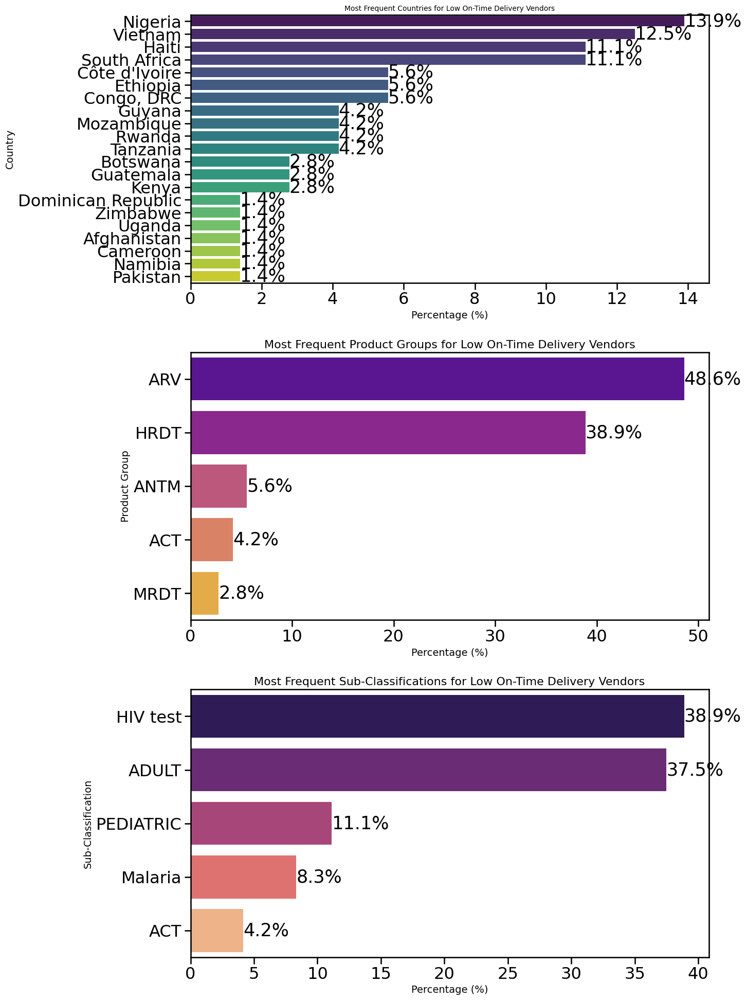

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Filter for vendors with low on-time delivery rates
low_delivery_vendors = df[df['on_time_delivery_rate'] < 90]  # Adjust the threshold as needed

# Group by vendor and get the most frequent country, product group, and sub-classification
low_delivery_summary = low_delivery_vendors.groupby('Vendor').agg(
    most_frequent_country=('Country', lambda x: x.mode()[0] if not x.mode().empty else 'Unknown'),
    most_frequent_product_group=('Product Group', lambda x: x.mode()[0] if not x.mode().empty else 'Unknown'),
    most_frequent_sub_classification=('Sub Classification', lambda x: x.mode()[0] if not x.mode().empty else 'Unknown')
).reset_index()

# Display the summary table
print(low_delivery_summary)

# Create a bar plot for visualization
plt.figure(figsize=(15, 20))  # Adjust figure size as needed

# Plot most frequent countries
plt.subplot(3, 1, 1)  # 3 rows, 1 column, first subplot
country_counts = low_delivery_summary['most_frequent_country'].value_counts()
total_countries = country_counts.sum()
country_percentages = (country_counts / total_countries) * 100

bar_plot_countries = sns.barplot(x=country_percentages.values, y=country_percentages.index, palette='viridis')
plt.title('Most Frequent Countries for Low On-Time Delivery Vendors', fontsize=10)
plt.xlabel('Percentage (%)', fontsize=14)
plt.ylabel('Country', fontsize=14)

# Add percentage labels on each bar
for index, value in enumerate(country_percentages.values):
    bar_plot_countries.text(value, index, f"{value:.1f}%", color='black', va='center')

# Plot most frequent product groups
plt.subplot(3, 1, 2)  # 3 rows, 1 column, second subplot
product_group_counts = low_delivery_summary['most_frequent_product_group'].value_counts()
total_product_groups = product_group_counts.sum()
product_group_percentages = (product_group_counts / total_product_groups) * 100

bar_plot_products = sns.barplot(x=product_group_percentages.values, y=product_group_percentages.index, palette='plasma')
plt.title('Most Frequent Product Groups for Low On-Time Delivery Vendors', fontsize=16)
plt.xlabel('Percentage (%)', fontsize=14)
plt.ylabel('Product Group', fontsize=14)

# Add percentage labels on each bar
for index, value in enumerate(product_group_percentages.values):
    bar_plot_products.text(value, index, f"{value:.1f}%", color='black', va='center')

# Plot most frequent sub-classifications
plt.subplot(3, 1, 3)  # 3 rows, 1 column, third subplot
sub_classification_counts = low_delivery_summary['most_frequent_sub_classification'].value_counts()
total_sub_classifications = sub_classification_counts.sum()
sub_classification_percentages = (sub_classification_counts / total_sub_classifications) * 100

bar_plot_sub_classes = sns.barplot(x=sub_classification_percentages.values, y=sub_classification_percentages.index, palette='magma')
plt.title('Most Frequent Sub-Classifications for Low On-Time Delivery Vendors', fontsize=16)
plt.xlabel('Percentage (%)', fontsize=14)
plt.ylabel('Sub-Classification', fontsize=14)

# Add percentage labels on each bar
for index, value in enumerate(sub_classification_percentages.values):
    bar_plot_sub_classes.text(value, index, f"{value:.1f}%", color='black', va='center')

plt.tight_layout()  # Adjust layout to prevent overlapping
plt.show()

In [ ]:
print(df['Country'].unique())

["Côte d'Ivoire" 'Vietnam' 'Nigeria' 'Zambia' 'Tanzania' 'Rwanda' 'Haiti'
 'Zimbabwe' 'Ethiopia' 'Guyana' 'Namibia' 'South Africa' 'Botswana'
 'Mozambique' 'Kenya' 'Kazakhstan' 'Uganda' 'Kyrgyzstan' 'Senegal' 'Benin'
 'Lesotho' 'Pakistan' 'Swaziland' 'Ghana' 'Angola' 'Lebanon'
 'Sierra Leone' 'Cameroon' 'South Sudan' 'Burundi' 'Dominican Republic'
 'Malawi' 'Congo, DRC' 'Sudan' 'Mali' 'Guatemala' 'Togo' 'Afghanistan'
 'Liberia' 'Burkina Faso' 'Guinea' 'Libya' 'Belize']


In [ ]:
country_to_continent = {
    "Côte d'Ivoire": 'Africa',
    'Vietnam': 'Asia',
    'Nigeria': 'Africa',
    'Zambia': 'Africa',
    'Tanzania': 'Africa',
    'Rwanda': 'Africa',
    'Haiti': 'North America',
    'Zimbabwe': 'Africa',
    'Ethiopia': 'Africa',
    'Guyana': 'South America',
    'Namibia': 'Africa',
    'South Africa': 'Africa',
    'Botswana': 'Africa',
    'Mozambique': 'Africa',
    'Kenya': 'Africa',
    'Kazakhstan': 'Asia',
    'Uganda': 'Africa',
    'Kyrgyzstan': 'Asia',
    'Senegal': 'Africa',
    'Benin': 'Africa',
    'Lesotho': 'Africa',
    'Pakistan': 'Asia',
    'Swaziland': 'Africa',
    'Ghana': 'Africa',
    'Angola': 'Africa',
    'Lebanon': 'Asia',
    'Sierra Leone': 'Africa',
    'Cameroon': 'Africa',
    'South Sudan': 'Africa',
    'Burundi': 'Africa',
    'Dominican Republic': 'North America',
    'Malawi': 'Africa',
    'Congo, DRC': 'Africa',
    'Sudan': 'Africa',
    'Mali': 'Africa',
    'Guatemala': 'North America',
    'Togo': 'Africa',
    'Afghanistan': 'Asia',
    'Liberia': 'Africa',
    'Burkina Faso': 'Africa',
    'Guinea': 'Africa',
    'Libya': 'Africa',
    'Belize': 'North America'
}
from collections import defaultdict

# Create a defaultdict to group countries by continent
continent_groups = defaultdict(list)

# Populate the continent_groups dictionary
for country, continent in country_to_continent.items():
    continent_groups[continent].append(country)

# Display the grouped countries by continent
for continent, countries in continent_groups.items():
    print(f"{continent}: {', '.join(countries)}")

Africa: Côte d'Ivoire, Nigeria, Zambia, Tanzania, Rwanda, Zimbabwe, Ethiopia, Namibia, South Africa, Botswana, Mozambique, Kenya, Uganda, Senegal, Benin, Lesotho, Swaziland, Ghana, Angola, Sierra Leone, Cameroon, South Sudan, Burundi, Malawi, Congo, DRC, Sudan, Mali, Togo, Liberia, Burkina Faso, Guinea, Libya
Asia: Vietnam, Kazakhstan, Kyrgyzstan, Pakistan, Lebanon, Afghanistan
North America: Haiti, Dominican Republic, Guatemala, Belize
South America: Guyana


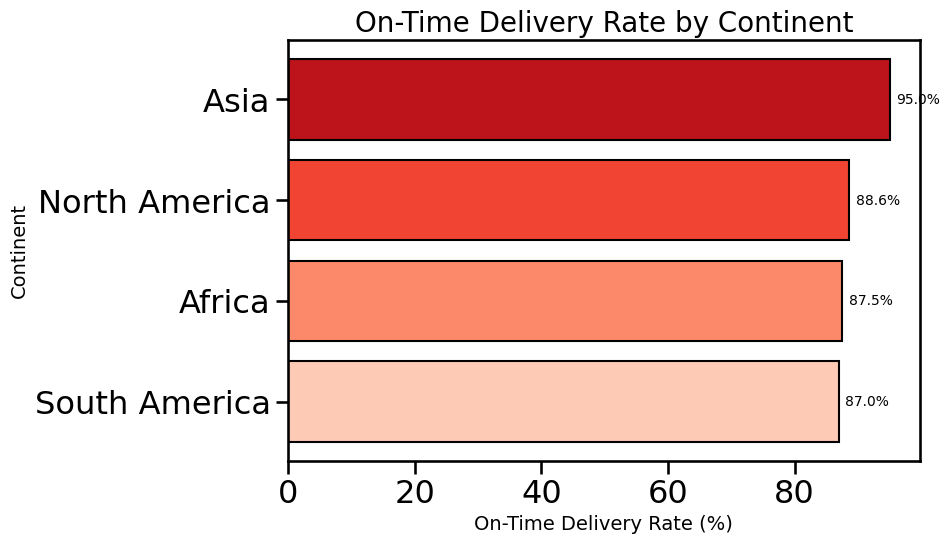

In [ ]:

# Map countries to continents in your DataFrame
df['Continent'] = df['Country'].map(country_to_continent)

# Calculate the average on-time delivery rate per continent
on_time_by_continent = df.groupby('Continent')['on_time_delivery_rate'].mean() * 100

# Sort continents by on-time delivery rate (ascending order for lowest OTDR)
on_time_by_continent = on_time_by_continent.sort_values()

# Set the figure size
plt.figure(figsize=(10, 6))

# Create a horizontal bar plot with a color palette
colors = sns.color_palette("Reds", len(on_time_by_continent))  # Use a red color palette for emphasis
bars = plt.barh(on_time_by_continent.index, on_time_by_continent, color=colors, edgecolor='black')

# Add title and labels
plt.title('On-Time Delivery Rate by Continent', fontsize=20)
plt.xlabel('On-Time Delivery Rate (%)', fontsize=14)
plt.ylabel('Continent', fontsize=14)

# Add value labels on each bar
for bar in bars:
    plt.text(bar.get_width() + 1, bar.get_y() + bar.get_height() / 2,
             f'{bar.get_width():.1f}%',
             va='center', ha='left', fontsize=10)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

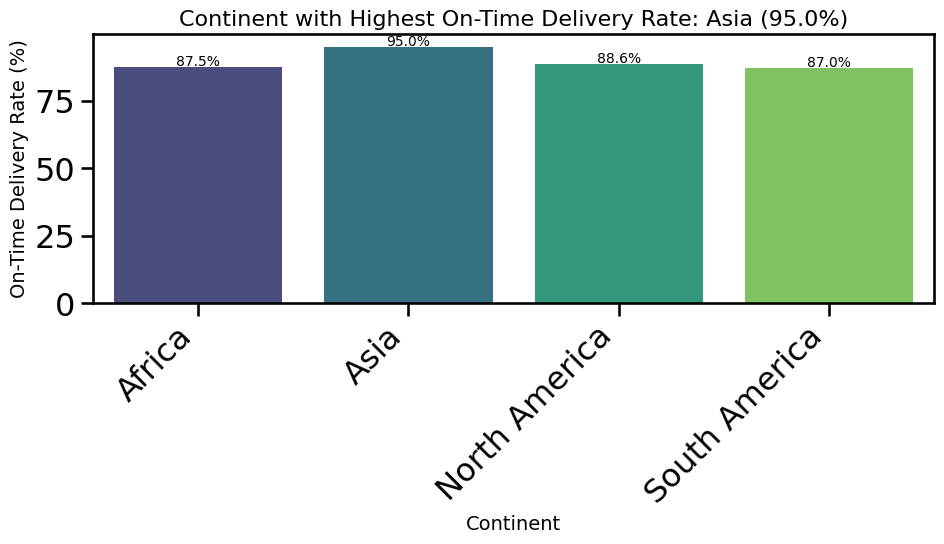

In [ ]:
# Map countries to continents in your DataFrame
df['Continent'] = df['Country'].map(country_to_continent)

# Calculate the average on-time delivery rate per continent
on_time_by_continent = df.groupby('Continent')['on_time_delivery_rate'].mean() * 100

# Find the continent with the highest on-time delivery rate
continent_highest_on_time = on_time_by_continent.idxmax()
highest_on_time_rate = on_time_by_continent.max()

# Create the plot
plt.figure(figsize=(10, 6))
sns.barplot(x=on_time_by_continent.index, y=on_time_by_continent.values, palette='viridis')
plt.title(f'Continent with Highest On-Time Delivery Rate: {continent_highest_on_time} ({highest_on_time_rate:.1f}%)', fontsize=16)
plt.xlabel('Continent', fontsize=14)
plt.ylabel('On-Time Delivery Rate (%)', fontsize=14)
plt.xticks(rotation=45, ha='right')

# Add value labels on each bar
for i, v in enumerate(on_time_by_continent.values):
    plt.text(i, v + 0.5, f'{v:.1f}%', ha='center', fontsize=10) # Adjusted vertical position

plt.tight_layout()
plt.show()

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9964 entries, 0 to 9963
Data columns (total 41 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        --------------  -----         
 0   ID                            9964 non-null   int64         
 1   Project Code                  9964 non-null   object        
 2   PQ #                          9964 non-null   object        
 3   PO / SO #                     9964 non-null   object        
 4   ASN/DN #                      9964 non-null   object        
 5   Country                       9964 non-null   object        
 6   Managed By                    9964 non-null   object        
 7   Fulfill Via                   9964 non-null   object        
 8   Vendor INCO Term              9964 non-null   object        
 9   Shipment Mode                 9964 non-null   object        
 10  PQ First Sent to Client Date  9964 non-null   datetime64[ns]
 11  PO Sent to Vendor Date        

Text(0, 0.5, 'Vendor')

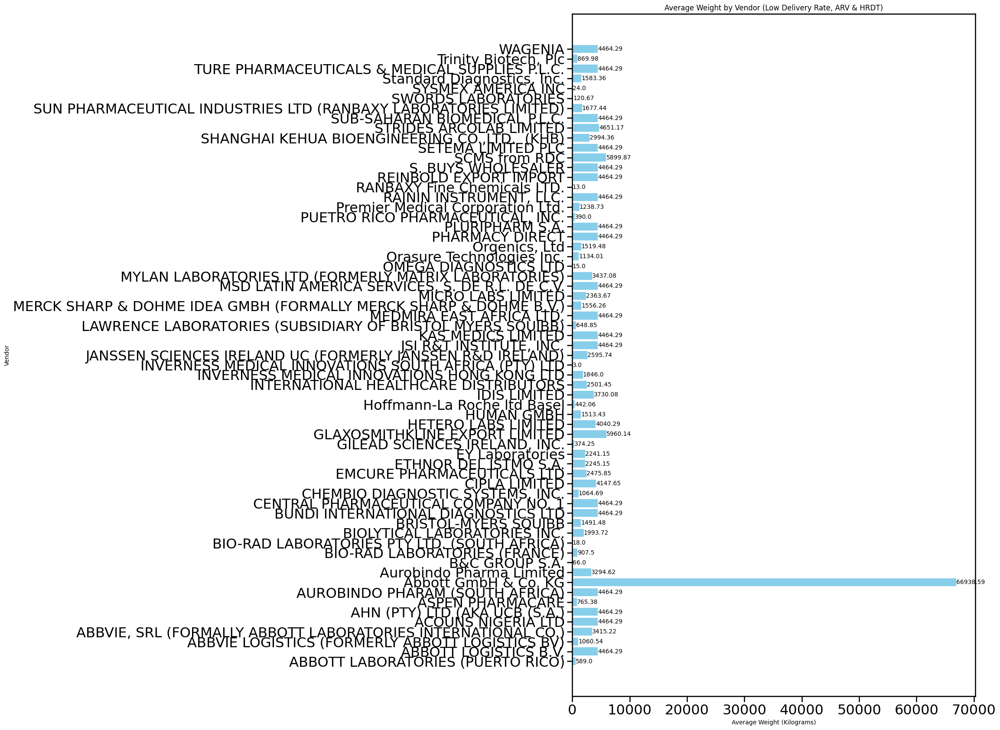

In [ ]:
# Filter for Product Groups ARV and HRDT with low delivery rates
low_delivery_arv_hrdt = df[(df['Product Group'].isin(['ARV', 'HRDT'])) & (df['on_time_delivery_rate'] < 90)]

# Group by vendor and get the average weight and delivery delay
summary = low_delivery_arv_hrdt.groupby('Vendor').agg(
    average_weight=('Weight (Kilograms)', 'mean'),
    average_delay=('Delivery Delay', 'mean')
).reset_index()

# Create the bar plot
plt.figure(figsize=(12, 45))  # Adjusted figure size for better visibility

# Plot average weight
plt.subplot(2, 1, 1)
bars = plt.barh(summary['Vendor'], summary['average_weight'], color='skyblue')
for bar in bars:
    yval = bar.get_width()
    plt.text(yval, bar.get_y() + bar.get_height()/2, round(yval, 2), ha='left', va='center', fontsize=10)  # Smaller font size
plt.title('Average Weight by Vendor (Low Delivery Rate, ARV & HRDT)', fontsize=12)  # Smaller title font size
plt.xlabel('Average Weight (Kilograms)', fontsize=10)  # Smaller label font size
plt.ylabel('Vendor', fontsize=10)  # Smaller label font size


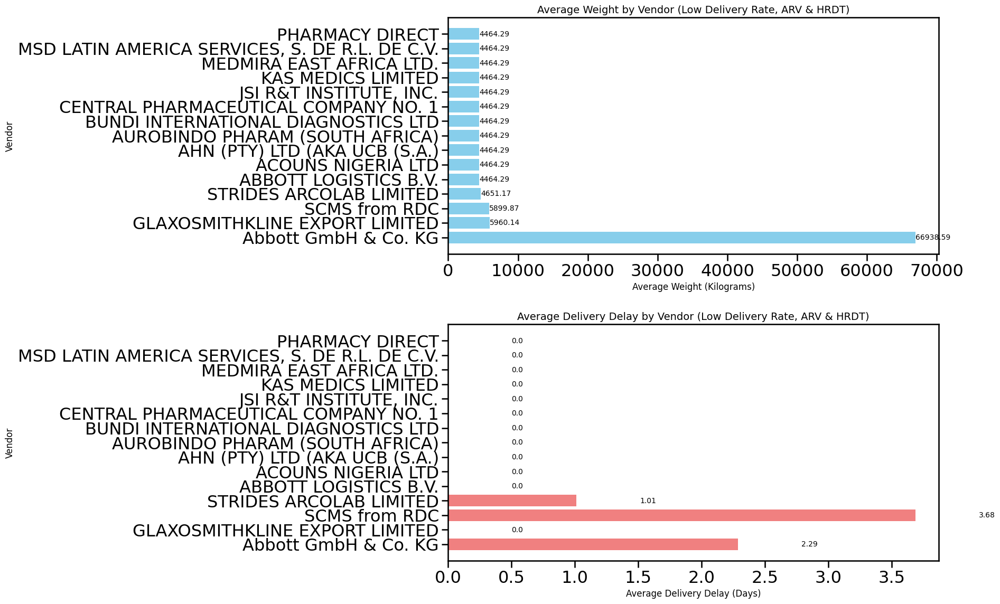

In [ ]:
# Filter for Product Groups ARV and HRDT with low delivery rates
low_delivery_arv_hrdt = df[(df['Product Group'].isin(['ARV', 'HRDT'])) & (df['on_time_delivery_rate'] < 90)]

# Group by vendor and get the average weight and delivery delay
summary = low_delivery_arv_hrdt.groupby('Vendor').agg(
    average_weight=('Weight (Kilograms)', 'mean'),
    average_delay=('Delivery Delay', 'mean')
).reset_index()

# Limit to top 15 vendors based on average weight for better readability
top_vendors = summary.nlargest(15, 'average_weight')

# Create the bar plot
plt.figure(figsize=(20, 12))  # Adjusted figure size for better visibility

# Plot average weight
plt.subplot(2, 1, 1)
bars = plt.barh(top_vendors['Vendor'], top_vendors['average_weight'], color='skyblue')
for bar in bars:
    yval = bar.get_width()
    plt.text(yval + 0.5, bar.get_y() + bar.get_height()/2, round(yval, 2), ha='left', va='center', fontsize=10)  # Smaller font size
plt.title('Average Weight by Vendor (Low Delivery Rate, ARV & HRDT)', fontsize=14)  # Adjusted title font size
plt.xlabel('Average Weight (Kilograms)', fontsize=12)  # Adjusted label font size
plt.ylabel('Vendor', fontsize=12)  # Adjusted label font size

# Plot average delivery delay
plt.subplot(2, 1, 2)
bars_delay = plt.barh(top_vendors['Vendor'], top_vendors['average_delay'], color='lightcoral')
for bar in bars_delay:
    yval = bar.get_width()
    plt.text(yval + 0.5, bar.get_y() + bar.get_height()/2, round(yval, 2), ha='left', va='center', fontsize=10)  # Smaller font size
plt.title('Average Delivery Delay by Vendor (Low Delivery Rate, ARV & HRDT)', fontsize=14)  # Adjusted title font size
plt.xlabel('Average Delivery Delay (Days)', fontsize=12)  # Adjusted label font size
plt.ylabel('Vendor', fontsize=12)  # Adjusted label font size

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()


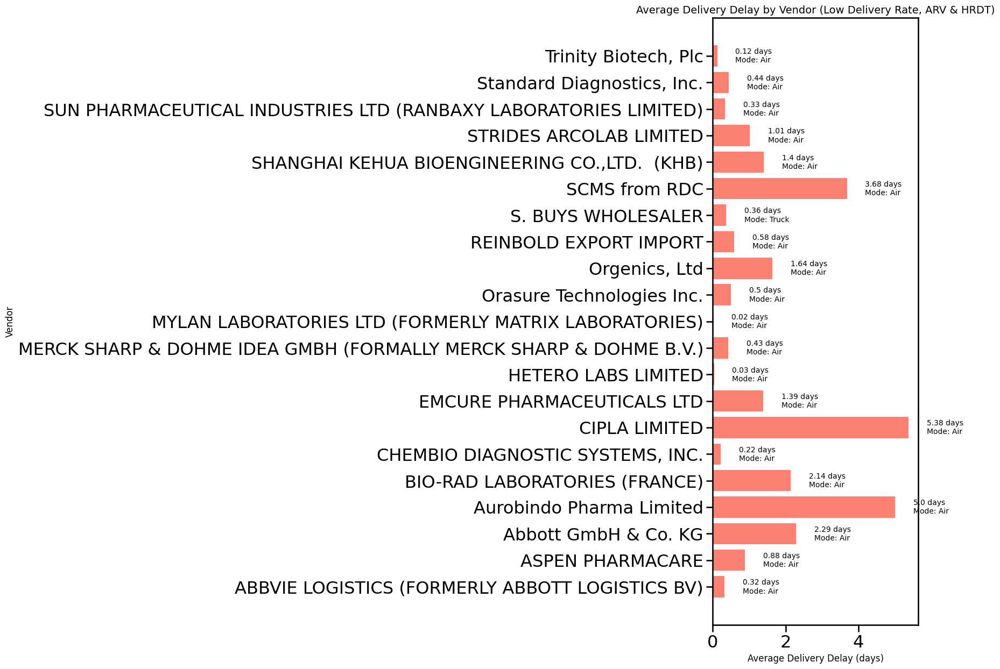

In [ ]:
# Filter for Product Groups ARV and HRDT with low delivery rates
low_delivery_arv_hrdt = df[(df['Product Group'].isin(['ARV', 'HRDT'])) & (df['on_time_delivery_rate'] < 90)]

# Group by vendor and get the average delivery delay and shipment mode
summary = low_delivery_arv_hrdt.groupby('Vendor').agg(
    average_delay=('Delivery Delay', 'mean'),
    shipment_mode=('Shipment Mode', lambda x: x.mode()[0])  # Get the most common shipment mode
).reset_index()

# Filter out vendors with no delays
summary = summary[summary['average_delay'] > 0]

# Create the bar plot
plt.figure(figsize=(19, 13))  # Adjusted figure size for better visibility

# Plot average delay
bars = plt.barh(summary['Vendor'], summary['average_delay'], color='salmon')

# Iterate through the bars and corresponding data in 'summary'
for bar, (vendor, delay, mode) in zip(bars, summary[['Vendor', 'average_delay', 'shipment_mode']].itertuples(index=False)):
    yval = bar.get_width()
    plt.text(yval + 0.5, bar.get_y() + bar.get_height()/2,
             f"{round(yval, 2)} days\nMode: {mode}",  # Use 'mode' directly
             ha='left', va='center', fontsize=10)  # Add value and shipment mode on the bars

plt.title('Average Delivery Delay by Vendor (Low Delivery Rate, ARV & HRDT)', fontsize=14)  # Title font size
plt.xlabel('Average Delivery Delay (days)', fontsize=12)  # Label font size
plt.ylabel('Vendor', fontsize=12)  # Label font size

plt.tight_layout()
plt.show()

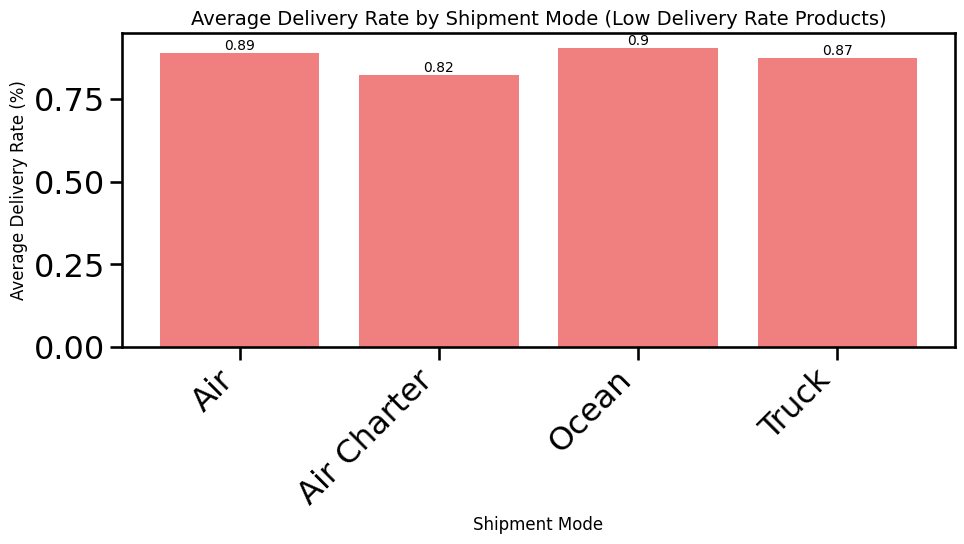

In [ ]:
# Filter for products with low delivery rates (assuming < 90% is considered low)
low_delivery_products = df[df['on_time_delivery_rate'] < 90]

# Group by Shipment Mode and calculate the average delivery rate
average_delivery_by_mode = low_delivery_products.groupby('Shipment Mode').agg(
    average_delivery_rate=('on_time_delivery_rate', 'mean')
).reset_index()

# Create the bar plot
plt.figure(figsize=(10, 6))

bars = plt.bar(average_delivery_by_mode['Shipment Mode'], average_delivery_by_mode['average_delivery_rate'], color='lightcoral')
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, round(yval, 2), ha='center', va='bottom', fontsize=10)  # Add value on top of bars

plt.title('Average Delivery Rate by Shipment Mode (Low Delivery Rate Products)', fontsize=14)
plt.xlabel('Shipment Mode', fontsize=12)
plt.ylabel('Average Delivery Rate (%)', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


Top Vendors and Product Groups Contributing to Delays:
                                  Vendor Product Group  Delay_Count
61                         SCMS from RDC           ARV         4958
51                         Orgenics, Ltd          HRDT          754
60                    S. BUYS WHOLESALER           ARV          707
12              Aurobindo Pharma Limited           ARV          668
74                  Trinity Biotech, Plc          HRDT          356
..                                   ...           ...          ...
19  CENTRAL PHARMACEUTICAL COMPANY NO. 1           ARV            1
56      Premier Medical Corporation Ltd.          MRDT            1
57               RAININ INSTRUMENT, LLC.           ARV            1
63                    SETEMA LIMITED PLC          HRDT            1
0      ABBOTT LABORATORIES (PUERTO RICO)           ARV            1

[77 rows x 3 columns]


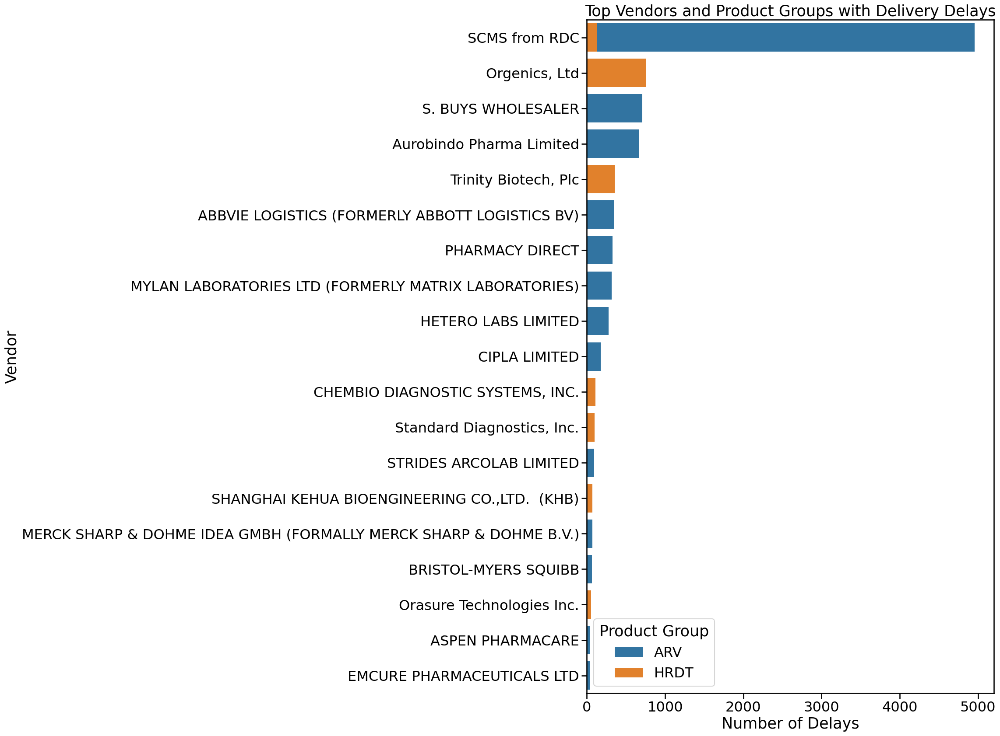

In [ ]:

# Focus on vendors with low delivery rates
low_delivery_vendors = df[df['on_time_delivery_rate'] < 90]

# Group by vendor and product group, then count occurrences
vendor_product_delays = low_delivery_vendors.groupby(['Vendor', 'Product Group']).size().reset_index(name='Delay_Count')

# Sort by delay count to identify top contributors
top_delay_contributors = vendor_product_delays.sort_values('Delay_Count', ascending=False)

print("\nTop Vendors and Product Groups Contributing to Delays:")
print(top_delay_contributors)

# Visualization of top contributors
plt.figure(figsize=(12, 20))
sns.barplot(x='Delay_Count', y='Vendor', hue='Product Group', data=top_delay_contributors.head(20), dodge=False)  # Show top 20
plt.title('Top Vendors and Product Groups with Delivery Delays')
plt.xlabel('Number of Delays')
plt.ylabel('Vendor')
plt.show()

In [ ]:
df['Scheduled Delivery Date'] = pd.to_datetime(df['Scheduled Delivery Date'])
df['Delivered to Client Date'] = pd.to_datetime(df['Delivered to Client Date'])

# Calculate delivery delay
df['Delivery Delay'] = (df['Delivered to Client Date'] - df['Scheduled Delivery Date']).dt.days

# Create a 'Month' column for grouping
df['Month'] = df['Scheduled Delivery Date'].dt.to_period('M').dt.to_timestamp()

# Calculate average delivery delay per month
monthly_delays = df.groupby('Month')['Delivery Delay'].mean().reset_index()


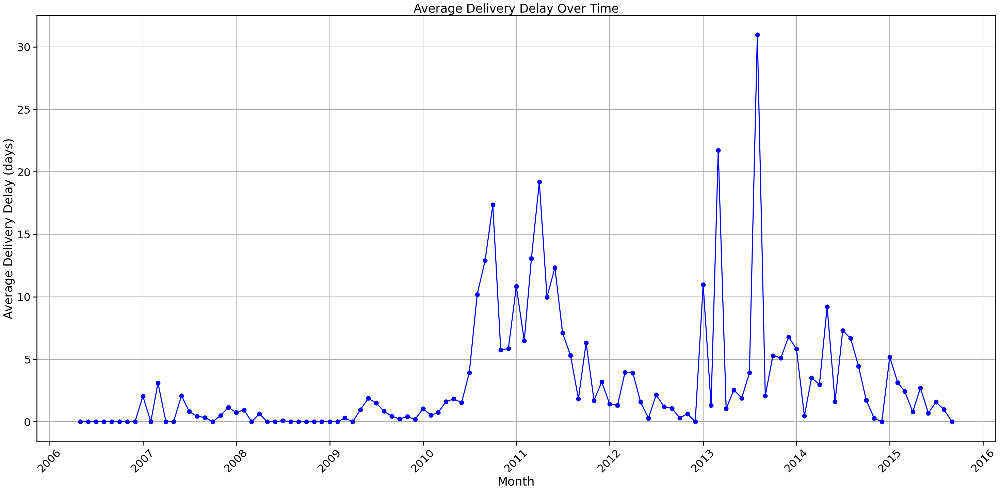

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming 'df' is your DataFrame
# Ensure the 'Month' column is in datetime f
# Filter out negative delivery delays
df = df[df['Delivery Delay'] >= 0]

# Calculate average delivery delay per month
monthly_delays = df.groupby('Month')['Delivery Delay'].mean().reset_index()

# Create the time series plot
plt.figure(figsize=(30, 15))
plt.plot(monthly_delays['Month'], monthly_delays['Delivery Delay'], marker='o', color='blue')

# Set x-axis labels
plt.xlabel('Month')
plt.ylabel('Average Delivery Delay (days)')
plt.title('Average Delivery Delay Over Time')
plt.xticks(rotation=45)
plt.grid(visible=True)  # Add grid lines for better readability
plt.tight_layout()
plt.show()


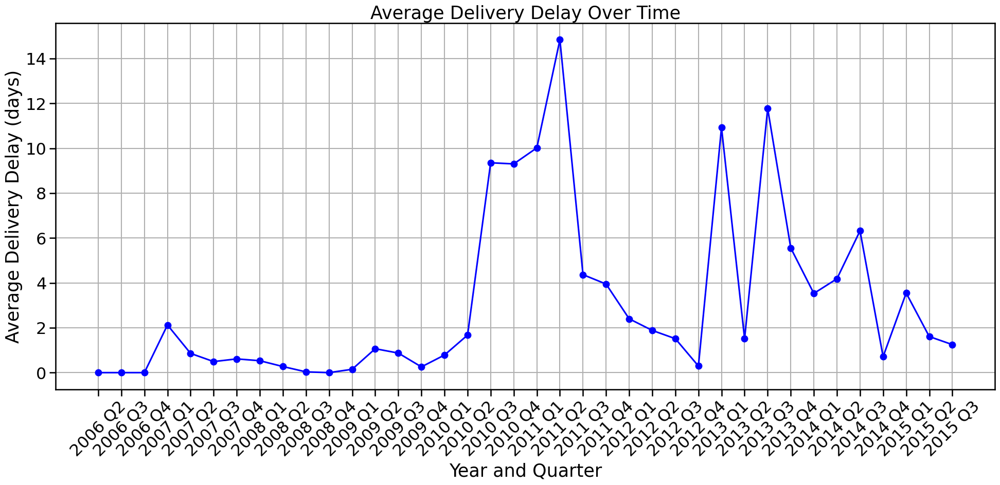

In [ ]:
# Convert date columns to datetime if they aren't already
df['Scheduled Delivery Date'] = pd.to_datetime(df['Scheduled Delivery Date'])
df['Delivered to Client Date'] = pd.to_datetime(df['Delivered to Client Date'])

# Calculate delivery delay
df['Delivery Delay'] = (df['Delivered to Client Date'] - df['Scheduled Delivery Date']).dt.days

# Filter out negative delivery delays
df = df[df['Delivery Delay'] >= 0]

# Create a 'Year' and 'Quarter' column for grouping
df['Year'] = df['Scheduled Delivery Date'].dt.year
df['Quarter'] = df['Scheduled Delivery Date'].dt.quarter

# Combine Year and Quarter for better labeling
df['Year_Quarter'] = df['Year'].astype(str) + ' Q' + df['Quarter'].astype(str)

# Calculate average delivery delay per year and quarter
quarterly_delays = df.groupby('Year_Quarter')['Delivery Delay'].mean().reset_index()

# Create the time series plot
plt.figure(figsize=(20, 10))
plt.plot(quarterly_delays['Year_Quarter'], quarterly_delays['Delivery Delay'], marker='o', color='blue')

# Set x-axis labels
plt.xticks(rotation=45)
plt.xlabel('Year and Quarter')
plt.ylabel('Average Delivery Delay (days)')
plt.title('Average Delivery Delay Over Time')
plt.grid(visible=True)  # Add grid lines for better readability
plt.tight_layout()
plt.show()


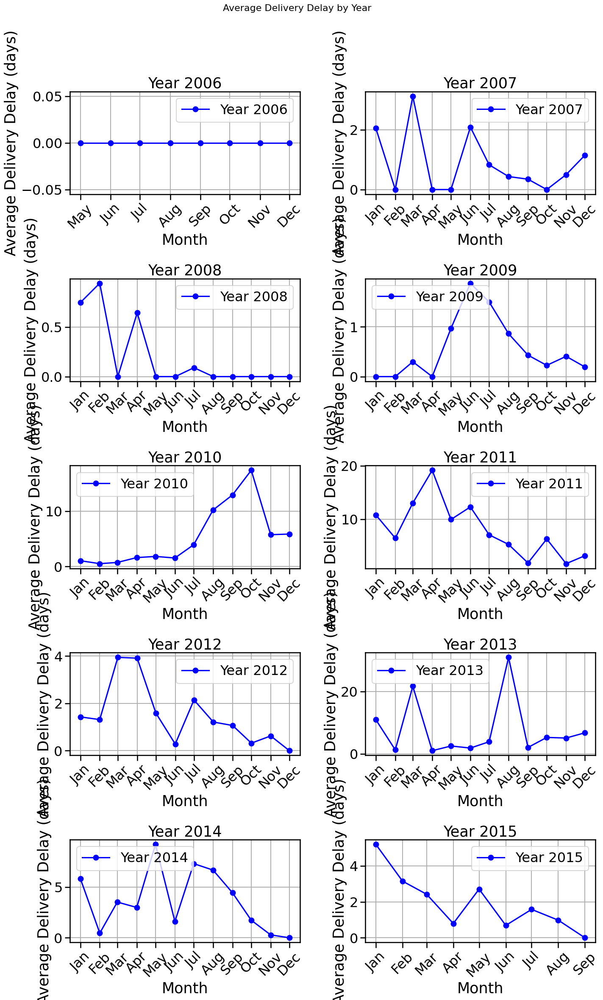

In [ ]:
# Ensure the 'Month' column is in datetime format
df['Month'] = pd.to_datetime(df['Month'])

# Filter out negative delivery delays
df = df[df['Delivery Delay'] >= 0]

# Calculate average delivery delay per month
monthly_delays = df.groupby(['Year', 'Month'])['Delivery Delay'].mean().reset_index()

# Set up the figure and axes
years = monthly_delays['Year'].unique()
num_years = len(years)
cols = 2  # Number of columns for subplots
rows = (num_years + cols - 1) // cols  # Calculate number of rows needed

fig, axs = plt.subplots(rows, cols, figsize=(15, 5 * rows))
fig.suptitle('Average Delivery Delay by Year', fontsize=16)

# Loop through the years and plot
for i, year in enumerate(years):
    ax = axs[i // cols, i % cols]  # Determine the subplot position
    year_data = monthly_delays[monthly_delays['Year'] == year]
    ax.plot(year_data['Month'], year_data['Delivery Delay'], marker='o', label=f'Year {year}', color='blue')

    ax.set_title(f'Year {year}')
    ax.set_xlabel('Month')
    ax.set_ylabel('Average Delivery Delay (days)')
    ax.set_xticks(year_data['Month'])
    ax.set_xticklabels(year_data['Month'].dt.strftime('%b'), rotation=45)  # Show month names
    ax.grid()
    ax.legend()

# Adjust layout
plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust the layout to make room for the title
plt.show()


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7177 entries, 0 to 9960
Data columns (total 45 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        --------------  -----         
 0   ID                            7177 non-null   int64         
 1   Project Code                  7177 non-null   object        
 2   PQ #                          7177 non-null   object        
 3   PO / SO #                     7177 non-null   object        
 4   ASN/DN #                      7177 non-null   object        
 5   Country                       7177 non-null   object        
 6   Managed By                    7177 non-null   object        
 7   Fulfill Via                   7177 non-null   object        
 8   Vendor INCO Term              7177 non-null   object        
 9   Shipment Mode                 7177 non-null   object        
 10  PQ First Sent to Client Date  7177 non-null   datetime64[ns]
 11  PO Sent to Vendor Date        7177 

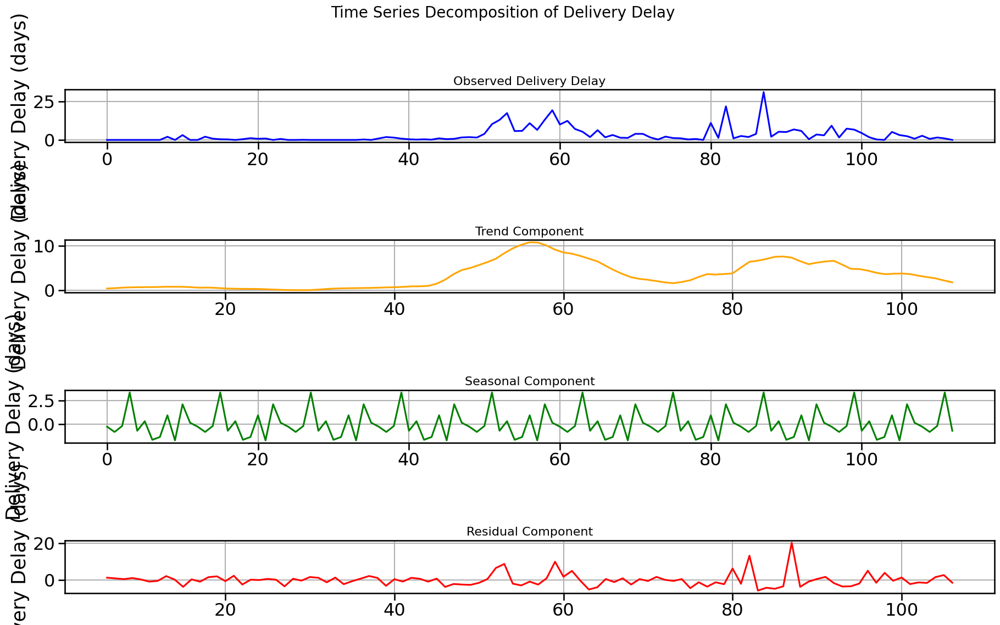

In [ ]:

from statsmodels.tsa.seasonal import seasonal_decompose

# Perform seasonal decomposition
result = seasonal_decompose(monthly_delays['Delivery Delay'], model='additive', period=12)  # Adjust period if needed

# Create a custom plot for each component
plt.figure(figsize=(20, 12))  # Increased height for better spacing

# Plot observed
plt.subplot(4, 1, 1)
plt.plot(result.observed, color='blue')
plt.title('Observed Delivery Delay', fontsize=16)
plt.ylabel('Delivery Delay (days)')
plt.grid()

# Plot trend
plt.subplot(4, 1, 2)
plt.plot(result.trend, color='orange')
plt.title('Trend Component', fontsize=16)
plt.ylabel('Delivery Delay (days)')
plt.grid()

# Plot seasonal
plt.subplot(4, 1, 3)
plt.plot(result.seasonal, color='green')
plt.title('Seasonal Component', fontsize=16)
plt.ylabel('Delivery Delay (days)')
plt.grid()

# Plot residual
plt.subplot(4, 1, 4)
plt.plot(result.resid, color='red')
plt.title('Residual Component', fontsize=16)
plt.ylabel('Delivery Delay (days)')
plt.grid()

# Adjust layout
plt.tight_layout(pad=3.0)  # Add padding between subplots
plt.suptitle('Time Series Decomposition of Delivery Delay', fontsize=20, y=1.02)  # Adjust title position
plt.show()


In [ ]:
# Identify underperforming vendors (e.g., below a certain on-time delivery rate)
underperforming_vendors = (df['on_time_delivery_rate'] < 0.9) # Example threshold: 90%
print("\nUnderperforming Vendors:")
underperforming_vendors


Underperforming Vendors:


,on_time_delivery_rate
0,False
1,True
2,False
3,True
4,True
...,...
9945,True
9946,True
9947,True
9953,True


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7177 entries, 0 to 9960
Data columns (total 45 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        --------------  -----         
 0   ID                            7177 non-null   int64         
 1   Project Code                  7177 non-null   object        
 2   PQ #                          7177 non-null   object        
 3   PO / SO #                     7177 non-null   object        
 4   ASN/DN #                      7177 non-null   object        
 5   Country                       7177 non-null   object        
 6   Managed By                    7177 non-null   object        
 7   Fulfill Via                   7177 non-null   object        
 8   Vendor INCO Term              7177 non-null   object        
 9   Shipment Mode                 7177 non-null   object        
 10  PQ First Sent to Client Date  7177 non-null   datetime64[ns]
 11  PO Sent to Vendor Date        7177 

In [ ]:
df['on_time_delivery_rate'].value_counts()

,count
on_time_delivery_rate,
0.82,2685
0.87,690
0.86,646
1.00,618
0.98,474
1.00,354
0.99,345
0.99,312
0.99,268


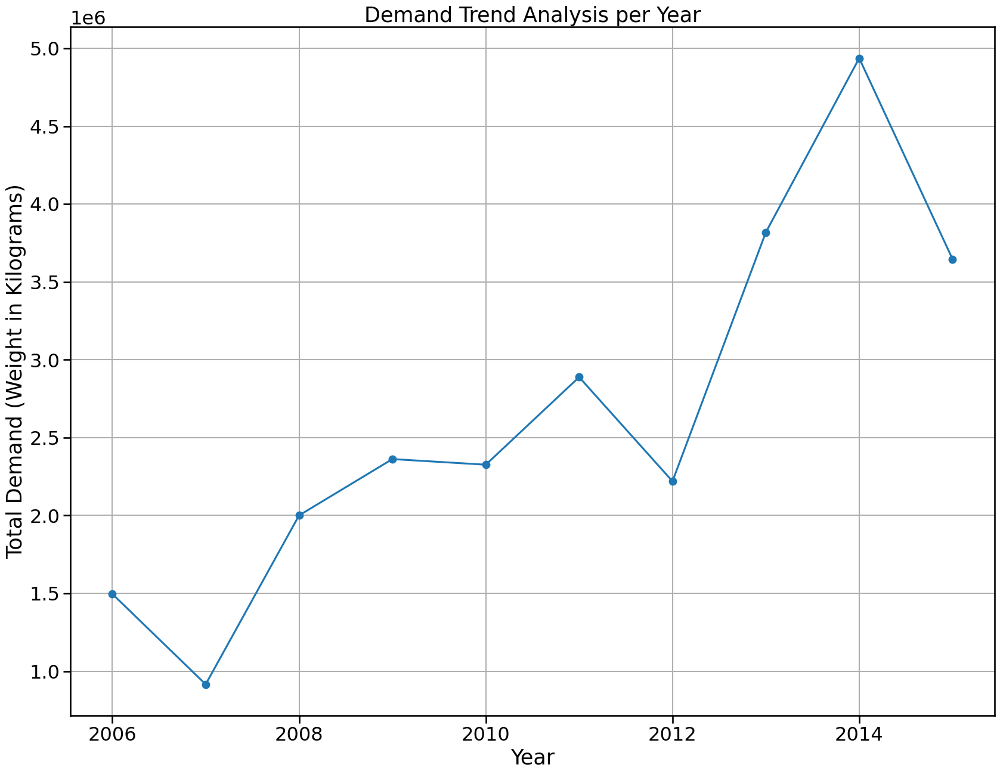

In [ ]:
# Convert 'Scheduled Delivery Date' to datetime if it isn't already
df['Scheduled Delivery Date'] = pd.to_datetime(df['Scheduled Delivery Date'])

# Create a 'Year' column
df['Year'] = df['Scheduled Delivery Date'].dt.year

# Group by year and calculate the demand trend (e.g., total quantity or value)
demand_trend = df.groupby('Year')['Weight (Kilograms)'].sum() # Replace 'Weight (Kilograms)' with your demand column

# Create the plot
plt.figure(figsize=(20, 15))
plt.plot(demand_trend.index, demand_trend.values, marker='o', linestyle='-')
plt.title('Demand Trend Analysis per Year')
plt.xlabel('Year')
plt.ylabel('Total Demand (Weight in Kilograms)') # Replace with your demand unit
plt.grid(True)
plt.show()

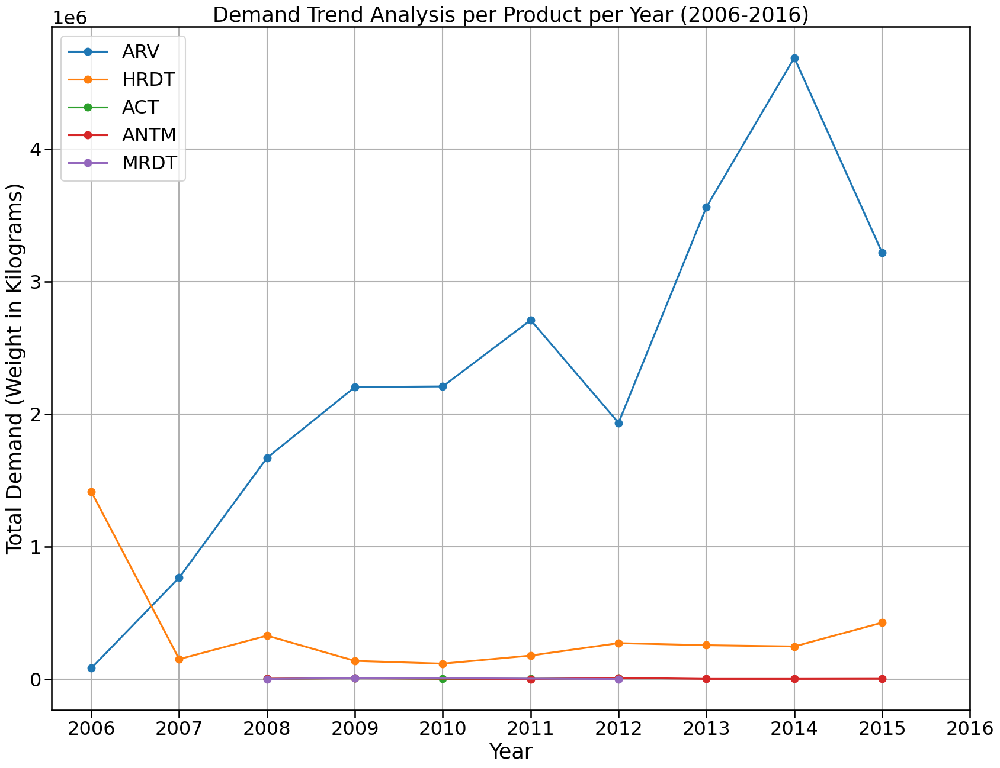

In [ ]:
# Convert 'Scheduled Delivery Date' to datetime if it isn't already
df['Scheduled Delivery Date'] = pd.to_datetime(df['Scheduled Delivery Date'])

# Create 'Year' and 'Product Name' columns
df['Year'] = df['Scheduled Delivery Date'].dt.year

# Group by year and product, then sum the demand
demand_trend = df.groupby(['Year', 'Product Group'])['Weight (Kilograms)'].sum().reset_index()

# Create the plot
plt.figure(figsize=(20, 15))

for product in demand_trend['Product Group'].unique():
    product_data = demand_trend[demand_trend['Product Group'] == product]
    plt.plot(product_data['Year'], product_data['Weight (Kilograms)'], marker='o', linestyle='-', label=product)

plt.title('Demand Trend Analysis per Product per Year (2006-2016)')
plt.xlabel('Year')
plt.ylabel('Total Demand (Weight in Kilograms)') # Replace with your demand unit
plt.grid(True)
plt.legend() # Show legend for different products
plt.xticks(range(2006, 2017)) # Ensure all years are displayed on the x-axis
plt.show()

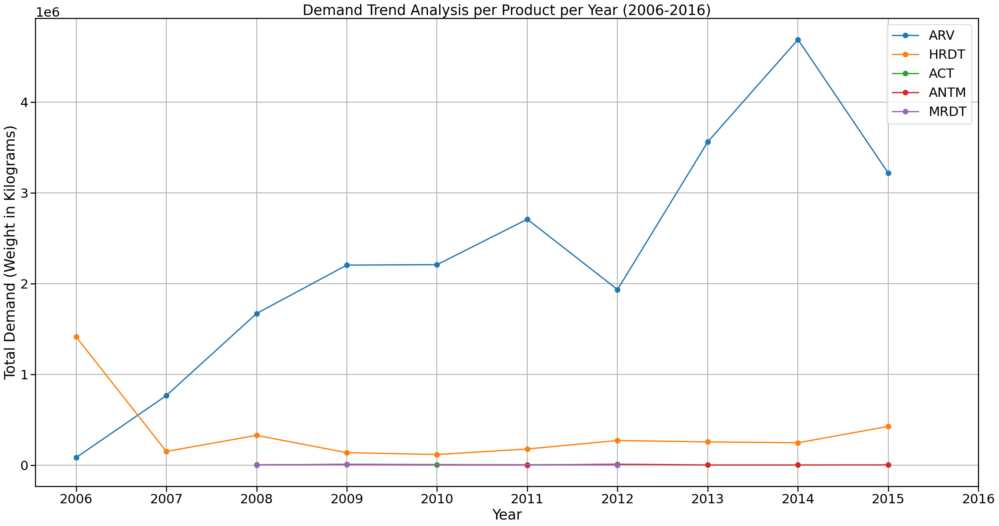

In [ ]:
# Convert 'Scheduled Delivery Date' to datetime if it isn't already
df['Scheduled Delivery Date'] = pd.to_datetime(df['Scheduled Delivery Date'])

# Create 'Year' and 'Product Name' columns
df['Year'] = df['Scheduled Delivery Date'].dt.year

# Group by year and product, then sum the demand
demand_trend = df.groupby(['Year', 'Product Group'])['Weight (Kilograms)'].sum().reset_index()

# Filter for the years 2006-2016
demand_trend = demand_trend[(demand_trend['Year'] >= 2006) & (demand_trend['Year'] <= 2016)]

# Create the plot
plt.figure(figsize=(30, 15))

for product in demand_trend['Product Group'].unique():
    product_data = demand_trend[demand_trend['Product Group'] == product]
    plt.plot(product_data['Year'], product_data['Weight (Kilograms)'], marker='o', linestyle='-', label=product)

plt.title('Demand Trend Analysis per Product per Year (2006-2016)')
plt.xlabel('Year')
plt.ylabel('Total Demand (Weight in Kilograms)') # Replace with your demand unit
plt.grid(True)
plt.legend() # Show legend for different products
plt.xticks(range(2006, 2017)) # Ensure all years are displayed on the x-axis
plt.show()

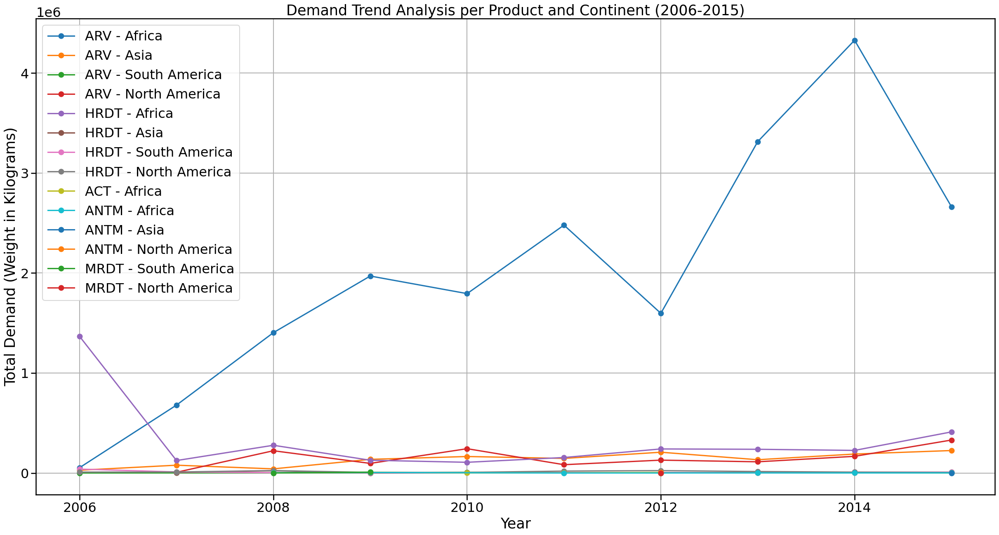

In [ ]:
df['Scheduled Delivery Date'] = pd.to_datetime(df['Scheduled Delivery Date'])

# Create 'Year' column
df['Year'] = df['Scheduled Delivery Date'].dt.year

# Group by year, product, and continent, then calculate the demand trend
demand_trend = df.groupby(['Year', 'Product Group', 'Continent'])['Weight (Kilograms)'].sum().reset_index()

# Filter for years 2006-2016
demand_trend = demand_trend[(demand_trend['Year'] >= 2006) & (demand_trend['Year'] <= 2017)]

# Plotting
plt.figure(figsize=(30, 15))

for product in demand_trend['Product Group'].unique():
    for continent in demand_trend['Continent'].unique():
        subset = demand_trend[(demand_trend['Product Group'] == product) & (demand_trend['Continent'] == continent)]
        if not subset.empty:  # Check if the subset is not empty
            plt.plot(subset['Year'], subset['Weight (Kilograms)'], marker='o', linestyle='-', label=f'{product} - {continent}')

plt.title('Demand Trend Analysis per Product and Continent (2006-2015)')
plt.xlabel('Year')
plt.ylabel('Total Demand (Weight in Kilograms)')
plt.grid(True)
plt.legend()
plt.show()

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7177 entries, 0 to 9960
Data columns (total 45 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        --------------  -----         
 0   ID                            7177 non-null   int64         
 1   Project Code                  7177 non-null   object        
 2   PQ #                          7177 non-null   object        
 3   PO / SO #                     7177 non-null   object        
 4   ASN/DN #                      7177 non-null   object        
 5   Country                       7177 non-null   object        
 6   Managed By                    7177 non-null   object        
 7   Fulfill Via                   7177 non-null   object        
 8   Vendor INCO Term              7177 non-null   object        
 9   Shipment Mode                 7177 non-null   object        
 10  PQ First Sent to Client Date  7177 non-null   datetime64[ns]
 11  PO Sent to Vendor Date        7177 

In [ ]:
df['Fulfill Via'].value_counts()

,count
Fulfill Via,
Direct Drop,4492
From RDC,2685


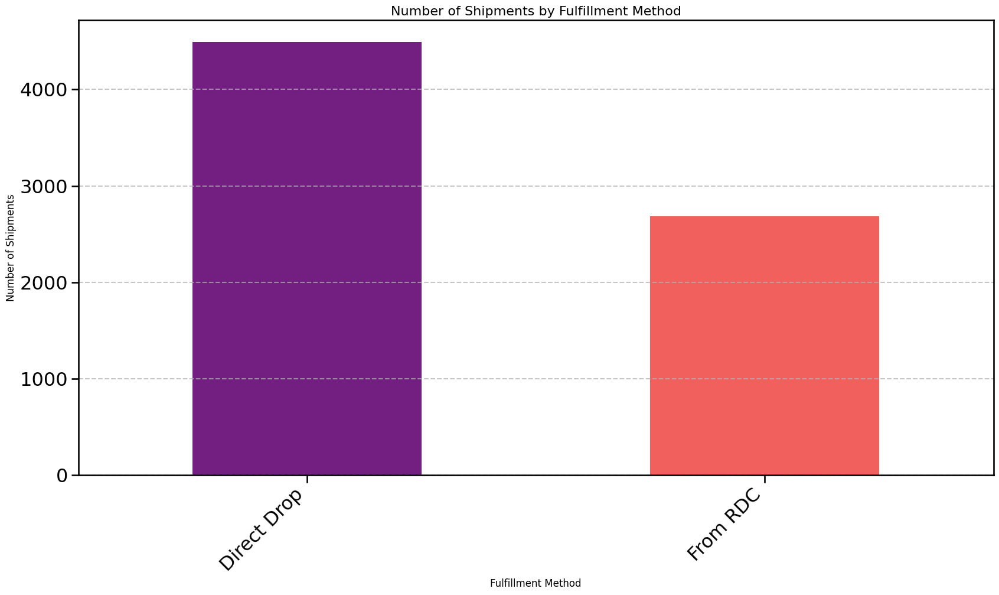

In [ ]:
# 2. Count of Shipments by Fulfillment Method (with colors)
plt.figure(figsize=(20, 10))
df['Fulfill Via'].value_counts().plot(kind='bar', color=sns.color_palette("magma", len(df['Fulfill Via'].unique()))) # Use a different color palette
plt.title('Number of Shipments by Fulfillment Method', fontsize=16)
plt.xlabel('Fulfillment Method', fontsize=12)
plt.ylabel('Number of Shipments', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

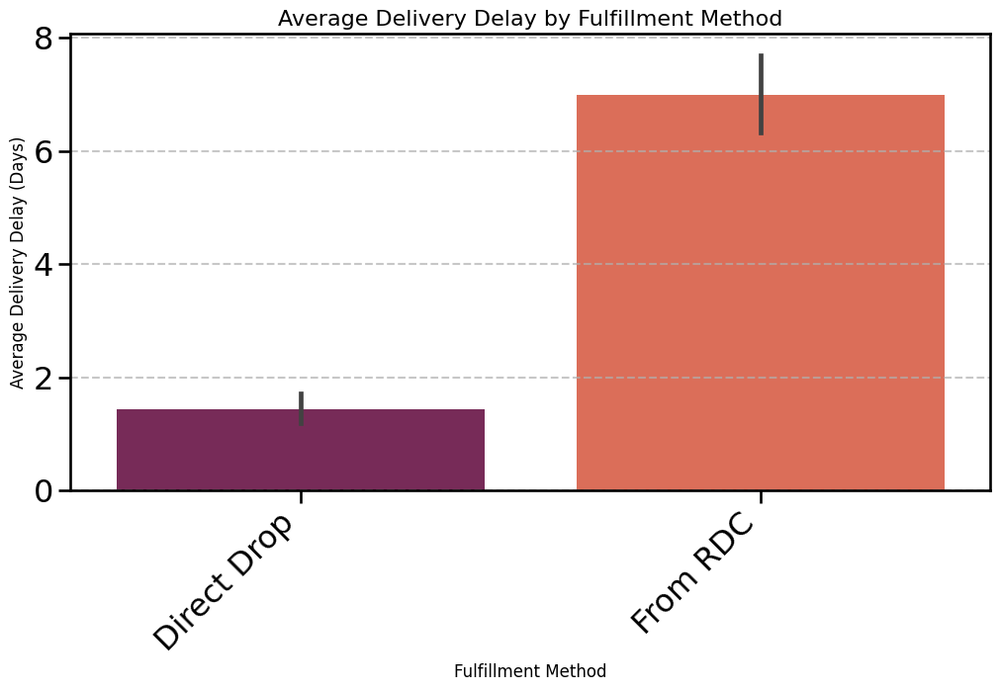

In [ ]:
# 3. Average Delay by Fulfillment Method (with error bars)
plt.figure(figsize=(12, 6))
sns.barplot(x='Fulfill Via', y='Delivery Delay', data=df, palette='rocket', ci=95) # Use error bars and a different palette
plt.title('Average Delivery Delay by Fulfillment Method', fontsize=16)
plt.xlabel('Fulfillment Method', fontsize=12)
plt.ylabel('Average Delivery Delay (Days)', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

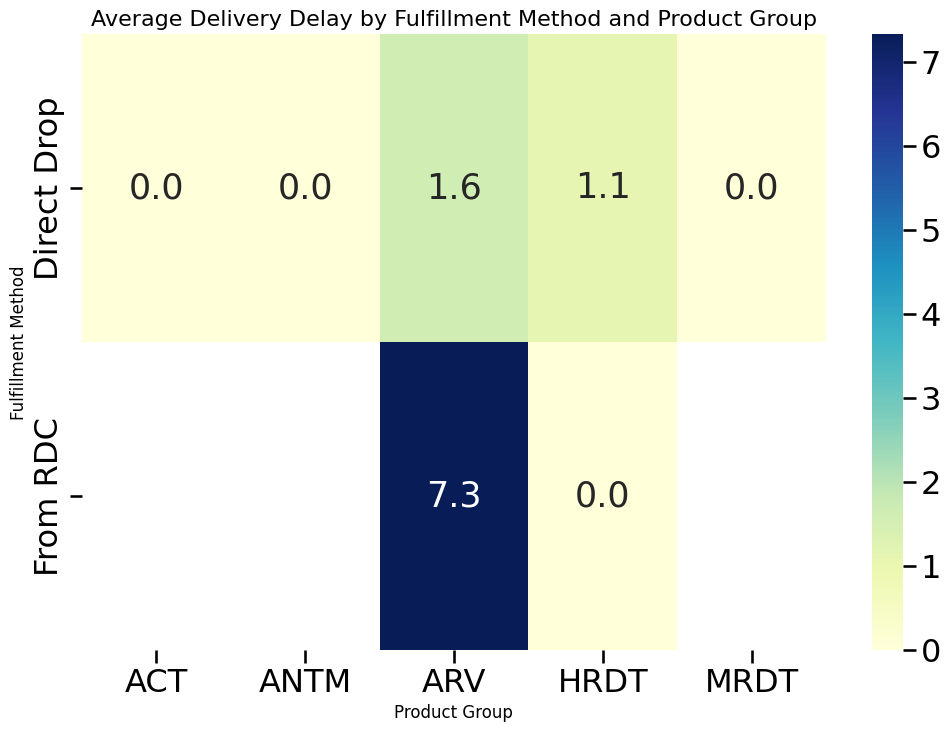

In [ ]:
# 4. Heatmap of Delivery Delays by Fulfillment Method and other categorical variables
if 'Product Group' in df.columns: # Check if 'Product Group' column exists
  delay_pivot = df.pivot_table(values='Delivery Delay', index='Fulfill Via', columns='Product Group', aggfunc='mean')
  plt.figure(figsize=(12, 8))
  sns.heatmap(delay_pivot, annot=True, fmt=".1f", cmap="YlGnBu") # Use a visually appealing colormap
  plt.title('Average Delivery Delay by Fulfillment Method and Product Group', fontsize=16)
  plt.xlabel('Product Group', fontsize=12)
  plt.ylabel('Fulfillment Method', fontsize=12)
  plt.show()


In [ ]:
# Group data by 'Fulfill Via' and 'Continent', then calculate the mean delivery delay
delay_by_method_continent = df.groupby(['Fulfill Via', 'Continent'])['Delivery Delay'].mean().reset_index()

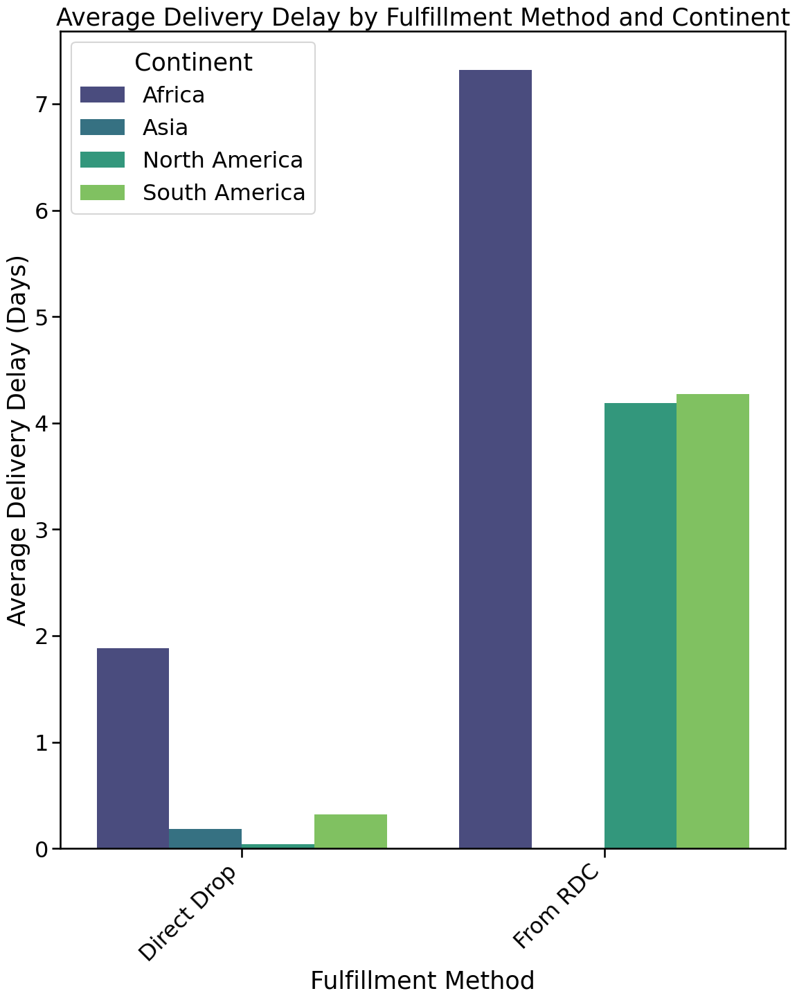

In [ ]:
# Create a bar plot with continent as a hue
plt.figure(figsize=(12, 15))
sns.barplot(x='Fulfill Via', y='Delivery Delay', hue='Continent', data=delay_by_method_continent, palette="viridis")
plt.title('Average Delivery Delay by Fulfillment Method and Continent')
plt.xlabel('Fulfillment Method')
plt.ylabel('Average Delivery Delay (Days)')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
plt.tight_layout()
plt.show()


<ipython-input-110-6abe3f1a09fc>:3: UserWarning:



The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.




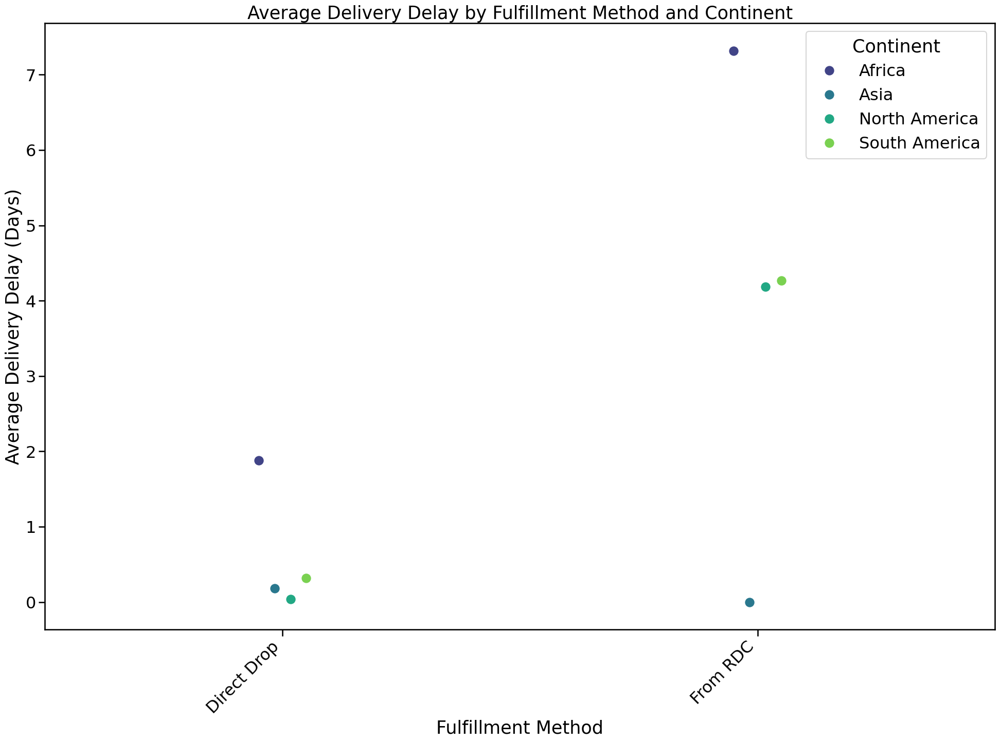

In [ ]:
#Alternative visualization using a point plot
plt.figure(figsize=(20, 15))
sns.pointplot(x='Fulfill Via', y='Delivery Delay', hue='Continent', data=delay_by_method_continent, palette="viridis", dodge=True, join=False)
plt.title('Average Delivery Delay by Fulfillment Method and Continent')
plt.xlabel('Fulfillment Method')
plt.ylabel('Average Delivery Delay (Days)')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

<ipython-input-111-d0079e1917bd>:3: UserWarning:



The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.




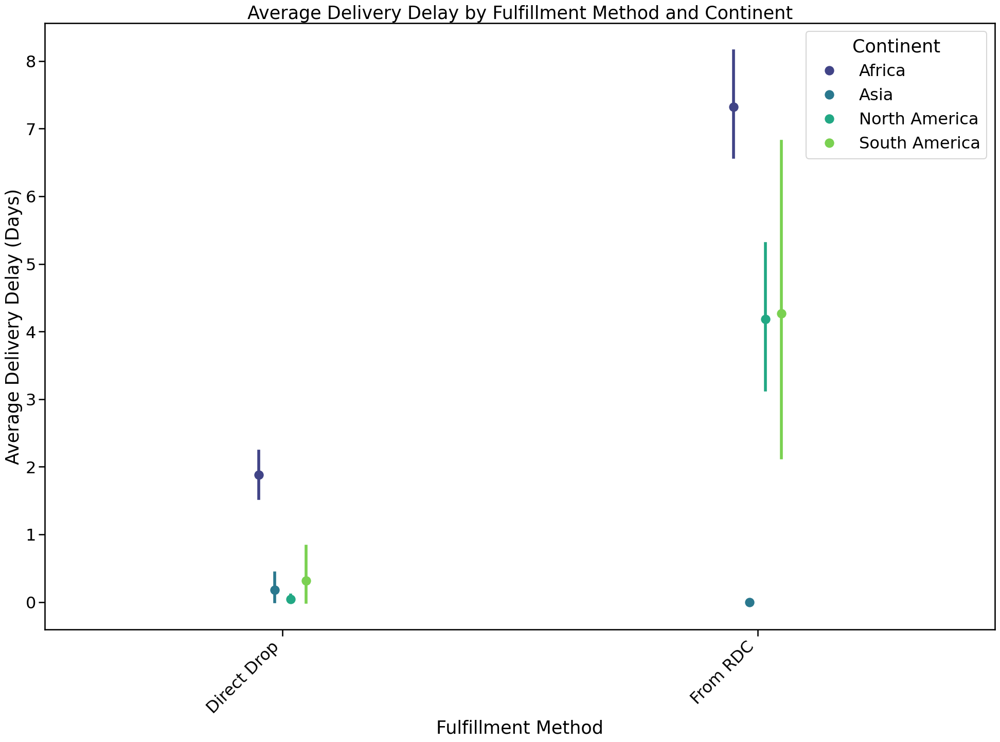

In [ ]:
#Alternative visualization using a point plot
plt.figure(figsize=(20, 15))
sns.pointplot(x='Fulfill Via', y='Delivery Delay', hue='Continent',
              data=df.reset_index(),  # Reset the index
              palette="viridis", dodge=True, join=False)
plt.title('Average Delivery Delay by Fulfillment Method and Continent')
plt.xlabel('Fulfillment Method')
plt.ylabel('Average Delivery Delay (Days)')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7177 entries, 0 to 9960
Data columns (total 45 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        --------------  -----         
 0   ID                            7177 non-null   int64         
 1   Project Code                  7177 non-null   object        
 2   PQ #                          7177 non-null   object        
 3   PO / SO #                     7177 non-null   object        
 4   ASN/DN #                      7177 non-null   object        
 5   Country                       7177 non-null   object        
 6   Managed By                    7177 non-null   object        
 7   Fulfill Via                   7177 non-null   object        
 8   Vendor INCO Term              7177 non-null   object        
 9   Shipment Mode                 7177 non-null   object        
 10  PQ First Sent to Client Date  7177 non-null   datetime64[ns]
 11  PO Sent to Vendor Date        7177 

In [ ]:
# Filter for African countries
africa_df = df[df['Continent'] == 'Africa']

# Group data by 'Fulfill Via' and 'Continent', then calculate the mean delivery delay
delay_by_method_continent = africa_df.groupby(['Fulfill Via', 'Country'])['Delivery Delay'].mean().reset_index()


In [ ]:
longest_delay_day = df['Delivery Delay'].max()
print(f"The longest delivery delay is: {longest_delay_day} days")

The longest delivery delay is: 192 days


In [ ]:
df.describe()

,ID,PQ First Sent to Client Date,PO Sent to Vendor Date,Scheduled Delivery Date,Delivered to Client Date,Delivery Recorded Date,Unit of Measure (Per Pack),Line Item Quantity,Line Item Value,Pack Price,Unit Price,Weight (Kilograms),Freight Cost (USD),Line Item Insurance (USD),Cost per Shipment,Cost per Unit,Delivery Delay,on_time_delivery_rate,average_delivery_delay,Reliability Score,Delivery Status,Month,Year,Quarter
count,"7,177.00",7177,7177,7177,7177,7177,"7,177.00","7,177.00","7,177.00","7,177.00","7,177.00","7,177.00","7,177.00","7,177.00","7,177.00","7,177.00","7,177.00","7,177.00","7,177.00","7,177.00","7,177.00",7177,"7,177.00","7,177.00"
mean,"44,060.28",2011-04-28 17:31:09.471924224,2011-07-01 06:21:25.105197056,2011-10-15 11:20:46.481816832,2011-10-18 23:43:32.846593536,2011-10-21 05:25:26.375922944,79.53,"15,408.31","138,361.37",26.30,0.72,"3,707.37","10,032.63",214.47,inf,0.72,3.52,0.90,0.59,0.80,0.84,2011-09-29 19:45:11.160652032,"2,011.28",2.53
min,1.00,2005-11-11 00:00:00,2006-01-16 00:00:00,2006-05-02 00:00:00,2006-05-02 00:00:00,2006-05-02 00:00:00,1.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.82,0.00,0.61,0.00,2006-05-01 00:00:00,"2,006.00",1.00
25%,"12,552.00",2009-02-06 00:00:00,2009-04-24 00:00:00,2009-07-31 00:00:00,2009-08-04 00:00:00,2009-08-04 00:00:00,30.00,300.00,"3,728.32",4.67,0.09,346.00,"1,215.84",5.54,1.46,0.09,0.00,0.82,0.31,0.67,1.00,2009-07-01 00:00:00,"2,009.00",2.00
50%,"41,910.00",2011-05-23 00:00:00,2011-07-08 00:00:00,2011-11-17 00:00:00,2011-11-21 00:00:00,2011-11-21 00:00:00,60.00,"2,400.00","27,300.00",11.15,0.19,"1,951.00","4,996.20",41.79,5.16,0.19,0.00,0.87,0.70,0.82,1.00,2011-11-01 00:00:00,"2,011.00",3.00
75%,"74,385.00",2013-07-11 00:00:00,2013-10-17 00:00:00,2014-02-06 00:00:00,2014-02-08 00:00:00,2014-02-24 00:00:00,100.00,"12,785.00","158,406.40",30.82,0.72,"4,464.29","11,969.68",235.20,12.16,0.72,0.00,0.99,0.94,0.97,1.00,2014-02-01 00:00:00,"2,014.00",3.00
max,"86,819.00",2015-07-07 00:00:00,2015-08-24 00:00:00,2015-09-14 00:00:00,2015-09-14 00:00:00,2015-09-14 00:00:00,"1,000.00","515,000.00","4,278,871.84","1,345.64",41.68,"857,354.00","289,653.20","7,708.44",inf,41.68,192.00,1.00,1.00,1.00,1.00,2015-09-01 00:00:00,"2,015.00",4.00
std,"29,479.51",NaN,NaN,NaN,NaN,NaN,81.36,"34,920.87","284,269.78",52.51,2.58,"12,617.96","15,888.87",435.66,NaN,2.58,14.00,0.08,0.34,0.15,0.37,NaN,2.54,1.09


In [ ]:
aggregated_data = df.groupby(['Vendor', 'Manufacturing Site', 'Brand'])['Line Item Quantity'].sum().reset_index()
aggregated_data = aggregated_data.sort_values(by=['Line Item Quantity'], ascending=False)  # Sort after reset_index
aggregated_data.head(10)

,Vendor,Manufacturing Site,Brand,Line Item Quantity
194,SCMS from RDC,"Aurobindo Unit III, India",Generic,15920046
29,Aurobindo Pharma Limited,"Aurobindo Unit III, India",Generic,14854887
218,SCMS from RDC,Mylan (formerly Matrix) Nashik,Generic,12336017
206,SCMS from RDC,Hetero Unit III Hyderabad IN,Generic,10767549
233,STRIDES ARCOLAB LIMITED,"Strides, Bangalore, India.",Generic,7799152
105,MYLAN LABORATORIES LTD (FORMERLY MATRIX LABORA...,Mylan (formerly Matrix) Nashik,Generic,7550914
199,SCMS from RDC,"Cipla, Goa, India",Generic,6900216
56,HETERO LABS LIMITED,Hetero Unit III Hyderabad IN,Generic,6706284
45,CIPLA LIMITED,"Cipla, Goa, India",Generic,5605572
228,SCMS from RDC,"Strides, Bangalore, India.",Generic,5519616


In [ ]:
# Group by vendor and product, then sum the shipment quantity
shipment_data = df.groupby(['Vendor', 'Product Group'])['Weight (Kilograms)'].sum().reset_index()

# Find the brand with the highest total shipment
highest_shipment_brand = shipment_data.loc[shipment_data['Weight (Kilograms)'].idxmax()]

In [ ]:
df['Brand'].value_counts()

,count
Brand,
Generic,4584
Determine,723
Uni-Gold,362
Aluvia,199
Kaletra,142
Norvir,122
Bioline,106
Stat-Pak,98
Truvada,74


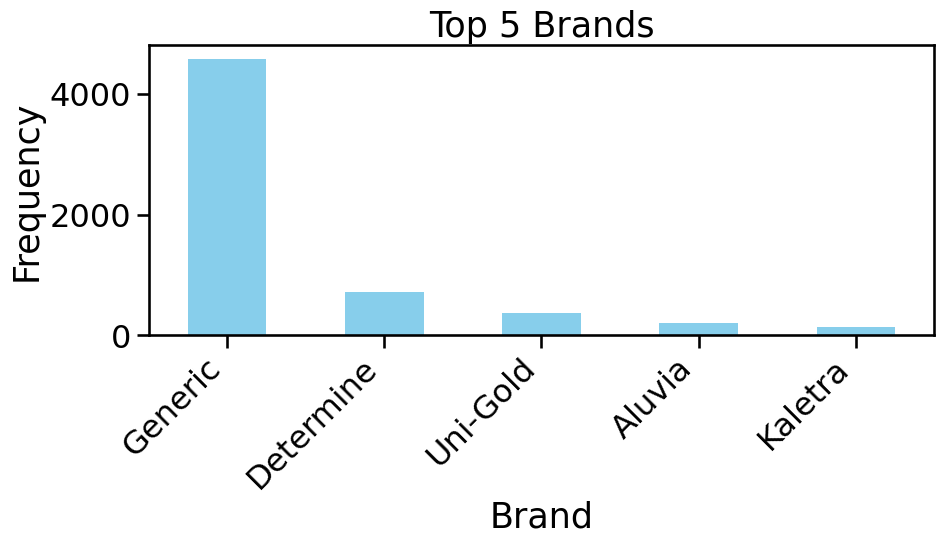

In [ ]:
# Assuming 'df' is your DataFrame and 'Brand' is a column
top_5_brands = df['Brand'].value_counts().nlargest(5)

plt.figure(figsize=(10, 6))
top_5_brands.plot(kind='bar', color='skyblue')
plt.title('Top 5 Brands')
plt.xlabel('Brand')
plt.ylabel('Frequency')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7177 entries, 0 to 9960
Data columns (total 45 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        --------------  -----         
 0   ID                            7177 non-null   int64         
 1   Project Code                  7177 non-null   object        
 2   PQ #                          7177 non-null   object        
 3   PO / SO #                     7177 non-null   object        
 4   ASN/DN #                      7177 non-null   object        
 5   Country                       7177 non-null   object        
 6   Managed By                    7177 non-null   object        
 7   Fulfill Via                   7177 non-null   object        
 8   Vendor INCO Term              7177 non-null   object        
 9   Shipment Mode                 7177 non-null   object        
 10  PQ First Sent to Client Date  7177 non-null   datetime64[ns]
 11  PO Sent to Vendor Date        7177 

In [ ]:
# Calculate the total order volume per vendor
order_volume_by_vendor = df.groupby('Vendor')['Line Item Quantity'].sum()

# Calculate the average on-time delivery rate per vendor
on_time_delivery_rate_by_vendor = df.groupby('Vendor')['on_time_delivery_rate'].mean()

# Create a combined DataFrame for plotting
vendor_performance = pd.DataFrame({
    'Order Volume': order_volume_by_vendor,
    'On-Time Delivery Rate': on_time_delivery_rate_by_vendor
})

23                    93.75
67                     0.31
117                    0.18
139                   25.00
191                   12.50
               ...         
9943              22,222.22
9944               1,677.41
9945              27,272.73
9946                 941.53
9960               3,512.00
Name: Order Capacity Index, Length: 1182, dtype: float64


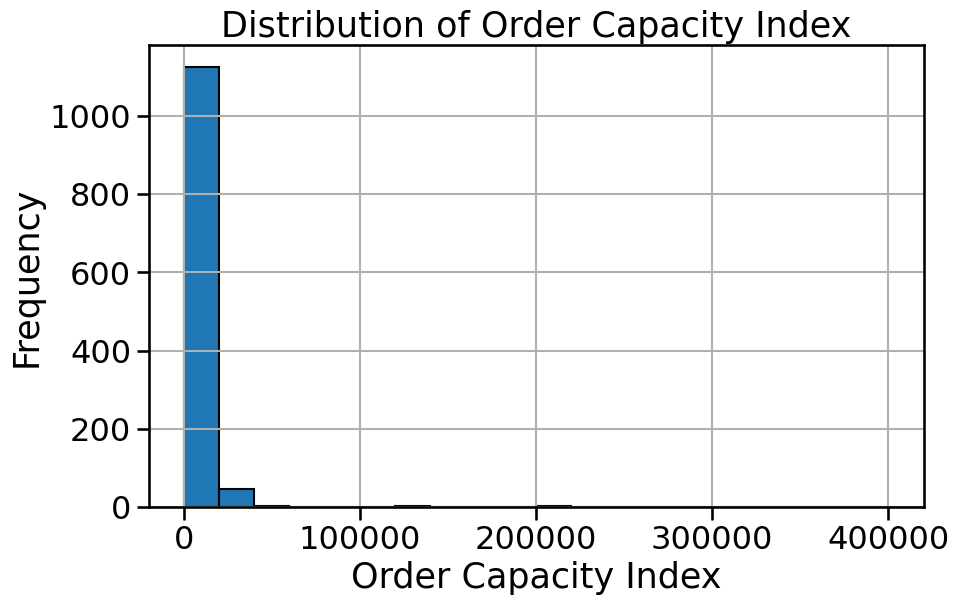

In [ ]:
# Calculate the Order Capacity Index, handling potential division by zero
df['Order Capacity Index'] = df['Line Item Quantity'] / df['Delivery Delay'].replace(0, np.nan)

# Remove rows with NaN values in 'Order Capacity Index' before plotting
df = df[df['Order Capacity Index'].notna()]

# Print the Order Capacity Index values
print(df['Order Capacity Index'])

# Visualize the distribution of the Order Capacity Index using a histogram
plt.figure(figsize=(10, 6))
plt.hist(df['Order Capacity Index'], bins=20, edgecolor='black')  # Adjust bins as needed
plt.xlabel('Order Capacity Index')
plt.ylabel('Frequency')
plt.title('Distribution of Order Capacity Index')
plt.grid(True)
plt.show()

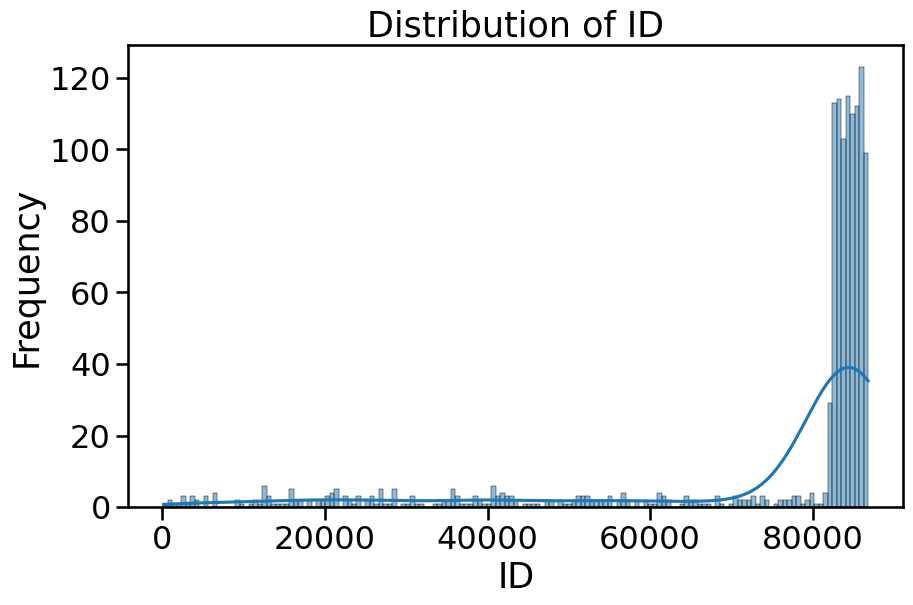

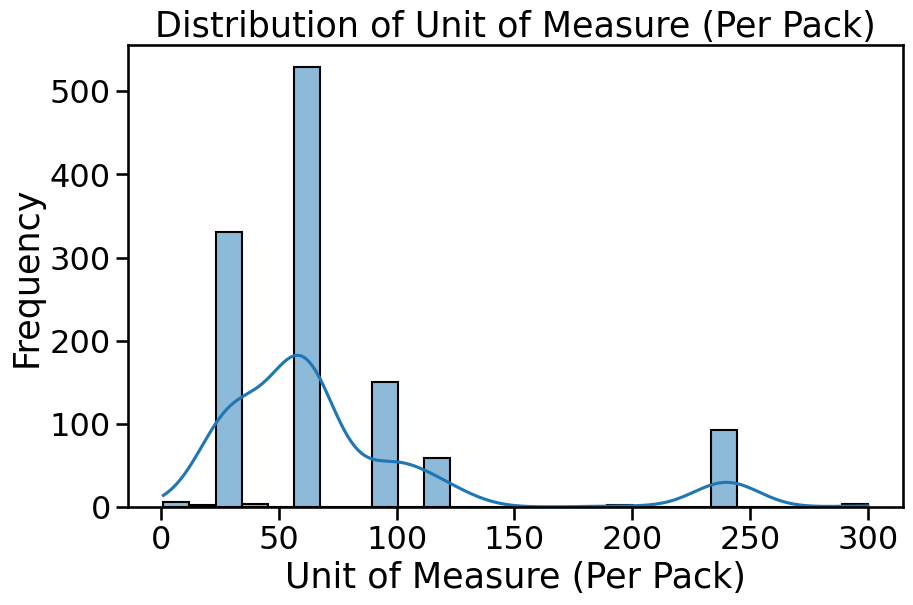

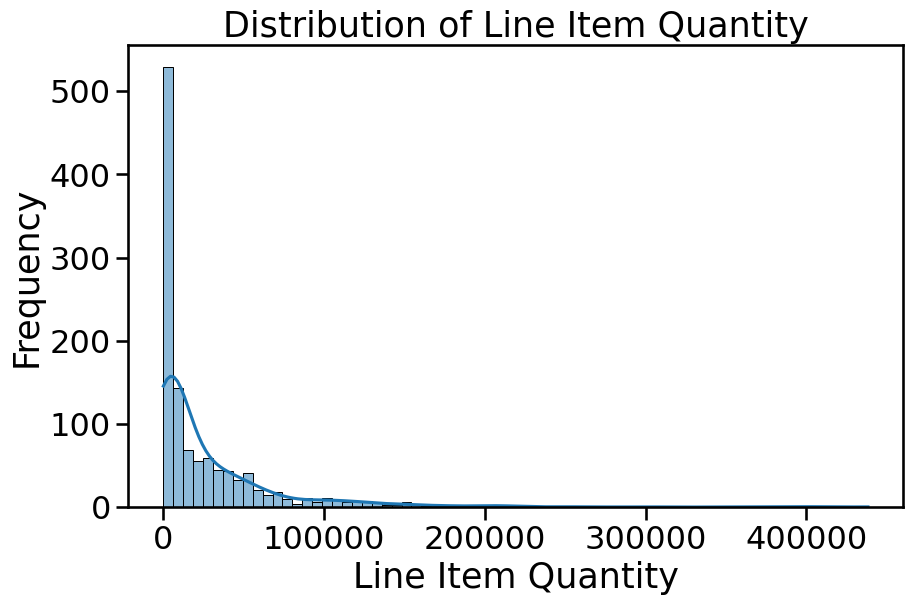

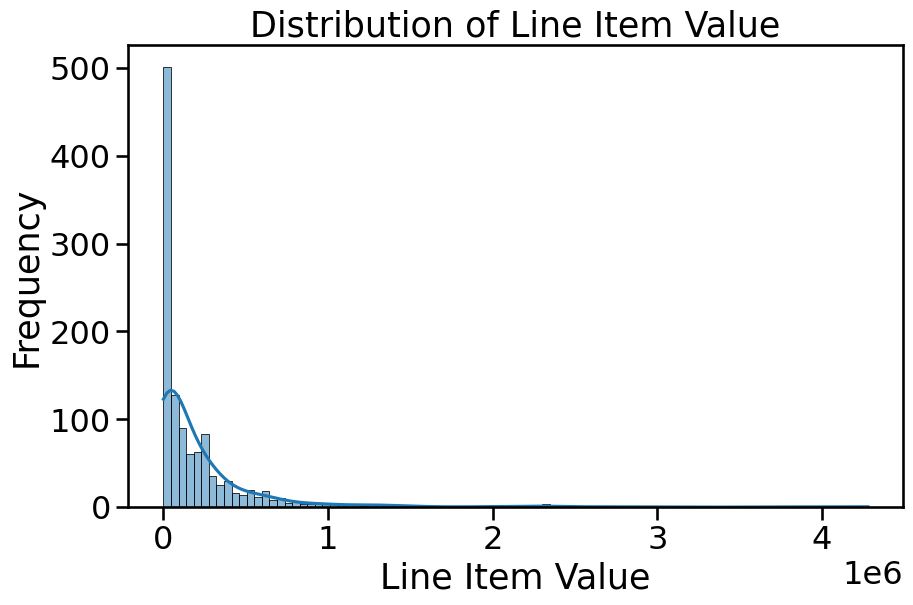

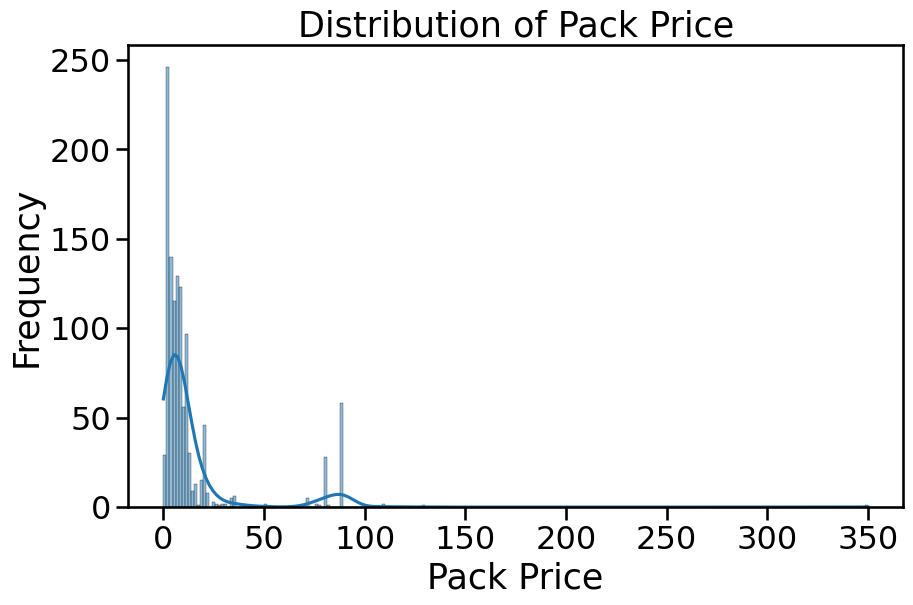

...

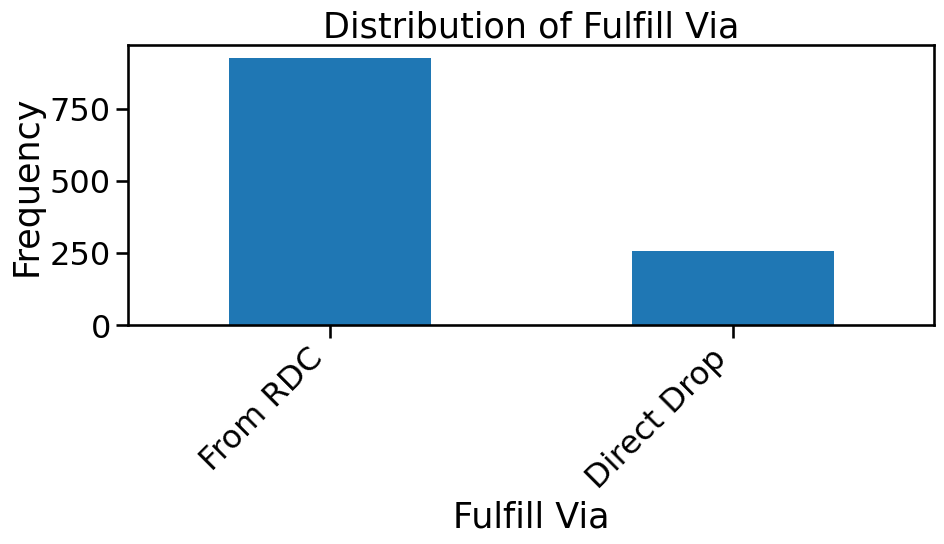

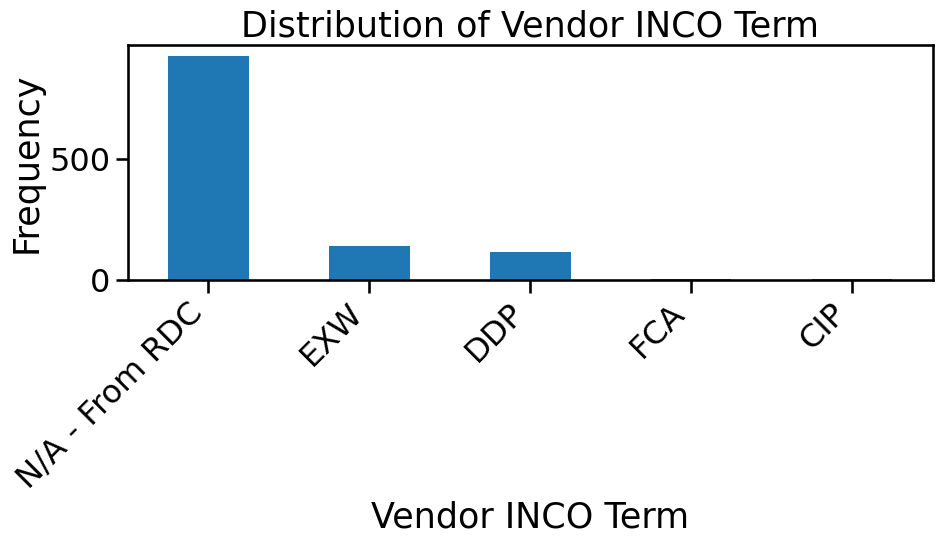

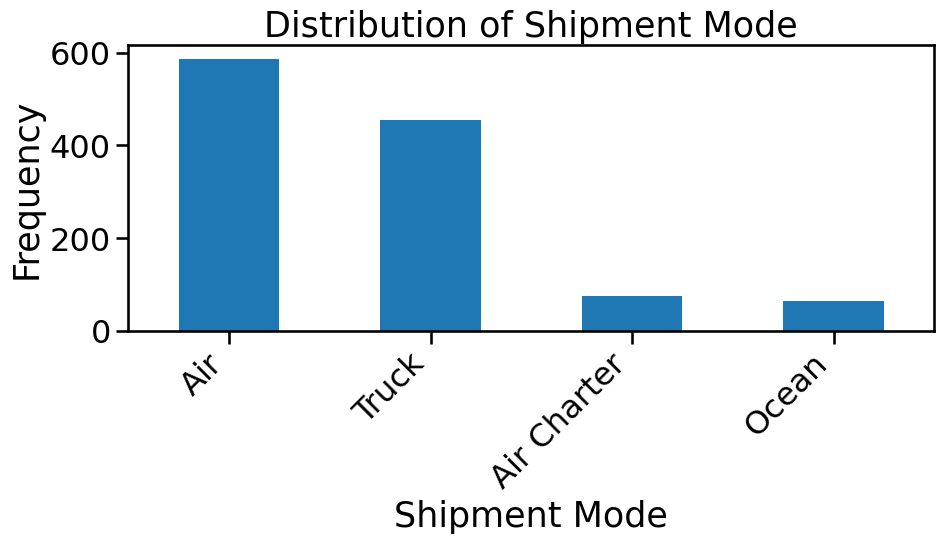

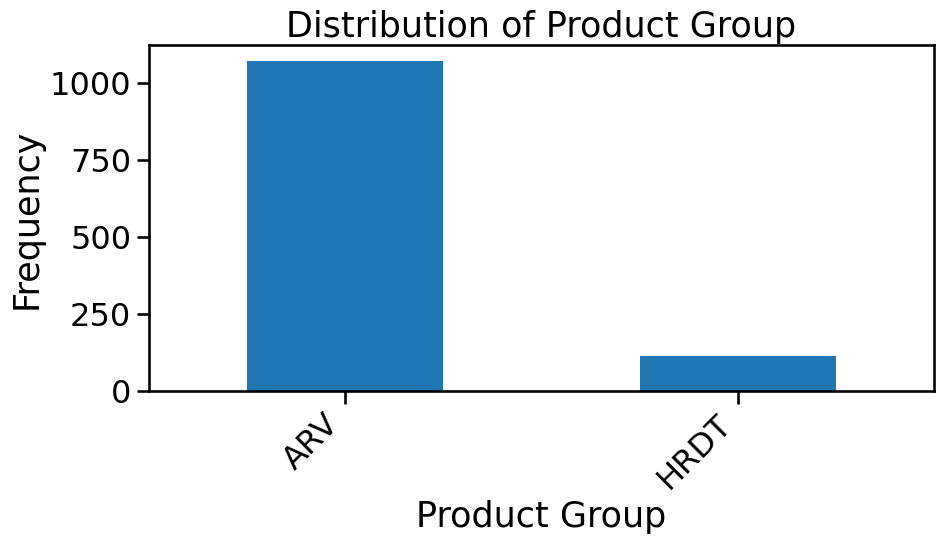

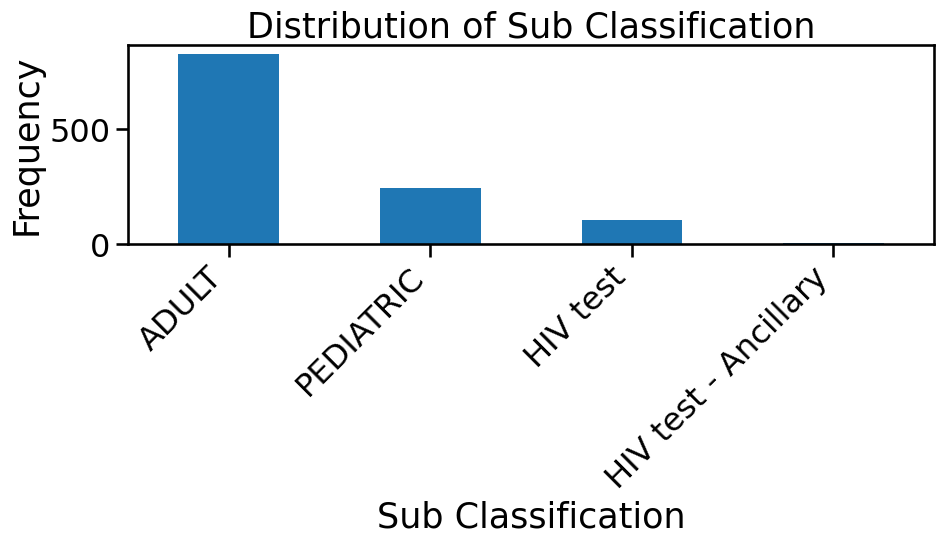

<ipython-input-123-9cbd43752a2e>:32: UserWarning:

Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.



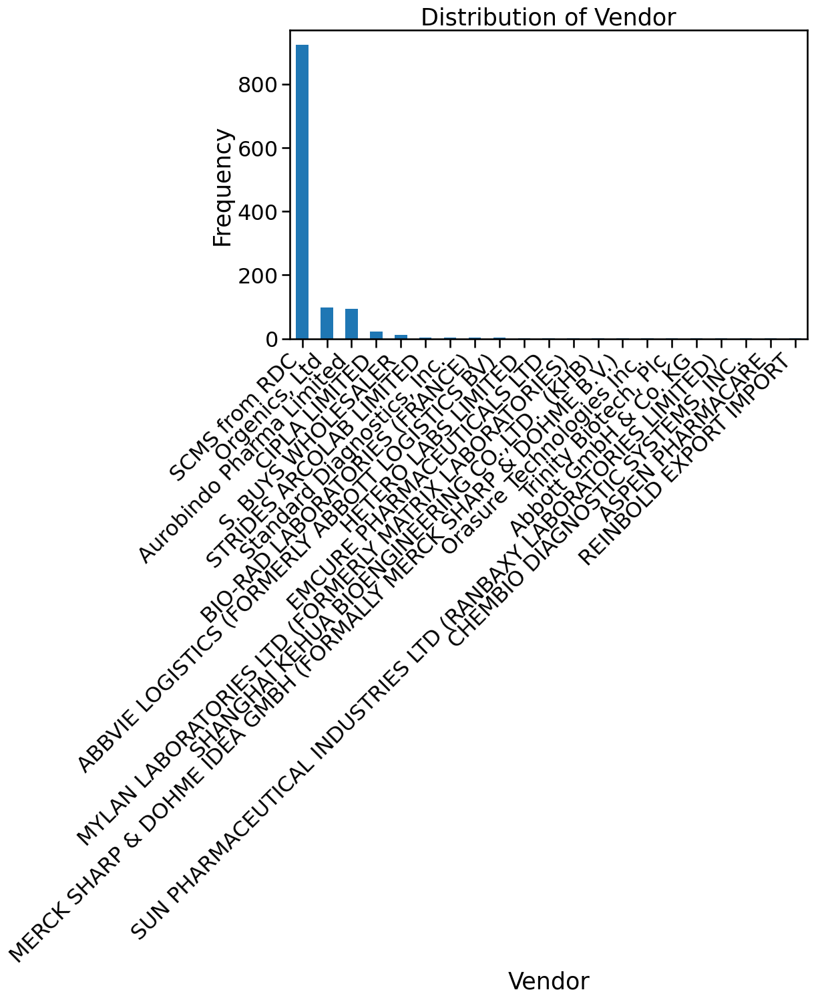

<ipython-input-123-9cbd43752a2e>:32: UserWarning:

Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.



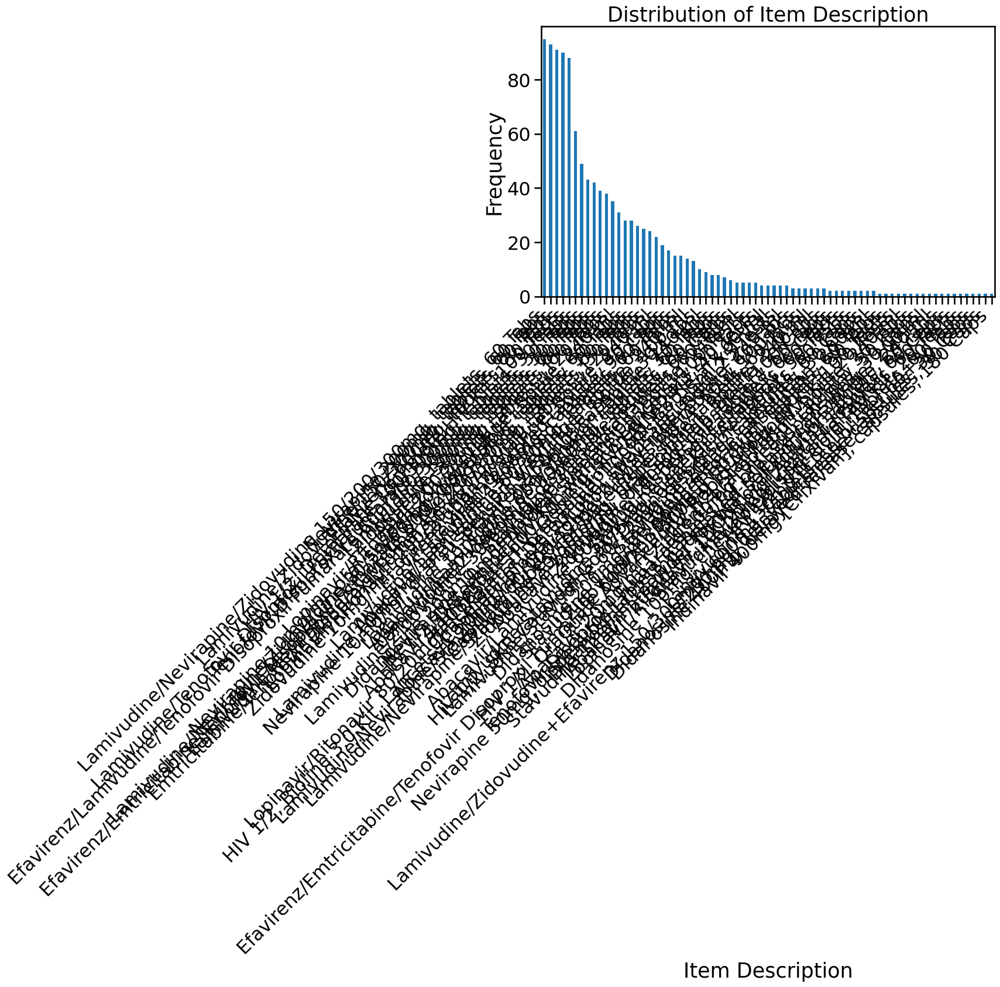

<ipython-input-123-9cbd43752a2e>:32: UserWarning:

Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.



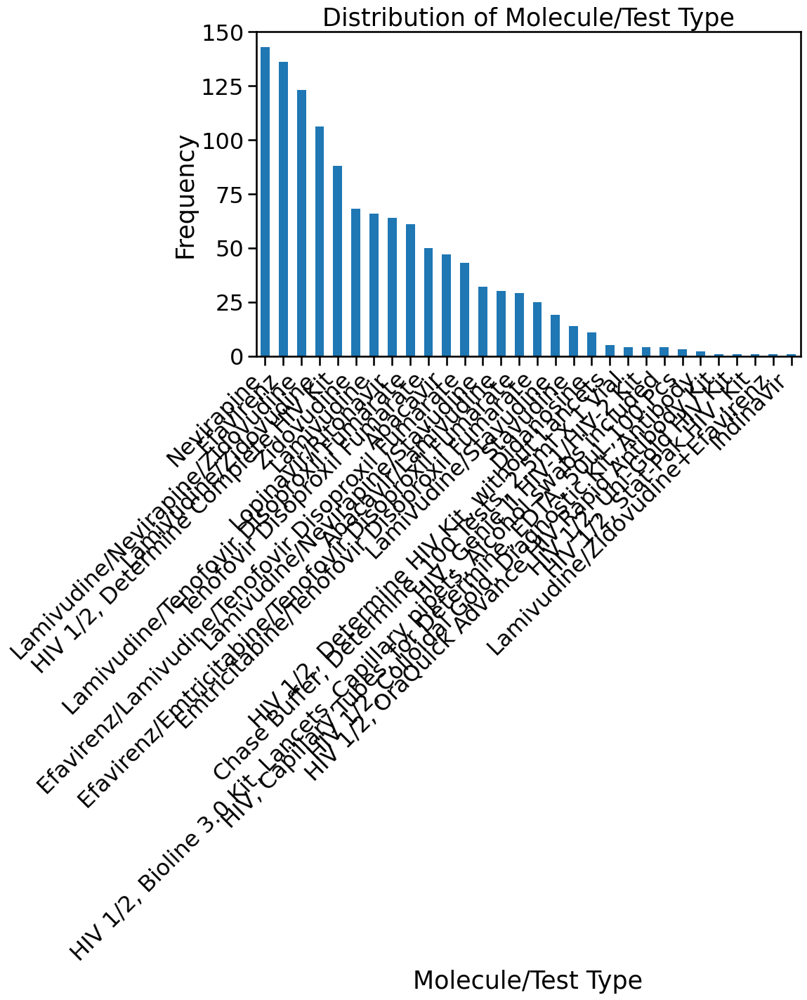

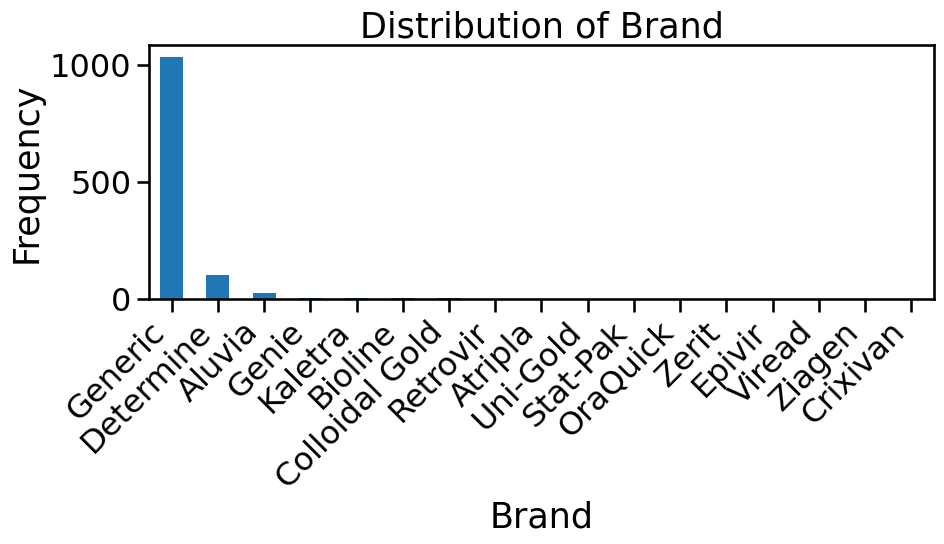

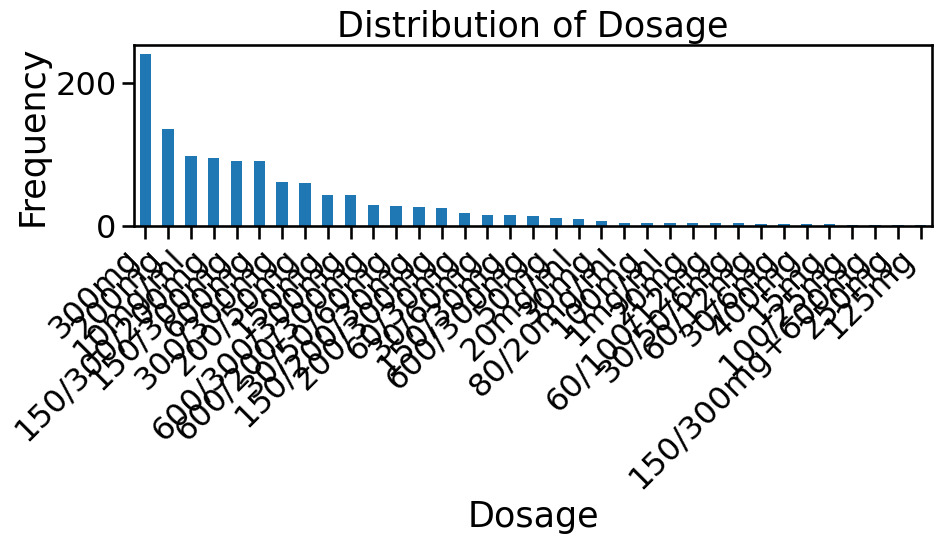

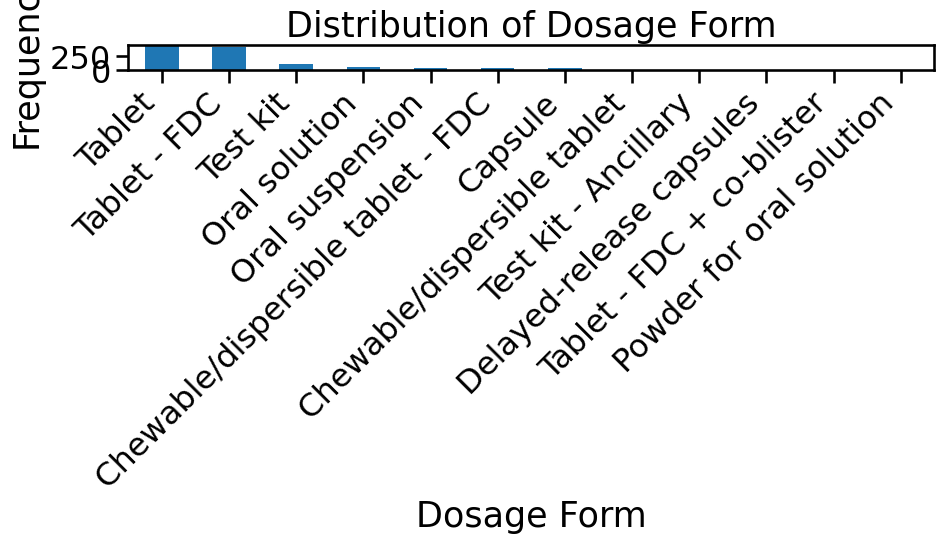

<ipython-input-123-9cbd43752a2e>:32: UserWarning:

Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.



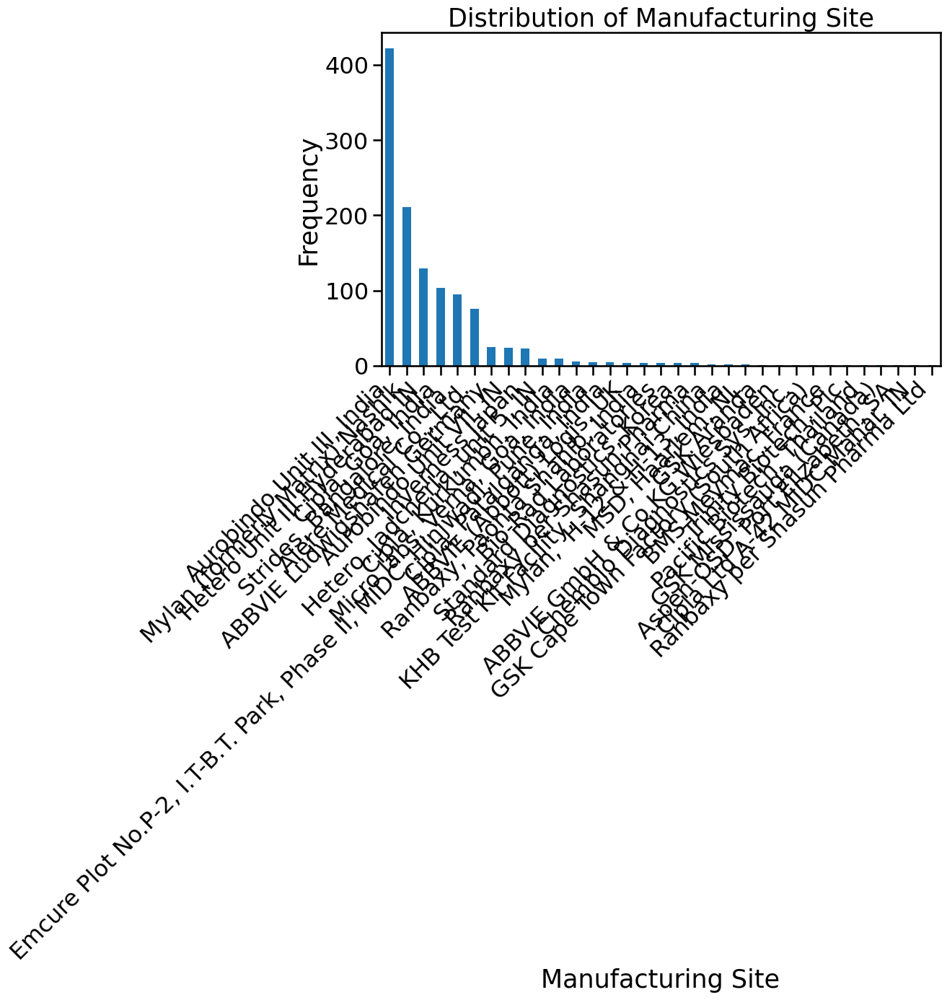

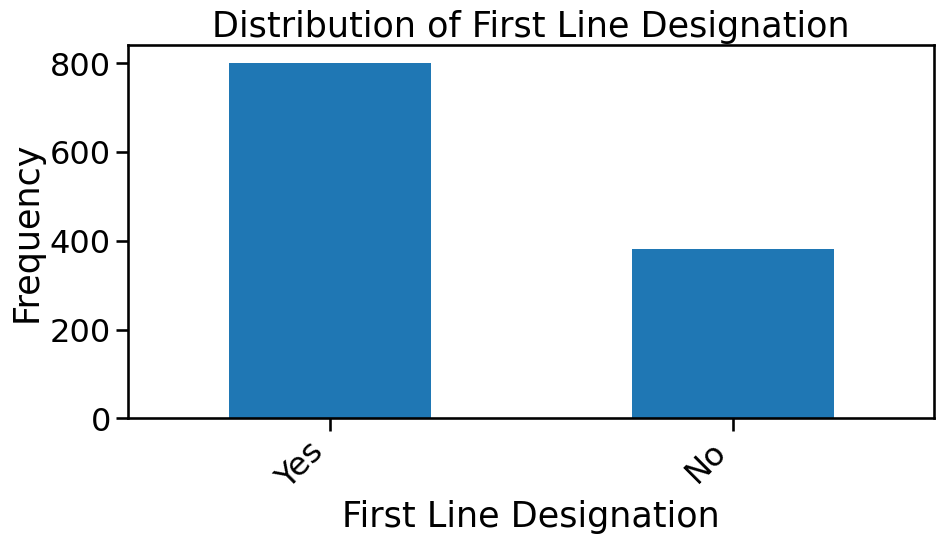

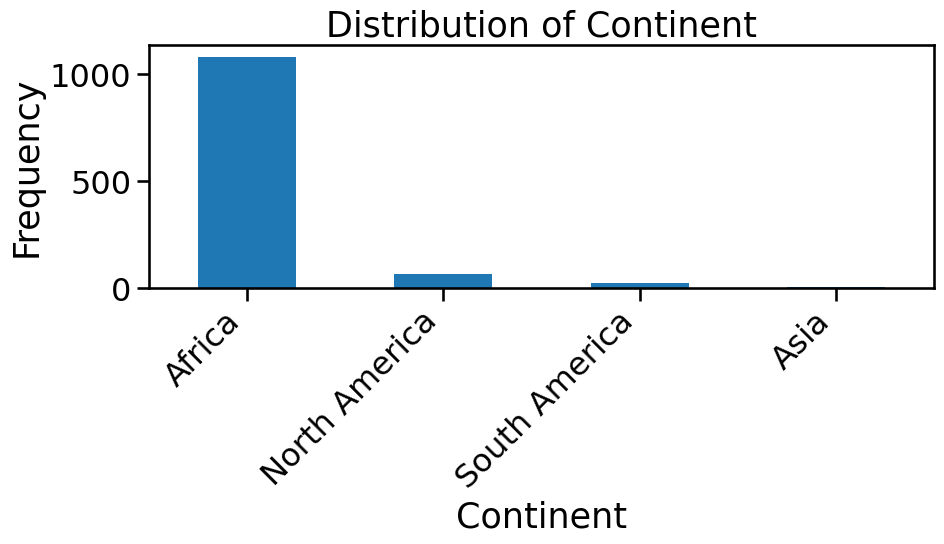

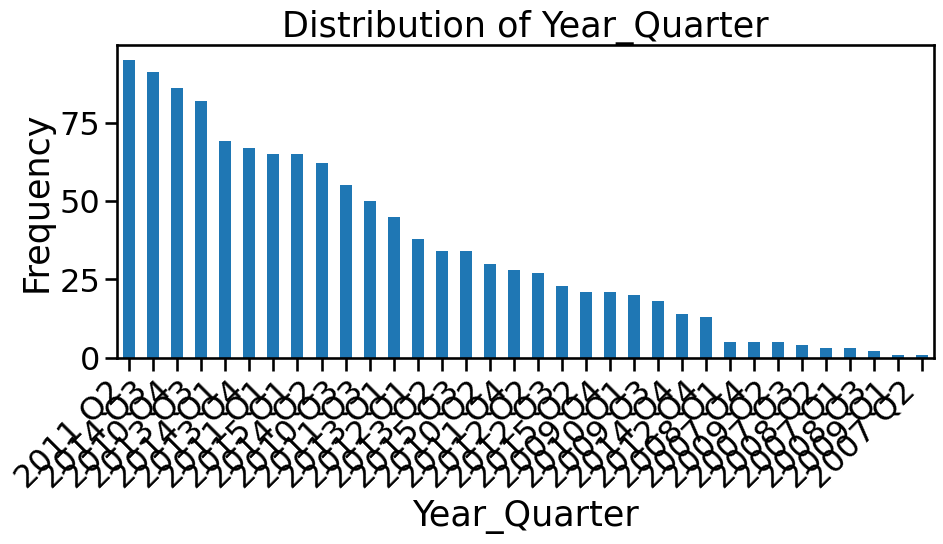

In [ ]:
# prompt: check data distribution fot all column

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming your dataframe is named 'df'
# Replace 'df' with the actual name of your dataframe if different

#Check for numerical columns
numerical_cols = df.select_dtypes(include=['number']).columns

#Loop through each numerical column to plot the distribution
for col in numerical_cols:
    plt.figure(figsize=(10, 6))
    sns.histplot(df[col], kde=True) #Histogram with KDE
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

#Check for categorical columns
categorical_cols = df.select_dtypes(include=['object', 'category']).columns
#Loop through each categorical column to plot the distribution
for col in categorical_cols:
    plt.figure(figsize=(10, 6))
    df[col].value_counts().plot(kind='bar') #Barplot for categorical data
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

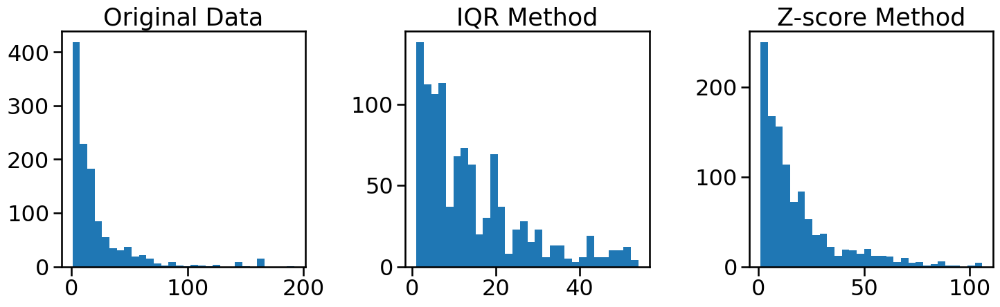

In [ ]:
# prompt: handling outliers

# Assuming 'df' is your DataFrame and 'Delivery Delay' is the column with outliers

# Method 1: IQR Method
Q1 = df['Delivery Delay'].quantile(0.25)
Q3 = df['Delivery Delay'].quantile(0.75)
IQR = Q3 - Q1
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Filter out outliers
df_filtered_iqr = df[(df['Delivery Delay'] >= lower_bound) & (df['Delivery Delay'] <= upper_bound)]


# Method 2: Z-score Method
from scipy import stats
z = np.abs(stats.zscore(df['Delivery Delay']))
df_filtered_zscore = df[(z < 3)] # Filter out points where the z-score is greater than 3


# Method 3: Winsorizing
from scipy.stats.mstats import winsorize
df['Delivery Delay_winsorized'] = winsorize(df['Delivery Delay'], limits=[0.05, 0.05]) # Winsorize top and bottom 5%


# Choose the method that best suits your data.  Compare the results visually or statistically.
# Example of visual comparison:
import matplotlib.pyplot as plt

plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.hist(df['Delivery Delay'], bins=30)
plt.title('Original Data')

plt.subplot(1, 3, 2)
plt.hist(df_filtered_iqr['Delivery Delay'], bins=30)
plt.title('IQR Method')

plt.subplot(1, 3, 3)
plt.hist(df_filtered_zscore['Delivery Delay'], bins=30)
plt.title('Z-score Method')

plt.tight_layout()
plt.show()

## Predictive modelling

In [ ]:
missing_values = df.isnull().sum()
print(missing_values[missing_values > 0])


Series([], dtype: int64)


In [ ]:
print(df.columns)

Index(['ID', 'Project Code', 'PQ #', 'PO / SO #', 'ASN/DN #', 'Country',
       'Managed By', 'Fulfill Via', 'Vendor INCO Term', 'Shipment Mode',
       'PQ First Sent to Client Date', 'PO Sent to Vendor Date',
       'Scheduled Delivery Date', 'Delivered to Client Date',
       'Delivery Recorded Date', 'Product Group', 'Sub Classification',
       'Vendor', 'Item Description', 'Molecule/Test Type', 'Brand', 'Dosage',
       'Dosage Form', 'Unit of Measure (Per Pack)', 'Line Item Quantity',
       'Line Item Value', 'Pack Price', 'Unit Price', 'Manufacturing Site',
       'First Line Designation', 'Weight (Kilograms)', 'Freight Cost (USD)',
       'Line Item Insurance (USD)', 'Cost per Shipment', 'Cost per Unit',
       'Delivery Delay', 'on_time_delivery_rate', 'average_delivery_delay',
       'Reliability Score', 'Delivery Status', 'Continent', 'Month', 'Year',
       'Quarter', 'Year_Quarter', 'Order Capacity Index',
       'Delivery Delay_winsorized'],
      dtype='object')


## Feature Engineering

In [ ]:
df['Delivery Time'] = (df['Delivered to Client Date'] - df['Scheduled Delivery Date']).dt.days
df['Delivery Time']

,Delivery Time
23,8
67,29
117,28
139,15
191,4
...,...
9943,9
9944,17
9945,11
9946,17


In [ ]:
df['Lead Time'] = (df['Scheduled Delivery Date'] - df['PO Sent to Vendor Date']).dt.days
df['Lead Time']

,Lead Time
23,18
67,4
117,16
139,106
191,106
...,...
9943,106
9944,106
9945,106
9946,106


In [ ]:
df['Delivery Month'] = df['Scheduled Delivery Date'].dt.month
df['Delivery Day'] = df['Scheduled Delivery Date'].dt.day
df['Delivery Weekday'] = df['Scheduled Delivery Date'].dt.weekday


In [ ]:
df = pd.get_dummies(df, columns=['Country', 'Vendor', 'Shipment Mode'], drop_first=True)


In [ ]:
# Identify numerical and object columns
numerical_cols = df.select_dtypes(include=['number']).columns
object_cols = df.select_dtypes(include=['object']).columns

# Function to convert numerical strings to float
def convert_to_float(x):
    try:
        return float(x)
    except ValueError:
        return x

# Convert numerical values in all columns
for col in numerical_cols.union(object_cols):
    df[col] = df[col].apply(convert_to_float)

## Distirbution

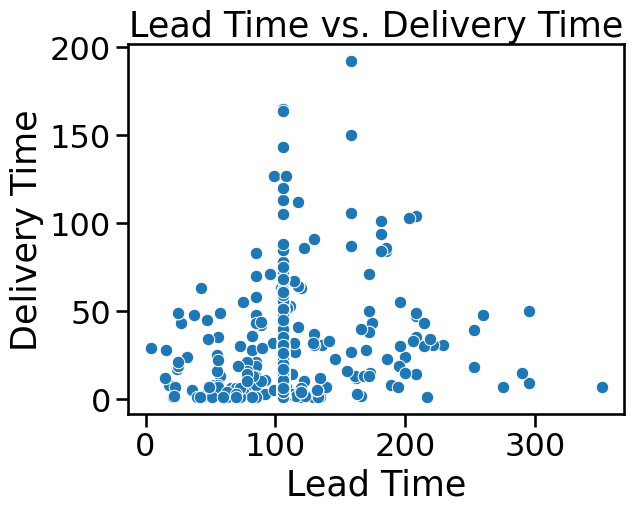

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Example: Scatter plot of Delivery Time vs. Lead Time
sns.scatterplot(x='Lead Time', y='Delivery Time', data=df)
plt.title('Lead Time vs. Delivery Time')
plt.show()


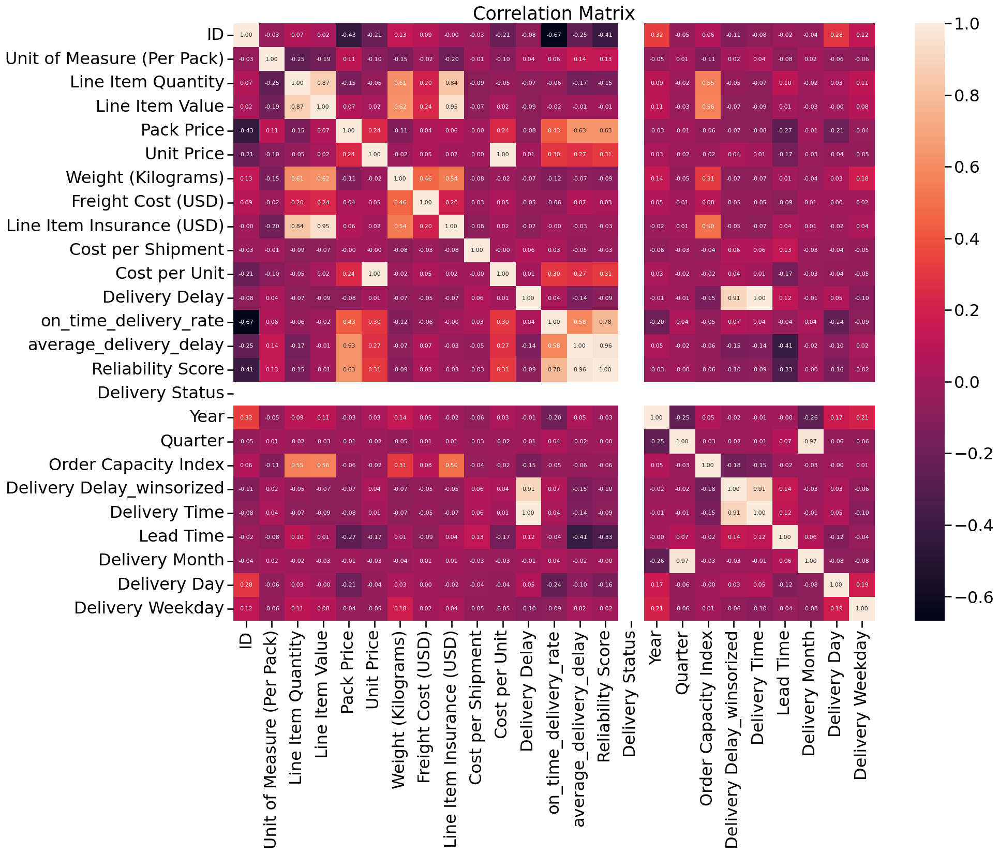

In [ ]:
correlation_matrix = df.select_dtypes(include=np.number).corr()

# Increase the figure size
plt.figure(figsize=(20, 15))  # Adjust the width and height as needed

# Create the heatmap with adjusted font size for annotations
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", annot_kws={"size": 8})  # Adjust size as needed

plt.title('Correlation Matrix')
plt.show()

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1182 entries, 23 to 9960
Data columns (total 99 columns):
 #   Column                                                                    Non-Null Count  Dtype         
---  ------                                                                    --------------  -----         
 0   ID                                                                        1182 non-null   float64       
 1   Project Code                                                              1182 non-null   object        
 2   PQ #                                                                      1182 non-null   object        
 3   PO / SO #                                                                 1182 non-null   object        
 4   ASN/DN #                                                                  1182 non-null   object        
 5   Managed By                                                                1182 non-null   object        
 6   Fulfill Via 

## Model training

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
import seaborn as sns
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

In [ ]:
from sklearn.model_selection import train_test_split

X = df.drop(['Delivery Time', 'ID', 'Delivered to Client Date', 'Scheduled Delivery Date'], axis=1)
y = df['Delivery Time']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.8, random_state=42)


In [ ]:
# Apply pd.get_dummies only on the training set
X_train = pd.get_dummies(X_train)

# Convert datetime columns to numerical (e.g., Unix timestamps)
for col in X_train.select_dtypes(include=['datetime64']).columns:
    X_train[col] = X_train[col].astype(np.int64) // 10**9  # Convert to Unix timestamp

# Apply the same encoding and datetime conversion to the testing set
X_test = pd.get_dummies(X_test).reindex(columns=X_train.columns, fill_value=0)
for col in X_test.select_dtypes(include=['datetime64']).columns:
    X_test[col] = X_test[col].astype(np.int64) // 10**9

# Initialize and train the RandomForestRegressor model
model = RandomForestRegressor(n_estimators=50, random_state=42)
model.fit(X_train, y_train)

RandomForestRegressor(n_estimators=50, random_state=42)

In [ ]:
y_pred = model.predict(X_test)
y_pred


array([  8.92, 137.24,  14.04,  66.96,  11.96,  57.92,  16.12,  10.94,
         5.  ,  31.4 ,  50.46,  23.78,  13.  ,  14.1 ,  21.02,   8.04,
         5.98,  22.78,  21.82,  25.72,  10.  ,  22.7 ,  23.7 ,  81.76,
         3.  ,   7.  ,   7.  ,  33.34,   5.98,  18.96,   5.98,  23.72,
         8.02,  46.  ,  12.  ,   4.  ,   5.98,   9.94,  30.14,   6.  ,
         9.  ,   2.  ,   4.  ,  12.08,  20.88,   7.  ,   4.  ,  34.  ,
        16.64,  19.12,   5.02,   8.02,   2.  ,   7.  ,   4.  ,   2.  ,
        18.94,  18.96,  12.08,   7.  ,  12.9 ,   1.  ,   5.02,   5.  ,
        19.84,  19.02,  91.96,  51.62,  15.02,   7.  ,   8.02, 116.48,
         5.98,   3.  ,  23.5 ,   7.  ,  19.  ,   1.  ,   5.02,   1.  ,
        16.72,  44.22,   4.  ,   5.  ,   1.  ,  12.84,  15.24,   8.02,
         8.04,  14.92,   3.  ,  43.86,  10.  ,  13.  ,   5.  ,  19.8 ,
         9.  ,  16.56,  21.92,  17.82,  35.76,  21.68,  29.8 ,  14.86,
        16.  ,  48.1 ,   7.  ,  10.  ,   8.02,  15.94,  16.16,  13.  ,
      

In [ ]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'MAE: {mae}, MSE: {mse}, R²: {r2}')


MAE: 0.9763530655391122, MSE: 17.719067758985204, R²: 0.9775091927729056


In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix


MAE: 0.9985835095137419, MSE: 17.576170401691332, R²: 0.9776905723443295


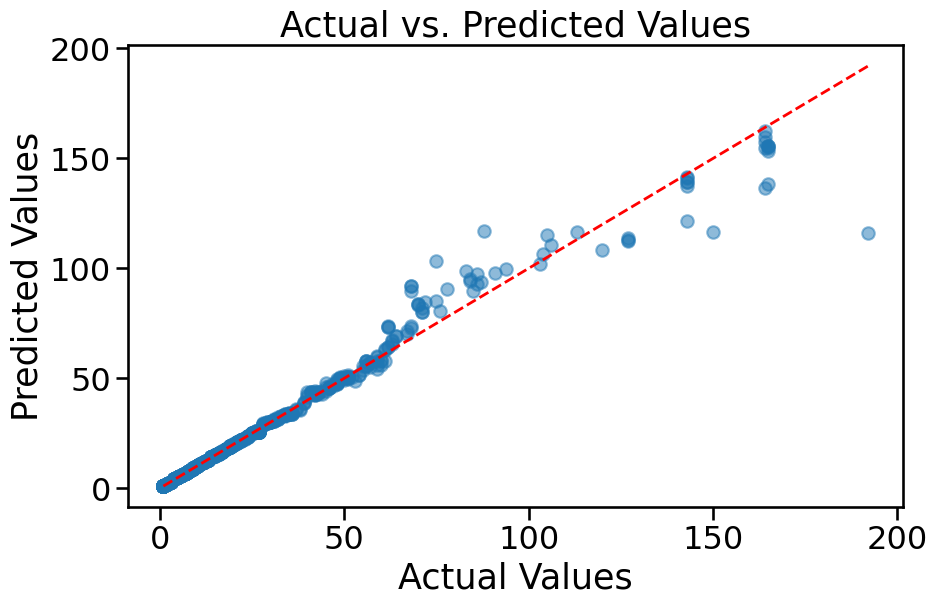

In [ ]:
y_pred = model.predict(X_test)

# Evaluate using regression metrics
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'MAE: {mae}, MSE: {mse}, R²: {r2}')

# Visualize predictions vs. actual values (optional)
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)  # Add a diagonal line for reference
plt.title('Actual vs. Predicted Values')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.show()

In [ ]:
# Convert 'Delivery Delay' into binary classification target
df['Delivery_Status'] = (df['Delivery Delay'] > 0).astype(int)  # 1 = Late, 0 = On Time


In [ ]:
print(y.unique())


[  8.  29.  28.  15.   4.  35.  24.  34.  13.  21.  43.  48.  45.   3.
   7.  63.  12. 127.  17.  49.  38.  27.  18.   5.  14.  20.   1. 104.
  30. 192.  64.   2.  25.  91.  10.  53.  87.  70.  31.  19.  55. 106.
  47.   6.  37.  16.  22. 103. 101.   9.  84.  86.  32.  40.  94.  67.
 150. 112.  83.  50.  36.  71.  42.  11.  58.  39.  41.  52.  44.  33.
  23.  51.  26. 165.  88.  72.  56.  68.  60.  46. 143.  62.  77.  61.
 164.  59.  54.  75.  57. 113.  76.  78.  85. 105. 120.]


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1182 entries, 23 to 9960
Data columns (total 100 columns):
 #   Column                                                                    Non-Null Count  Dtype         
---  ------                                                                    --------------  -----         
 0   ID                                                                        1182 non-null   float64       
 1   Project Code                                                              1182 non-null   object        
 2   PQ #                                                                      1182 non-null   object        
 3   PO / SO #                                                                 1182 non-null   object        
 4   ASN/DN #                                                                  1182 non-null   object        
 5   Managed By                                                                1182 non-null   object        
 6   Fulfill Via

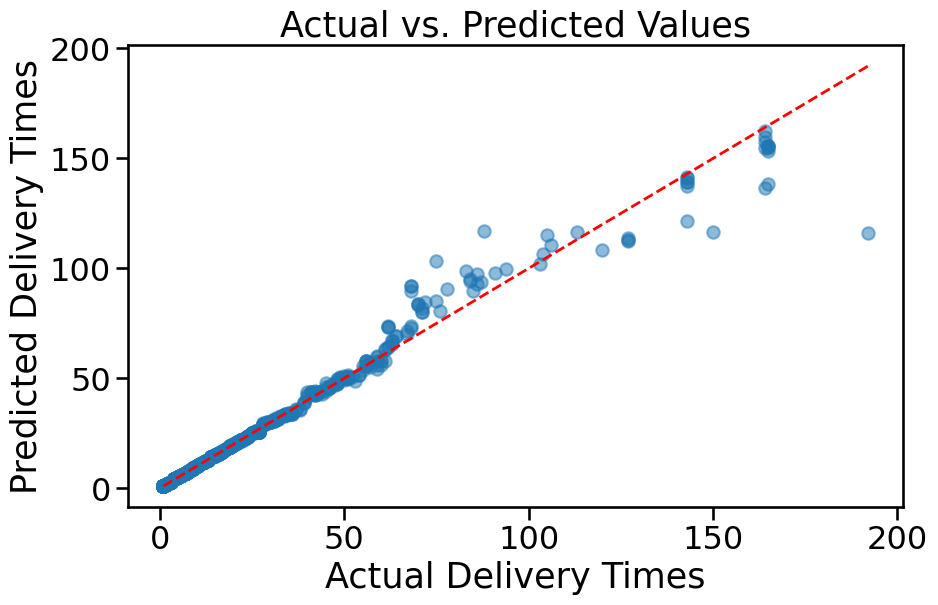

In [ ]:
# Visualize Actual vs. Predicted values
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)  # Reference line
plt.title('Actual vs. Predicted Values')
plt.xlabel('Actual Delivery Times')
plt.ylabel('Predicted Delivery Times')
plt.show()

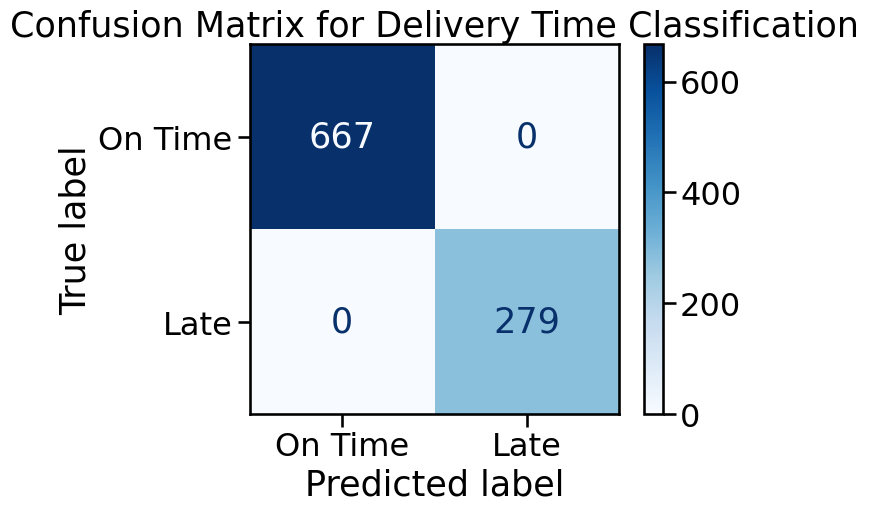

NameError: name 'classification_report' is not defined

In [ ]:
# Define a threshold for classification based on Scheduled Delivery Date
threshold = y.mean()

# Classify actual and predicted values based on the threshold
y_test_class = (y_test > threshold).astype(int)  # 1 = Late, 0 = On Time
y_pred_class = (y_pred > threshold).astype(int)  # 1 = Late, 0 = On Time

# Confusion Matrix
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
cm = confusion_matrix(y_test_class, y_pred_class)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['On Time', 'Late'])
disp.plot(cmap="Blues")
plt.title("Confusion Matrix for Delivery Time Classification")
plt.show()

# Classification Report
print(classification_report(y_test_class, y_pred_class, target_names=['On Time', 'Late']))

## Tuning

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV

# Define the model
model = RandomForestRegressor()

# Define the parameter grid
param_grid = {
    'n_estimators': [50, 100, 150, 200],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5],
}

# Set up Grid Search
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error')

# Fit the model
grid_search.fit(X_train, y_train)

# Best parameters
print("Best parameters:", grid_search.best_params_)


Best parameters: {'max_depth': None, 'min_samples_split': 2, 'n_estimators': 50}


In [ ]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Predictions on training and testing sets
y_train_pred = model.predict(X_train)
y_test_pred = model.predict(X_test)

# Calculate metrics for training set
train_mae = mean_absolute_error(y_train, y_train_pred)
train_mse = mean_squared_error(y_train, y_train_pred)
train_r2 = r2_score(y_train, y_train_pred)

# Calculate metrics for testing set
test_mae = mean_absolute_error(y_test, y_test_pred)
test_mse = mean_squared_error(y_test, y_test_pred)
test_r2 = r2_score(y_test, y_test_pred)

# Print the results
print("Training Metrics:")
print(f"MAE: {train_mae}, MSE: {train_mse}, R²: {train_r2}")

print("\nTesting Metrics:")
print(f"MAE: {test_mae}, MSE: {test_mse}, R²: {test_r2}")


Training Metrics:
MAE: 0.31669491525423743, MSE: 0.9388966101694931, R²: 0.9989461587638796

Testing Metrics:
MAE: 0.9985835095137419, MSE: 17.576170401691332, R²: 0.9776905723443295


                        Feature           Importance
13               Delivery Delay                 0.55
22    Delivery Delay_winsorized                 0.40
771   First Line Designation_No                 0.01
772  First Line Designation_Yes                 0.01
9            Freight Cost (USD)                 0.00
..                          ...                  ...
321          PO / SO #_SO-37890                 0.00
322          PO / SO #_SO-38200                 0.00
323          PO / SO #_SO-38211                 0.00
324          PO / SO #_SO-38213                 0.00
313          PO / SO #_SO-37500                 0.00

[806 rows x 2 columns]


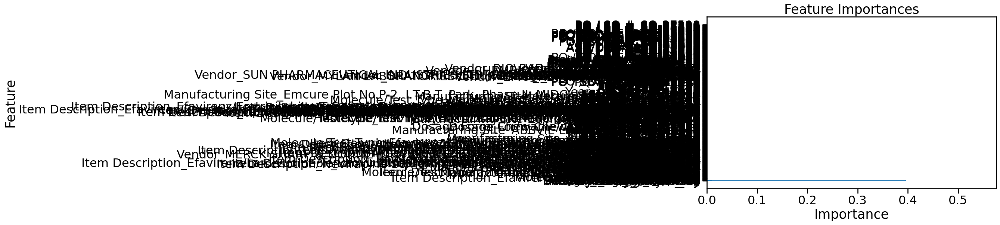

In [ ]:
# prompt: use feature importance

# Get feature importances
importances = model.feature_importances_

# Create a DataFrame for visualization
feature_importance_df = pd.DataFrame({'Feature': X_train.columns, 'Importance': importances})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Print feature importance
print(feature_importance_df)

# Bar plot of feature importances
plt.figure(figsize=(10, 6))
plt.barh(feature_importance_df['Feature'], feature_importance_df['Importance'])
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importances')
plt.show()

In [ ]:
# prompt: drop unimportant colo=umns

import pandas as pd
import numpy as np

# Assuming your DataFrame is named 'df'
# Replace 'df' with the actual name of your dataframe if different

# List of columns to drop
columns_to_drop = ['ID', 'Delivered to Client Date', 'Scheduled Delivery Date', 'PO Sent to Vendor Date']

# Check if columns exist before dropping
columns_to_drop = [col for col in columns_to_drop if col in df.columns]

# Drop the columns
df = df.drop(columns=columns_to_drop, errors='ignore')

# Display info to confirm changes
df.info()

In [ ]:
import shap

# Train a Random Forest model
model = RandomForestRegressor()
model.fit(X_train, y_train)

# Create SHAP explainer
explainer = shap.Explainer(model, X_train)
shap_values = explainer(X_test)

# Plot SHAP values
shap.summary_plot(shap_values, X_test)


TypeError: Cannot cast array data from dtype('O') to dtype('float64') according to the rule 'safe'

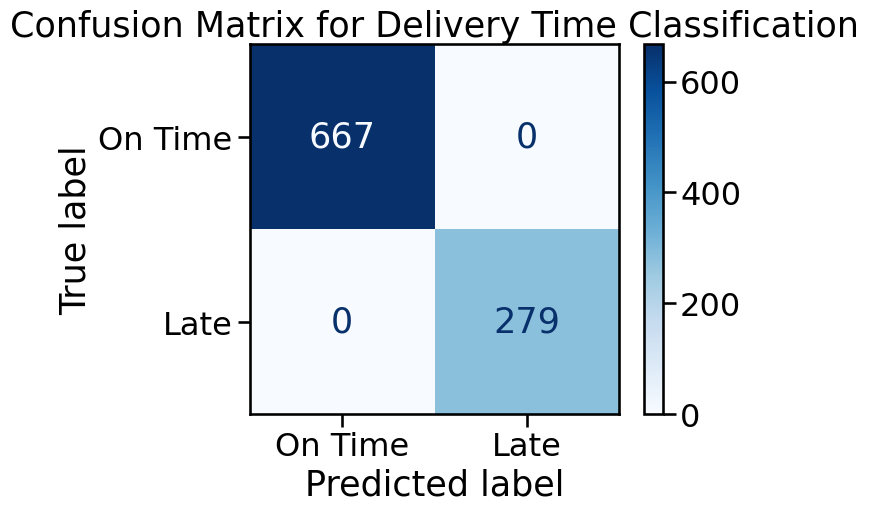

              precision    recall  f1-score   support

     On Time       1.00      1.00      1.00       667
        Late       1.00      1.00      1.00       279

    accuracy                           1.00       946
   macro avg       1.00      1.00      1.00       946
weighted avg       1.00      1.00      1.00       946



In [ ]:
# Define a threshold for classification based on Scheduled Delivery Date
threshold = y.mean()

# Classify actual and predicted values based on the threshold
y_test_class = (y_test > threshold).astype(int)  # 1 = Late, 0 = On Time
y_pred_class = (y_pred > threshold).astype(int)  # 1 = Late, 0 = On Time

# Confusion Matrix
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
cm = confusion_matrix(y_test_class, y_pred_class)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['On Time', 'Late'])
disp.plot(cmap="Blues")
plt.title("Confusion Matrix for Delivery Time Classification")
plt.show()

# Classification Report
# Import the classification_report function
from sklearn.metrics import classification_report
print(classification_report(y_test_class, y_pred_class, target_names=['On Time', 'Late']))